### Deliverable 1: Preprocessing the Data for a Neural Network

In [1]:
# Import our dependencies
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

#  Import and read the charity_data.csv.
import pandas as pd 
application_df = pd.read_csv("charity_data.csv")
application_df

,EIN,NAME,APPLICATION_TYPE,AFFILIATION,CLASSIFICATION,USE_CASE,ORGANIZATION,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,10520599,BLUE KNIGHTS MOTORCYCLE CLUB,T10,Independent,C1000,ProductDev,Association,1,0,N,5000,1
1,10531628,AMERICAN CHESAPEAKE CLUB CHARITABLE TR,T3,Independent,C2000,Preservation,Co-operative,1,1-9999,N,108590,1
2,10547893,ST CLOUD PROFESSIONAL FIREFIGHTERS,T5,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
3,10553066,SOUTHSIDE ATHLETIC ASSOCIATION,T3,CompanySponsored,C2000,Preservation,Trust,1,10000-24999,N,6692,1
4,10556103,GENETIC RESEARCH INSTITUTE OF THE DESERT,T3,Independent,C1000,Heathcare,Trust,1,100000-499999,N,142590,1
...,...,...,...,...,...,...,...,...,...,...,...,...
34294,996009318,THE LIONS CLUB OF HONOLULU KAMEHAMEHA,T4,Independent,C1000,ProductDev,Association,1,0,N,5000,0
34295,996010315,INTERNATIONAL ASSOCIATION OF LIONS CLUBS,T4,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
34296,996012607,PTA HAWAII CONGRESS,T3,CompanySponsored,C2000,Preservation,Association,1,0,N,5000,0
34297,996015768,AMERICAN FEDERATION OF GOVERNMENT EMPLOYEES LO...,T5,Independent,C3000,ProductDev,Association,1,0,N,5000,1


In [2]:
# Drop the non-beneficial ID columns, 'EIN' and 'NAME'.
application_df = application_df.drop(columns = ['EIN', 'NAME'])
application_df

,APPLICATION_TYPE,AFFILIATION,CLASSIFICATION,USE_CASE,ORGANIZATION,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,T10,Independent,C1000,ProductDev,Association,1,0,N,5000,1
1,T3,Independent,C2000,Preservation,Co-operative,1,1-9999,N,108590,1
2,T5,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
3,T3,CompanySponsored,C2000,Preservation,Trust,1,10000-24999,N,6692,1
4,T3,Independent,C1000,Heathcare,Trust,1,100000-499999,N,142590,1
...,...,...,...,...,...,...,...,...,...,...
34294,T4,Independent,C1000,ProductDev,Association,1,0,N,5000,0
34295,T4,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
34296,T3,CompanySponsored,C2000,Preservation,Association,1,0,N,5000,0
34297,T5,Independent,C3000,ProductDev,Association,1,0,N,5000,1


In [3]:
# Determine the number of unique values in each column.
application_df.nunique()

APPLICATION_TYPE            17
AFFILIATION                  6
CLASSIFICATION              71
USE_CASE                     5
ORGANIZATION                 4
STATUS                       2
INCOME_AMT                   9
SPECIAL_CONSIDERATIONS       2
ASK_AMT                   8747
IS_SUCCESSFUL                2
dtype: int64

In [4]:
# Look at APPLICATION_TYPE value counts for binning
application_counts = application_df['APPLICATION_TYPE'].value_counts()
application_counts

T3     27037
T4      1542
T6      1216
T5      1173
T19     1065
T8       737
T7       725
T10      528
T9       156
T13       66
T12       27
T2        16
T14        3
T25        3
T29        2
T15        2
T17        1
Name: APPLICATION_TYPE, dtype: int64

<AxesSubplot:ylabel='Density'>

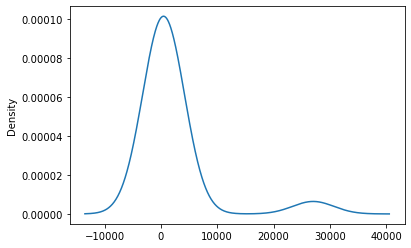

In [5]:
# Visualize the value counts of APPLICATION_TYPE
application_counts.plot.density()

In [6]:
# Determine which values to replace if counts are less than ...?

replace_application = ['T9','T13','T12',
                        'T2', 'T25', 'T14', 'T29', 'T15', 'T17']

# Replace in dataframe
for app in replace_application:
    application_df.APPLICATION_TYPE = application_df.APPLICATION_TYPE.replace(app,"Other")
    
# Check to make sure binning was successful
application_df.APPLICATION_TYPE.value_counts()

T3       27037
T4        1542
T6        1216
T5        1173
T19       1065
T8         737
T7         725
T10        528
Other      276
Name: APPLICATION_TYPE, dtype: int64

In [7]:
# Look at CLASSIFICATION value counts for binning
classification_counts = application_df['CLASSIFICATION'].value_counts()
classification_counts

C1000    17326
C2000     6074
C1200     4837
C3000     1918
C2100     1883
         ...  
C2150        1
C1570        1
C1236        1
C4200        1
C5200        1
Name: CLASSIFICATION, Length: 71, dtype: int64

<AxesSubplot:ylabel='Density'>

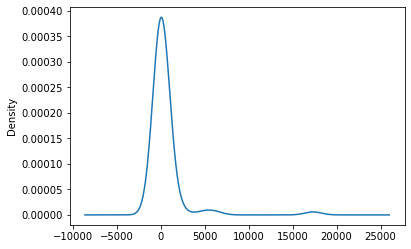

In [8]:
# Visualize the value counts of CLASSIFICATION
classification_counts.plot.density()

In [9]:
# Determine which values to replace if counts are less than ..?

replace_class = classification_counts[classification_counts <= 800].index

# Replace in dataframe
for cls in replace_class:
    application_df.CLASSIFICATION = application_df.CLASSIFICATION.replace(cls,"Other")
    
# Check to make sure binning was successful
application_df.CLASSIFICATION.value_counts()

C1000    17326
C2000     6074
C1200     4837
Other     2261
C3000     1918
C2100     1883
Name: CLASSIFICATION, dtype: int64

In [10]:
# Generate our categorical variable lists
categorical_variables = application_df.columns[application_df.dtypes == "object"]

#categorical_variables = application_df.dtypes[application_df.dtypes == "object"].index.tolist()
categorical_variables

Index(['APPLICATION_TYPE', 'AFFILIATION', 'CLASSIFICATION', 'USE_CASE',
       'ORGANIZATION', 'INCOME_AMT', 'SPECIAL_CONSIDERATIONS'],
      dtype='object')

In [11]:
# Create a OneHotEncoder instance
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(sparse=False)

# Fit and transform the OneHotEncoder using the categorical variable list
encode_df = pd.DataFrame(enc.fit_transform(application_df[categorical_variables]))

# Add the encoded variable names to the dataframe
encode_df.columns = enc.get_feature_names(categorical_variables)
encode_df.head()

,APPLICATION_TYPE_Other,APPLICATION_TYPE_T10,APPLICATION_TYPE_T19,APPLICATION_TYPE_T3,APPLICATION_TYPE_T4,APPLICATION_TYPE_T5,APPLICATION_TYPE_T6,APPLICATION_TYPE_T7,APPLICATION_TYPE_T8,AFFILIATION_CompanySponsored,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [12]:
# Merge one-hot encoded features and drop the originals
application_df1 = application_df.merge(encode_df, left_index=True, right_index=True).drop(categorical_variables, 1)
application_df1.head()

,STATUS,ASK_AMT,IS_SUCCESSFUL,APPLICATION_TYPE_Other,APPLICATION_TYPE_T10,APPLICATION_TYPE_T19,APPLICATION_TYPE_T3,APPLICATION_TYPE_T4,APPLICATION_TYPE_T5,APPLICATION_TYPE_T6,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,1,5000,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,108590,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,5000,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1,6692,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1,142590,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [13]:
# Split our preprocessed data into our features and target arrays
X = application_df1.drop(columns = 'IS_SUCCESSFUL').values
y = application_df1.IS_SUCCESSFUL.values

# Split the preprocessed data into a training and testing dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)

In [14]:
# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

### Attempt 1

In [15]:
# Define the model - deep neural net, i.e., the number of input features and hidden nodes for each layer.
number_input_features = len(X_train[0])
hidden_nodes_layer1 = 110
hidden_nodes_layer2 = 50
hidden_nodes_layer3 = 15

nn = tf.keras.models.Sequential()

# First hidden layer
nn.add(
    tf.keras.layers.Dense(units=hidden_nodes_layer1, input_dim=number_input_features, activation="relu")
)

# Second hidden layer
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer2, activation="relu"))

# Third hidden layer
nn.add(tf.keras.layers.Dense(units= hidden_nodes_layer3, activation="relu"))

# Output layer
nn.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

# Check the structure of the model
nn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 110)               4840      
_________________________________________________________________
dense_1 (Dense)              (None, 50)                5550      
_________________________________________________________________
dense_2 (Dense)              (None, 15)                765       
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 16        
Total params: 11,171
Trainable params: 11,171
Non-trainable params: 0
_________________________________________________________________


In [16]:
# Compile the model
nn.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [17]:
# Import checkpoint dependencies
import os
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the checkpoint path and filenames
os.makedirs("Optimized checkpoints/",exist_ok=True)
checkpoint_path = "Optimized checkpoints/weights.{epoch:02d}.hdf5"

# Create a callback that saves the model's weights every 5 epochs
cp_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    verbose=1,
    save_weights_only=True,
    save_freq=5)
    
#callbacks=[cp_callback]

In [18]:
# Train the model
fit_model = nn.fit(X_train,y_train,epochs=100, callbacks=[cp_callback])

Epoch 1/100
  1/804 [..............................] - ETA: 7:54 - loss: 600.8010 - accuracy: 0.5312
Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5
 16/804 [..............................] - ETA: 2s - loss: 2464.8154 - accuracy: 0.4551 
Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5
 32/804 [>.............................] - ETA: 2s - loss: 6405.2476 - accuracy: 0.4756
Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5
 46/804 [>.............................] - ETA: 2s - loss: 9632.6621 - accuracy: 0.4871
Epoch 00001: saving model


Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5
416/804 [==============>...............] - ETA: 1s - loss: 7229.7573 - accuracy: 0.4897
Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5
431/804 [===============>..............] - ETA: 1s - loss: 6998.9482 - accuracy: 0.4901
Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5
445/804 [===============>..............] - ETA: 1s - loss: 6884.0186 - accuracy: 0.4915
Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints/weights.01.hdf5
456/804 [================>.............] - ETA: 1s - loss: 7173.1191 - accuracy: 0.4909
Epoch 00001: saving model to Optimized 


Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5
 12/804 [..............................] - ETA: 4s - loss: 25799.1484 - accuracy: 0.5677
Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5
 27/804 [>.............................] - ETA: 3s - loss: 13009.1240 - accuracy: 0.4988
Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5
 42/804 [>.............................] - ETA: 3s - loss: 8759.1230 - accuracy: 0.4836 
Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5
 57/804 [=>............................] - ETA: 3s - los


Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5
426/804 [==============>...............] - ETA: 1s - loss: 26344.3223 - accuracy: 0.5092
Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5
437/804 [===============>..............] - ETA: 1s - loss: 26248.2051 - accuracy: 0.5086
Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5
452/804 [===============>..............] - ETA: 1s - loss: 25418.6777 - accuracy: 0.5098
Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints/weights.02.hdf5
465/804 [================>.............] - ETA: 1s - loss: 24913.5234 - accuracy: 0.5109
Epoch 00002: saving model to Optimi


Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5
 13/804 [..............................] - ETA: 3s - loss: 8977.5947 - accuracy: 0.4351
Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5
 28/804 [>.............................] - ETA: 3s - loss: 5622.5977 - accuracy: 0.4609
Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5
 43/804 [>.............................] - ETA: 3s - loss: 18240.9004 - accuracy: 0.4528
Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5
 53/804 [>.............................] - ETA: 3s - loss: 14919.2559 - accuracy: 0.4517
Epoch 00003: saving model to Optimize

413/804 [==============>...............] - ETA: 1s - loss: 9397.6885 - accuracy: 0.4862
Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5
424/804 [==============>...............] - ETA: 1s - loss: 9276.9814 - accuracy: 0.4864
Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5
435/804 [===============>..............] - ETA: 1s - loss: 9200.4814 - accuracy: 0.4866
Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5
448/804 [===============>..............] - ETA: 1s - loss: 8960.3428 - accuracy: 0.4867
Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints/weights.03.hdf5
461/804 [================>.............]

  1/804 [..............................] - ETA: 1s - loss: 966.3837 - accuracy: 0.4062
Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5
 14/804 [..............................] - ETA: 3s - loss: 1049.2537 - accuracy: 0.4665
Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5
 29/804 [>.............................] - ETA: 3s - loss: 1488.9749 - accuracy: 0.4634
Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5
 40/804 [>.............................] - ETA: 3s - loss: 2320.0295 - accuracy: 0.4602
Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized c

404/804 [==============>...............] - ETA: 1s - loss: 7705.0791 - accuracy: 0.4968
Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5
418/804 [==============>...............] - ETA: 1s - loss: 7456.0454 - accuracy: 0.4978
Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5
429/804 [===============>..............] - ETA: 1s - loss: 7492.4517 - accuracy: 0.4969
Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5
444/804 [===============>..............] - ETA: 1s - loss: 7477.7676 - accuracy: 0.4973
Epoch 00004: saving model to Optimized checkpoints/weights.04.hdf5

Epoch 00004: saving model to Optimized 

804/804 [==============================] - 4s 4ms/step - loss: 13696.1182 - accuracy: 0.4914
Epoch 5/100
  1/804 [..............................] - ETA: 2s - loss: 192.3312 - accuracy: 0.4688
Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5
 15/804 [..............................] - ETA: 3s - loss: 1261.7424 - accuracy: 0.5104
Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5
 29/804 [>.............................] - ETA: 3s - loss: 1364.1033 - accuracy: 0.5162
Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5
 40/804 [>.............................] - ETA: 3s - loss: 1486.1912 - accuracy: 0.5305
Epo

395/804 [=============>................] - ETA: 1s - loss: 10399.3975 - accuracy: 0.4862
Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5
407/804 [==============>...............] - ETA: 1s - loss: 11093.3418 - accuracy: 0.4855
Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5
420/804 [==============>...............] - ETA: 1s - loss: 10759.5264 - accuracy: 0.4850
Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5
432/804 [===============>..............] - ETA: 1s - loss: 10482.4697 - accuracy: 0.4850
Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints/weights.05.hdf5
444/804 [===============>...........

Epoch 6/100
  1/804 [..............................] - ETA: 2s - loss: 17776.5254 - accuracy: 0.6250
Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5
 15/804 [..............................] - ETA: 2s - loss: 2747.3062 - accuracy: 0.5146 
Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5
 26/804 [..............................] - ETA: 3s - loss: 3858.7654 - accuracy: 0.5012
Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5
 41/804 [>.............................] - ETA: 3s - loss: 2646.7004 - accuracy: 0.4893
Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model

416/804 [==============>...............] - ETA: 1s - loss: 14878.4492 - accuracy: 0.4995
Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5
431/804 [===============>..............] - ETA: 1s - loss: 14443.1377 - accuracy: 0.4996
Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5
446/804 [===============>..............] - ETA: 1s - loss: 14105.1221 - accuracy: 0.4978
Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints/weights.06.hdf5
461/804 [================>.............] - ETA: 1s - loss: 13893.6367 - accuracy: 0.4976
Epoch 00006: saving model to Optimi


Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5
 27/804 [>.............................] - ETA: 3s - loss: 43815.6914 - accuracy: 0.4722
Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5
 42/804 [>.............................] - ETA: 3s - loss: 28246.0117 - accuracy: 0.4621
Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5
 55/804 [=>............................] - ETA: 3s - loss: 21636.1426 - accuracy: 0.4636
Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5
 67/804 [=>............................] - ETA: 3s - los

427/804 [==============>...............] - ETA: 1s - loss: 5018.3018 - accuracy: 0.5085
Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5
441/804 [===============>..............] - ETA: 1s - loss: 4934.4961 - accuracy: 0.5087
Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5
452/804 [===============>..............] - ETA: 1s - loss: 4816.2285 - accuracy: 0.5088
Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5
467/804 [================>.............] - ETA: 1s - loss: 4662.6738 - accuracy: 0.5090
Epoch 00007: saving model to Optimized checkpoints/weights.07.hdf5

Epoch 00007: saving model to Optimized 

 28/804 [>.............................] - ETA: 3s - loss: 168.5190 - accuracy: 0.4676
Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5
 40/804 [>.............................] - ETA: 3s - loss: 123.9637 - accuracy: 0.4836
Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5
 53/804 [>.............................] - ETA: 3s - loss: 99.4856 - accuracy: 0.4823 
Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5
 68/804 [=>............................] - ETA: 3s - loss: 81.7943 - accuracy: 0.4853
Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized check

438/804 [===============>..............] - ETA: 1s - loss: 24.7210 - accuracy: 0.5263
Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5
453/804 [===============>..............] - ETA: 1s - loss: 23.9506 - accuracy: 0.5259
Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5
468/804 [================>.............] - ETA: 1s - loss: 23.2894 - accuracy: 0.5261
Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints/weights.08.hdf5
484/804 [=================>............] - ETA: 1s - loss: 22.5971 - accuracy: 0.5247
Epoch 00008: saving model to Optimized checkpoi


Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5
 53/804 [>.............................] - ETA: 3s - loss: 0.8871 - accuracy: 0.5389
Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5
 64/804 [=>............................] - ETA: 3s - loss: 1.0804 - accuracy: 0.5332
Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5
 79/804 [=>............................] - ETA: 3s - loss: 1.0359 - accuracy: 0.5344
Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5
 94/804 [==>...........................] - ETA: 3s - loss: 1.0098 - 

469/804 [================>.............] - ETA: 1s - loss: 0.9553 - accuracy: 0.5366
Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5
484/804 [=================>............] - ETA: 1s - loss: 0.9493 - accuracy: 0.5359
Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5
499/804 [=================>............] - ETA: 1s - loss: 0.9439 - accuracy: 0.5349
Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints/weights.09.hdf5
514/804 [==================>...........] - ETA: 1s - loss: 0.9380 - accuracy: 0.5350
Epoch 00009: saving model to Optimized checkpoints/

 70/804 [=>............................] - ETA: 3s - loss: 0.7106 - accuracy: 0.5504
Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5
 83/804 [==>...........................] - ETA: 2s - loss: 0.7126 - accuracy: 0.5467
Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5
 95/804 [==>...........................] - ETA: 2s - loss: 0.7162 - accuracy: 0.5405
Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5
109/804 [===>..........................] - ETA: 2s - loss: 0.7173 - accuracy: 0.5381
Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/


Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.7118 - accuracy: 0.5341
Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.7115 - accuracy: 0.5342
Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5
525/804 [==================>...........] - ETA: 1s - loss: 0.7110 - accuracy: 0.5347
Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints/weights.10.hdf5
539/804 [===================>..........] - ETA: 1s - loss: 0.7104 - 

 96/804 [==>...........................] - ETA: 3s - loss: 0.6941 - accuracy: 0.5400
Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5
111/804 [===>..........................] - ETA: 2s - loss: 0.6939 - accuracy: 0.5405
Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5
126/804 [===>..........................] - ETA: 2s - loss: 0.6940 - accuracy: 0.5399
Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5
139/804 [====>.........................] - ETA: 2s - loss: 0.6948 - accuracy: 0.5373
Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/


Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5
521/804 [==================>...........] - ETA: 1s - loss: 0.6948 - accuracy: 0.5312
Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5
536/804 [===================>..........] - ETA: 1s - loss: 0.6947 - accuracy: 0.5312
Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5
551/804 [===================>..........] - ETA: 1s - loss: 0.6948 - accuracy: 0.5306
Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints/weights.11.hdf5
566/804 [====================>.........] - ETA: 0s - loss: 0.6949 - 


Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5
142/804 [====>.........................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5420
Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5
157/804 [====>.........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5412
Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5
162/804 [=====>........................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5417
Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5
174/804 [=====>........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5436
Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints/

552/804 [===================>..........] - ETA: 1s - loss: 0.6914 - accuracy: 0.5319
Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5
567/804 [====================>.........] - ETA: 0s - loss: 0.6914 - accuracy: 0.5324
Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5
582/804 [====================>.........] - ETA: 0s - loss: 0.6914 - accuracy: 0.5321
Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints/weights.12.hdf5
597/804 [=====================>........] - ETA: 0s - loss: 0.6913 - accuracy: 0.5325
Epoch 00012: saving model to Optimized checkpoints/

163/804 [=====>........................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5391
Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5
177/804 [=====>........................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5371
Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5
188/804 [======>.......................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5331
Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5
203/804 [======>.......................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5323
Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/

587/804 [====================>.........] - ETA: 0s - loss: 0.6911 - accuracy: 0.5326
Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5
598/804 [=====================>........] - ETA: 0s - loss: 0.6911 - accuracy: 0.5322
Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5
610/804 [=====================>........] - ETA: 0s - loss: 0.6912 - accuracy: 0.5312
Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5
623/804 [======================>.......] - ETA: 0s - loss: 0.6913 - accuracy: 0.5308
Epoch 00013: saving model to Optimized checkpoints/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints/


Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5
194/804 [======>.......................] - ETA: 2s - loss: 0.6915 - accuracy: 0.5290
Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5
209/804 [======>.......................] - ETA: 2s - loss: 0.6915 - accuracy: 0.5293
Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5
224/804 [=======>......................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5303
Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5


609/804 [=====================>........] - ETA: 0s - loss: 0.6911 - accuracy: 0.5325
Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5
624/804 [======================>.......] - ETA: 0s - loss: 0.6910 - accuracy: 0.5333
Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5
637/804 [======================>.......] - ETA: 0s - loss: 0.6910 - accuracy: 0.5333
Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5
649/804 [=======================>......] - ETA: 0s - loss: 0.6909 - accuracy: 0.5339
Epoch 00014: saving model to Optimized checkpoints/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints/

225/804 [=======>......................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5367
Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5
240/804 [=======>......................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5355
Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5
255/804 [========>.....................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5368
Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5
270/804 [=========>....................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5339
Epoch 00015: saving model to Optimized checkpoints/


Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5
655/804 [=======================>......] - ETA: 0s - loss: 0.6913 - accuracy: 0.5306
Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5
670/804 [========================>.....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5314
Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5323
Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints/weights.15.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5325
Epoch 00015: saving model to Optimized checkpoints/


Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5
261/804 [========>.....................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5359
Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5
276/804 [=========>....................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5354
Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5
289/804 [=========>....................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5333
Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5
301/804 [==========>...................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5339
Epoch 00016: saving model to Optimized checkpoints/

676/804 [========================>.....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5330
Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5330
Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5328
Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5320
Epoch 00016: saving model to Optimized checkpoints/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints/

290/804 [=========>....................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5332
Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5
302/804 [==========>...................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5326
Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5
317/804 [==========>...................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5320
Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5
332/804 [===========>..................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5329
Epoch 00017: saving model to Optimized checkpoints/


Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5326
Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5330
Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5328
Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints/weights.17.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6911 - 


Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5
323/804 [===========>..................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5346
Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5
337/804 [===========>..................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5339
Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5
348/804 [===========>..................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5321
Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5
363/804 [============>.................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5325
Epoch 00018: saving model to Optimized checkpoints/

738/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5333
Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6909 - accuracy: 0.5336
Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6909 - accuracy: 0.5339
Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints/weights.18.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6909 - accuracy: 0.5336
Epoch 00018: saving model to Optimized checkpoints/

349/804 [============>.................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5340
Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5
364/804 [============>.................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5331
Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5
379/804 [=============>................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5340
Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5
393/804 [=============>................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5337
Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints/


Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5317
Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5322
Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.6910 - accuracy: 0.5327
Epoch 00019: saving model to Optimized checkpoints/weights.19.hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.6911 - accuracy: 0.5324
Epoch 20/100
  1/804 [..............................] - ETA: 2s - loss: 0.7082 - accuracy: 0.4062
Epoch 00020: savi

365/804 [============>.................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5342
Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5
380/804 [=============>................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5335
Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5343
Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.6909 - accuracy: 0.5336
Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints/

775/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5327
Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6910 - accuracy: 0.5330
Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6910 - accuracy: 0.5328
Epoch 00020: saving model to Optimized checkpoints/weights.20.hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.6911 - accuracy: 0.5324
Epoch 21/100
  1/804 [..............................] - ETA: 2s - loss: 0.6750 - accuracy: 0.6562
Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5
 15/804 [.........


Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5
371/804 [============>.................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5393
Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5
381/804 [=============>................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5389
Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5
391/804 [=============>................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5383
Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5
402/804 [==============>...............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5386
Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5
415/804 [==============>...............] - ETA: 1s -

Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5319
Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5320
Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5321
Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints/weights.21.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6911 - accuracy: 0.5324
Epoch 22/100
  1/804 [..............................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5312
Epoch 00022: savin

338/804 [===========>..................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5319
Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5
347/804 [===========>..................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5326
Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5
360/804 [============>.................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5322
Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5
370/804 [============>.................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5319
Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5
380/804 [=============>................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5323
Epoch 00022: saving model to Optimi

722/804 [=========================>....] - ETA: 0s - loss: 0.6909 - accuracy: 0.5339
Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6909 - accuracy: 0.5339
Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5328
Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5325
Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints/weights.22.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5324
Epoch 00022: saving model to Optimi

306/804 [==========>...................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5298
Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5
317/804 [==========>...................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5299
Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5
326/804 [===========>..................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5304
Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5
334/804 [===========>..................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5319
Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5
348/804 [===========>..................] - ETA: 2s -

689/804 [========================>.....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5328
Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6909 - accuracy: 0.5334
Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5333
Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5328
Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints/weights.23.hdf5
736/804 [==========================>...] - ETA: 0s -

262/804 [========>.....................] - ETA: 2s - loss: 0.6920 - accuracy: 0.5247
Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5
271/804 [=========>....................] - ETA: 2s - loss: 0.6918 - accuracy: 0.5266
Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5
281/804 [=========>....................] - ETA: 2s - loss: 0.6917 - accuracy: 0.5272
Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5
290/804 [=========>....................] - ETA: 2s - loss: 0.6918 - accuracy: 0.5268
Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5
301/804 [==========>...................] - ETA: 2s - loss: 0.6918 - accuracy: 0.5262
Epoch 00024: saving model to Optimi

639/804 [======================>.......] - ETA: 0s - loss: 0.6909 - accuracy: 0.5336
Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5
654/804 [=======================>......] - ETA: 0s - loss: 0.6910 - accuracy: 0.5332
Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.6909 - accuracy: 0.5338
Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.6909 - accuracy: 0.5338
Epoch 00024: saving model to Optimized checkpoints/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints/

213/804 [======>.......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5336
Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5
224/804 [=======>......................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5319
Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5
233/804 [=======>......................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5326
Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5
244/804 [========>.....................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5321
Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5
254/804 [========>.....................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5320
Epoch 00025: saving model to Optimi

585/804 [====================>.........] - ETA: 1s - loss: 0.6911 - accuracy: 0.5324
Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5
596/804 [=====================>........] - ETA: 1s - loss: 0.6911 - accuracy: 0.5322
Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.6912 - accuracy: 0.5314
Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.6912 - accuracy: 0.5315
Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints/weights.25.hdf5
630/804 [======================>.......] - ETA: 0s -


Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5
156/804 [====>.........................] - ETA: 3s - loss: 0.6916 - accuracy: 0.5284
Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5
166/804 [=====>........................] - ETA: 3s - loss: 0.6916 - accuracy: 0.5286
Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5
176/804 [=====>........................] - ETA: 3s - loss: 0.6914 - accuracy: 0.5298
Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5
186/804 [=====>........................] - ETA: 3s - loss: 0.6918 - accuracy: 0.5265
Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5
196/804 [======>.......................] - ETA: 3s -

526/804 [==================>...........] - ETA: 1s - loss: 0.6918 - accuracy: 0.5266
Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5
536/804 [===================>..........] - ETA: 1s - loss: 0.6917 - accuracy: 0.5276
Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5
546/804 [===================>..........] - ETA: 1s - loss: 0.6916 - accuracy: 0.5282
Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5
556/804 [===================>..........] - ETA: 1s - loss: 0.6916 - accuracy: 0.5286
Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints/weights.26.hdf5
566/804 [====================>.........] - ETA: 1s - loss: 0.6915 - accuracy: 0.5290
Epoch 00026: saving model to Optimi


Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5
 72/804 [=>............................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5443
Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5
 82/804 [==>...........................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5465
Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5
 92/804 [==>...........................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5435
Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5
102/804 [==>...........................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5426
Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5
112/804 [===>..........................] - ETA: 5s -

442/804 [===============>..............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5367
Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5
452/804 [===============>..............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5362
Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5
462/804 [================>.............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5355
Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5
472/804 [================>.............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5353
Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints/weights.27.hdf5
482/804 [================>.............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5357
Epoch 00027: saving model to Optimi


Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
  8/804 [..............................] - ETA: 6s - loss: 0.6926 - accuracy: 0.5195
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
 18/804 [..............................] - ETA: 5s - loss: 0.6916 - accuracy: 0.5278
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
 28/804 [>.............................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5435
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
 38/804 [>.............................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5436
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
 48/804 [>.............................] - ETA: 4s -

373/804 [============>.................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5300
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
383/804 [=============>................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5304
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
393/804 [=============>................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5295
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
403/804 [==============>...............] - ETA: 2s - loss: 0.6915 - accuracy: 0.5291
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
413/804 [==============>...............] - ETA: 2s - loss: 0.6915 - accuracy: 0.5288
Epoch 00028: saving model to Optimi


Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5321
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5323
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5322
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5324
Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints/weights.28.hdf5
788/804 [============================>.] - ETA: 0s -

299/804 [==========>...................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5325
Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5
309/804 [==========>...................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5325
Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5
318/804 [==========>...................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5328
Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5
324/804 [===========>..................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5318
Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5
333/804 [===========>..................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5325
Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5
339/804 [===========>...............

659/804 [=======================>......] - ETA: 1s - loss: 0.6911 - accuracy: 0.5323
Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.6911 - accuracy: 0.5321
Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5320
Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5315
Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5316
Epoch 00029: saving model to Optimized checkpoints/weights.29.hdf5

Epoch 00029: saving model to Optimi

199/804 [======>.......................] - ETA: 4s - loss: 0.6925 - accuracy: 0.5207
Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5
205/804 [======>.......................] - ETA: 4s - loss: 0.6925 - accuracy: 0.5206
Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5
213/804 [======>.......................] - ETA: 4s - loss: 0.6924 - accuracy: 0.5219
Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5
218/804 [=======>......................] - ETA: 4s - loss: 0.6925 - accuracy: 0.5214
Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5
225/804 [=======>......................] - ETA: 4s - loss: 0.6925 - accuracy: 0.5207
Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5
232/804 [=======>......................] - ETA: 4s - loss: 0.6924 - accuracy: 0.5214
Epoch 00030: saving

513/804 [==================>...........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5330
Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5
519/804 [==================>...........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5322
Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5
525/804 [==================>...........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5323
Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5
533/804 [==================>...........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5324
Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5
540/804 [===================>..........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5323
Epoch 00030: saving model to Optimized checkpoints/weights.30.hdf5
545/804 [===================>..........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5321
Epoch 00030: saving

Epoch 31/100
  1/804 [..............................] - ETA: 4s - loss: 0.6826 - accuracy: 0.5938
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
  6/804 [..............................] - ETA: 8s - loss: 0.6926 - accuracy: 0.5208
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
 11/804 [..............................] - ETA: 9s - loss: 0.6935 - accuracy: 0.5142
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
 16/804 [..............................] - ETA: 8s - loss: 0.6963 - accuracy: 0.4941
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
 21/804 [..............................] - ETA: 8s - loss: 0.6915 - accuracy: 0.5298
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
 26/804 [..............................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5325
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
 32/804 [>.............................] - ETA: 8s - loss: 0.6915 - accurac

275/804 [=========>....................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5325
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
279/804 [=========>....................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5325
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
285/804 [=========>....................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5326
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
290/804 [=========>....................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5318
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
295/804 [==========>...................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5334
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
300/804 [==========>...................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5337
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
305/804 [==========>...................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5349
Epo

551/804 [===================>..........] - ETA: 2s - loss: 0.6912 - accuracy: 0.5316
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
556/804 [===================>..........] - ETA: 2s - loss: 0.6912 - accuracy: 0.5312
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
562/804 [===================>..........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5310
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
570/804 [====================>.........] - ETA: 2s - loss: 0.6912 - accuracy: 0.5311
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
576/804 [====================>.........] - ETA: 2s - loss: 0.6912 - accuracy: 0.5318
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
581/804 [====================>.........] - ETA: 2s - loss: 0.6912 - accuracy: 0.5315
Epoch 00031: saving model to Optimized checkpoints/weights.31.hdf5
586/804 [===========


Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
 67/804 [=>............................] - ETA: 5s - loss: 0.6880 - accuracy: 0.5550
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
 77/804 [=>............................] - ETA: 5s - loss: 0.6885 - accuracy: 0.5515
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
 82/804 [==>...........................] - ETA: 5s - loss: 0.6884 - accuracy: 0.5522
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
 87/804 [==>...........................] - ETA: 5s - loss: 0.6886 - accuracy: 0.5506
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
 94/804 [==>...........................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5469
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
102/804 [==>........................

422/804 [==============>...............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5356
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
432/804 [===============>..............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5357
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
442/804 [===============>..............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5357
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
452/804 [===============>..............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5348
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
461/804 [================>.............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5361
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5

Epoch 00032: saving model to Optimi

787/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5318
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5321
Epoch 00032: saving model to Optimized checkpoints/weights.32.hdf5
804/804 [==============================] - 6s 7ms/step - loss: 0.6911 - accuracy: 0.5324
Epoch 33/100
  1/804 [..............................] - ETA: 3s - loss: 0.6754 - accuracy: 0.6562
Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5
  8/804 [..............................] - ETA: 7s - loss: 0.6842 - accuracy: 0.5859
Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5
 18/804 [..............................] - ETA: 6s - loss: 0.6862 - accuracy: 0.5694
E


Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5
358/804 [============>.................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5347
Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5
368/804 [============>.................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5346
Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5
378/804 [=============>................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5341
Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5
388/804 [=============>................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5333
Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints/


Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5329
Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5328
Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5329
Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5326
Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints/weights.33.hdf5
768/804 [===========================>..] - ETA: 0s -

314/804 [==========>...................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5311
Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5
329/804 [===========>..................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5318
Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5
344/804 [===========>..................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5329
Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5338
Epoch 00034: saving model to Optimized checkpoints/


Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5318
Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5325
Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5327
Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints/weights.34.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6910 - accuracy: 0.5331
Epoch 00034: saving model to Optimized checkpoints/

355/804 [============>.................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5323
Epoch 00035: saving model to Optimized checkpoints/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints/weights.35.hdf5
374/804 [============>.................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5318
Epoch 00035: saving model to Optimized checkpoints/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints/weights.35.hdf5
390/804 [=============>................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5318
Epoch 00035: saving model to Optimized checkpoints/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints/weights.35.hdf5
409/804 [==============>...............] - ETA: 1s - loss: 0.6915 - 

804/804 [==============================] - 3s 3ms/step - loss: 0.6911 - accuracy: 0.5324
Epoch 36/100
  1/804 [..............................] - ETA: 1s - loss: 0.6953 - accuracy: 0.5000
Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5
 21/804 [..............................] - ETA: 2s - loss: 0.6951 - accuracy: 0.5015
Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5
 40/804 [>.............................] - ETA: 2s - loss: 0.6938 - accuracy: 0.5109
Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Opti

446/804 [===============>..............] - ETA: 1s - loss: 0.6915 - accuracy: 0.5291
Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5
465/804 [================>.............] - ETA: 1s - loss: 0.6914 - accuracy: 0.5296
Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5
481/804 [================>.............] - ETA: 0s - loss: 0.6915 - accuracy: 0.5292
Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints/weights.36.hdf5
499/804 [=================>............] - ETA: 0s - loss: 0.6914 - 

 92/804 [==>...........................] - ETA: 2s - loss: 0.6917 - accuracy: 0.5282
Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5
112/804 [===>..........................] - ETA: 2s - loss: 0.6927 - accuracy: 0.5206
Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5
132/804 [===>..........................] - ETA: 2s - loss: 0.6927 - accuracy: 0.5201
Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5


547/804 [===================>..........] - ETA: 0s - loss: 0.6912 - accuracy: 0.5317
Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5
567/804 [====================>.........] - ETA: 0s - loss: 0.6912 - accuracy: 0.5316
Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5
587/804 [====================>.........] - ETA: 0s - loss: 0.6913 - accuracy: 0.5310
Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints/weights.37.hdf5



Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5
198/804 [======>.......................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5290
Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5
218/804 [=======>......................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5292
Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5
237/804 [=======>......................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5302
Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5


653/804 [=======================>......] - ETA: 0s - loss: 0.6911 - accuracy: 0.5322
Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5314
Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5313
Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints/weights.38.hdf5



Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5
269/804 [=========>....................] - ETA: 2s - loss: 0.6916 - accuracy: 0.5283
Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5
285/804 [=========>....................] - ETA: 2s - loss: 0.6915 - accuracy: 0.5297
Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5
301/804 [==========>...................] - ETA: 2s - loss: 0.6916 - accuracy: 0.5289
Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5


677/804 [========================>.....] - ETA: 0s - loss: 0.6914 - accuracy: 0.5304
Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5
689/804 [========================>.....] - ETA: 0s - loss: 0.6914 - accuracy: 0.5303
Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.6913 - accuracy: 0.5307
Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6913 - accuracy: 0.5309
Epoch 00039: saving model to Optimized checkpoints/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints/


Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5
280/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5400
Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5
295/804 [==========>...................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5392
Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5
309/804 [==========>...................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5388
Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5
320/804 [==========>...................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5395
Epoch 00040: saving model to Optimized checkpoints/

695/804 [========================>.....] - ETA: 0s - loss: 0.6909 - accuracy: 0.5336
Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5332
Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6909 - accuracy: 0.5334
Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5332
Epoch 00040: saving model to Optimized checkpoints/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints/


Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5
311/804 [==========>...................] - ETA: 2s - loss: 0.6916 - accuracy: 0.5284
Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5
326/804 [===========>..................] - ETA: 1s - loss: 0.6917 - accuracy: 0.5273
Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5
338/804 [===========>..................] - ETA: 1s - loss: 0.6916 - accuracy: 0.5283
Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5
351/804 [============>.................] - ETA: 1s - loss: 0.6916 - 


Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5316
Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5314
Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5316
Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints/weights.41.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5317
Epoch 00041: saving model to Optimized checkpoints/


Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5
322/804 [===========>..................] - ETA: 2s - loss: 0.6919 - accuracy: 0.5255
Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5
336/804 [===========>..................] - ETA: 2s - loss: 0.6920 - accuracy: 0.5247
Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5
347/804 [===========>..................] - ETA: 2s - loss: 0.6921 - accuracy: 0.5235
Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5
361/804 [============>.................] - ETA: 1s - loss: 0.6921 - accuracy: 0.5235
Epoch 00042: saving model to Optimized checkpoints/


Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6914 - accuracy: 0.5298
Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6913 - accuracy: 0.5307
Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6913 - accuracy: 0.5304
Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6913 - accuracy: 0.5307
Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints/weights.42.hdf5
756/804 [===========================>..] - ETA: 0s -


Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5
278/804 [=========>....................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5321
Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5
288/804 [=========>....................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5310
Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5
298/804 [==========>...................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5315
Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5
308/804 [==========>...................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5315
Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5
318/804 [==========>...................] - ETA: 2s -

648/804 [=======================>......] - ETA: 0s - loss: 0.6908 - accuracy: 0.5348
Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.6907 - accuracy: 0.5349
Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.6908 - accuracy: 0.5343
Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6908 - accuracy: 0.5343
Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints/weights.43.hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.6909 - accuracy: 0.5339
Epoch 00043: saving model to Optimi

204/804 [======>.......................] - ETA: 4s - loss: 0.6921 - accuracy: 0.5239
Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5
214/804 [======>.......................] - ETA: 4s - loss: 0.6919 - accuracy: 0.5254
Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5
224/804 [=======>......................] - ETA: 3s - loss: 0.6920 - accuracy: 0.5250
Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5
234/804 [=======>......................] - ETA: 3s - loss: 0.6919 - accuracy: 0.5260
Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5
244/804 [========>.....................] - ETA: 3s - loss: 0.6916 - accuracy: 0.5282
Epoch 00044: saving model to Optimi

569/804 [====================>.........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5339
Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5341
Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5
589/804 [====================>.........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5347
Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5341
Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints/weights.44.hdf5
609/804 [=====================>........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5340
Epoch 00044: saving model to Optimi

105/804 [==>...........................] - ETA: 5s - loss: 0.6920 - accuracy: 0.5256
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
115/804 [===>..........................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5321
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
123/804 [===>..........................] - ETA: 5s - loss: 0.6913 - accuracy: 0.5307
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
130/804 [===>..........................] - ETA: 5s - loss: 0.6914 - accuracy: 0.5303
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
139/804 [====>.........................] - ETA: 5s - loss: 0.6913 - accuracy: 0.5310
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
145/804 [====>......................

424/804 [==============>...............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5335
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
430/804 [===============>..............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5331
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
436/804 [===============>..............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5333
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
441/804 [===============>..............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5331
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
447/804 [===============>..............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5335
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
454/804 [===============>..............] - ETA: 2s - loss: 0.6911 - accuracy: 0.5326
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5

Epoch 00045: saving

713/804 [=========================>....] - ETA: 0s - loss: 0.6908 - accuracy: 0.5343
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6909 - accuracy: 0.5339
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6908 - accuracy: 0.5343
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6909 - accuracy: 0.5338
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6909 - accuracy: 0.5334
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6909 - accuracy: 0.5336
Epoch 00045: saving model to Optimized checkpoints/weights.45.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.6909 - accuracy: 0.5335
Epo

176/804 [=====>........................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5419
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
181/804 [=====>........................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5413
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
186/804 [=====>........................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5418
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
191/804 [======>.......................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5414
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
196/804 [======>.......................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5416
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
201/804 [======>.......................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5410
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
207/804 [======>.......................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5409
Epo

446/804 [===============>..............] - ETA: 4s - loss: 0.6906 - accuracy: 0.5364
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
451/804 [===============>..............] - ETA: 4s - loss: 0.6906 - accuracy: 0.5358
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
456/804 [================>.............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5360
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
461/804 [================>.............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5361
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
466/804 [================>.............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5364
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
471/804 [================>.............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5366
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
476/804 [================>.............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5371
Epo

716/804 [=========================>....] - ETA: 1s - loss: 0.6910 - accuracy: 0.5334
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5329
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5329
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5331
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5332
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5331
Epoch 00046: saving model to Optimized checkpoints/weights.46.hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5327
Epo

177/804 [=====>........................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5362
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
182/804 [=====>........................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5364
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
187/804 [=====>........................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5363
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
192/804 [======>.......................] - ETA: 7s - loss: 0.6905 - accuracy: 0.5369
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
197/804 [======>.......................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5379
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
202/804 [======>.......................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5385
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
207/804 [======>.......................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5383
Epo

447/804 [===============>..............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5351
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
452/804 [===============>..............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5348
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
457/804 [================>.............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5348
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
462/804 [================>.............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5346
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
467/804 [================>.............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5347
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
472/804 [================>.............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5342
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
477/804 [================>.............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5343
Epo

717/804 [=========================>....] - ETA: 1s - loss: 0.6910 - accuracy: 0.5332
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
722/804 [=========================>....] - ETA: 1s - loss: 0.6910 - accuracy: 0.5332
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5331
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5333
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5331
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5331
Epoch 00047: saving model to Optimized checkpoints/weights.47.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5329
Epo

188/804 [======>.......................] - ETA: 6s - loss: 0.6916 - accuracy: 0.5278
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
194/804 [======>.......................] - ETA: 6s - loss: 0.6917 - accuracy: 0.5269
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
200/804 [======>.......................] - ETA: 6s - loss: 0.6916 - accuracy: 0.5283
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
206/804 [======>.......................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5270
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
212/804 [======>.......................] - ETA: 5s - loss: 0.6916 - accuracy: 0.5280
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
218/804 [=======>......................] - ETA: 5s - loss: 0.6916 - accuracy: 0.5278
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
224/804 [=======>...


Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
508/804 [=================>............] - ETA: 2s - loss: 0.6910 - accuracy: 0.5332
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
514/804 [==================>...........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5331
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
520/804 [==================>...........] - ETA: 2s - loss: 0.6909 - accuracy: 0.5335
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
526/804 [==================>...........] - ETA: 2s - loss: 0.6909 - accuracy: 0.5336
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
532/804 [==================>...........] - ETA: 2s - loss: 0.6908 - accuracy: 0.5342
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
538/804 [===================>..........] - ETA: 2s - loss: 0.6909 - accuracy: 0.5337
Epoch 00048: saving

793/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5320
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5326
Epoch 00048: saving model to Optimized checkpoints/weights.48.hdf5
804/804 [==============================] - 8s 9ms/step - loss: 0.6911 - accuracy: 0.5324
Epoch 49/100
  1/804 [..............................] - ETA: 3s - loss: 0.6829 - accuracy: 0.5938
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
  9/804 [..............................] - ETA: 6s - loss: 0.6931 - accuracy: 0.5174
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
 19/804 [..............................] - ETA: 5s - loss: 0.6941 - accuracy: 0.5099
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
 2

339/804 [===========>..................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5362
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
348/804 [===========>..................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5364
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
356/804 [============>.................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5356
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
368/804 [============>.................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5358
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
379/804 [=============>................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5355
Epoch 00049: saving model to Optimi

714/804 [=========================>....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5312
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5312
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5311
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6913 - accuracy: 0.5309
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5310
Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints/weights.49.hdf5
754/804 [===========================


Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5
290/804 [=========>....................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5309
Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5
305/804 [==========>...................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5318
Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5
320/804 [==========>...................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5310
Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5


695/804 [========================>.....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5323
Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5331
Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6909 - accuracy: 0.5338
Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5334
Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints/weights.50.hdf5
740/804 [==========================>...] - ETA: 0s -

270/804 [=========>....................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5326
Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5
281/804 [=========>....................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5320
Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5
295/804 [==========>...................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5315
Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5
306/804 [==========>...................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5330
Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/

685/804 [========================>.....] - ETA: 0s - loss: 0.6914 - accuracy: 0.5299
Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.6914 - accuracy: 0.5301
Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5314
Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5

Epoch 00051: saving model to Optimized checkpoints/weights.51.hdf5


297/804 [==========>...................] - ETA: 2s - loss: 0.6917 - accuracy: 0.5276
Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5

Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5
311/804 [==========>...................] - ETA: 2s - loss: 0.6916 - accuracy: 0.5283
Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5

Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5
321/804 [==========>...................] - ETA: 2s - loss: 0.6917 - accuracy: 0.5276
Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5

Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5

Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5
332/804 [===========>..................] - ETA: 1s - loss: 0.6917 - accuracy: 0.5270
Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5

Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5
344/804 [===========>..................] - ETA: 1s -


Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5

Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5323
Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5

Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5315
Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5

Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5

Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5320
Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5

Epoch 00052: saving model to Optimized checkpoints/weights.52.hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5322
Epoch 00052: saving model to Optimized checkpoints/

298/804 [==========>...................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5329
Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5

Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5
308/804 [==========>...................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5322
Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5

Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5
318/804 [==========>...................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5325
Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5

Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5
328/804 [===========>..................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5316
Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5

Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5
339/804 [===========>..................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5314
Epoch 00053: saving model to Optimi


Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5

Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.6913 - accuracy: 0.5305
Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5

Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5

Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6913 - accuracy: 0.5306
Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5

Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5

Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6914 - accuracy: 0.5301
Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5

Epoch 00053: saving model to Optimized checkpoints/weights.53.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6914 - 

305/804 [==========>...................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5300
Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5
319/804 [==========>...................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5307
Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5
334/804 [===========>..................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5303
Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5
350/804 [============>.................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5290
Epoch 00054: saving model to Optimized checkpoints/


Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5319
Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5320
Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5

Epoch 00054: saving model to Optimized checkpoints/weights.54.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6911 - accuracy: 0.

385/804 [=============>................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5295
Epoch 00055: saving model to Optimized checkpoints/weights.55.hdf5

Epoch 00055: saving model to Optimized checkpoints/weights.55.hdf5

Epoch 00055: saving model to Optimized checkpoints/weights.55.hdf5
400/804 [=============>................] - ETA: 1s - loss: 0.6917 - accuracy: 0.5278
Epoch 00055: saving model to Optimized checkpoints/weights.55.hdf5

Epoch 00055: saving model to Optimized checkpoints/weights.55.hdf5

Epoch 00055: saving model to Optimized checkpoints/weights.55.hdf5
415/804 [==============>...............] - ETA: 1s - loss: 0.6917 - accuracy: 0.5275
Epoch 00055: saving model to Optimized checkpoints/weights.55.hdf5

Epoch 00055: saving model to Optimized checkpoints/weights.55.hdf5

Epoch 00055: saving model to Optimized checkpoints/weights.55.hdf5
430/804 [===============>..............] - ETA: 1s - loss: 0.6917 - accuracy: 0.5281
Epoch 00055: saving model to Optimized checkpoints/


Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.6886 - accuracy: 0.5494
Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5391
Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5
 54/804 [=>............................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5475
Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5
 65/804 [=>............................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5389
Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/


Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.6915 - accuracy: 0.5295
Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5
467/804 [================>.............] - ETA: 1s - loss: 0.6916 - accuracy: 0.5284
Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5
483/804 [=================>............] - ETA: 1s - loss: 0.6917 - accuracy: 0.5278
Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5

Epoch 00056: saving model to Optimized checkpoints/weights.56.hdf5


 72/804 [=>............................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5434
Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5
 87/804 [==>...........................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5377
Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5
100/804 [==>...........................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5375
Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5
112/804 [===>..........................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5396
Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/


Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5
537/804 [===================>..........] - ETA: 0s - loss: 0.6916 - accuracy: 0.5278
Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5
557/804 [===================>..........] - ETA: 0s - loss: 0.6916 - accuracy: 0.5283
Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5

Epoch 00057: saving model to Optimized checkpoints/weights.57.hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.6916 - accuracy: 0.5284


Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5
178/804 [=====>........................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5291
Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5
198/804 [======>.......................] - ETA: 1s - loss: 0.6916 - accuracy: 0.5284
Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5
218/804 [=======>......................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5301
Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5



Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5
638/804 [======================>.......] - ETA: 0s - loss: 0.6912 - accuracy: 0.5317
Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.6912 - accuracy: 0.5319
Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6913 - accuracy: 0.5310
Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5

Epoch 00058: saving model to Optimized checkpoints/weights.58.hdf5


279/804 [=========>....................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5305
Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5
299/804 [==========>...................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5308
Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5
319/804 [==========>...................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5307
Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5


734/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5331
Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6910 - accuracy: 0.5327
Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6910 - accuracy: 0.5326
Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5

Epoch 00059: saving model to Optimized checkpoints/weights.59.hdf5



Epoch 00060: saving model to Optimized checkpoints/weights.60.hdf5

Epoch 00060: saving model to Optimized checkpoints/weights.60.hdf5

Epoch 00060: saving model to Optimized checkpoints/weights.60.hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.6917 - accuracy: 0.5271
Epoch 00060: saving model to Optimized checkpoints/weights.60.hdf5

Epoch 00060: saving model to Optimized checkpoints/weights.60.hdf5

Epoch 00060: saving model to Optimized checkpoints/weights.60.hdf5

Epoch 00060: saving model to Optimized checkpoints/weights.60.hdf5
415/804 [==============>...............] - ETA: 1s - loss: 0.6917 - accuracy: 0.5270
Epoch 00060: saving model to Optimized checkpoints/weights.60.hdf5

Epoch 00060: saving model to Optimized checkpoints/weights.60.hdf5

Epoch 00060: saving model to Optimized checkpoints/weights.60.hdf5

Epoch 00060: saving model to Optimized checkpoints/weights.60.hdf5
435/804 [===============>..............] - ETA: 1s - loss: 0.6918 - accuracy: 0.5260


Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5
 41/804 [>.............................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5328
Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5
 60/804 [=>............................] - ETA: 2s - loss: 0.6921 - accuracy: 0.5250
Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5
 76/804 [=>............................] - ETA: 2s - loss: 0.6921 - accuracy: 0.5251
Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5



Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5
496/804 [=================>............] - ETA: 0s - loss: 0.6916 - accuracy: 0.5284
Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5
516/804 [==================>...........] - ETA: 0s - loss: 0.6917 - accuracy: 0.5277
Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5
536/804 [===================>..........] - ETA: 0s - loss: 0.6917 - accuracy: 0.5273
Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5

Epoch 00061: saving model to Optimized checkpoints/weights.61.hdf5



Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5
147/804 [====>.........................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5312
Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5
167/804 [=====>........................] - ETA: 1s - loss: 0.6916 - accuracy: 0.5290
Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5
187/804 [=====>........................] - ETA: 1s - loss: 0.6917 - accuracy: 0.5281
Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5


587/804 [====================>.........] - ETA: 0s - loss: 0.6910 - accuracy: 0.5331
Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5
607/804 [=====================>........] - ETA: 0s - loss: 0.6909 - accuracy: 0.5341
Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5
627/804 [======================>.......] - ETA: 0s - loss: 0.6907 - accuracy: 0.5354
Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5

Epoch 00062: saving model to Optimized checkpoints/weights.62.hdf5



Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5381
Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5
258/804 [========>.....................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5378
Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5
278/804 [=========>....................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5341
Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5


693/804 [========================>.....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5332
Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5324
Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5318
Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5

Epoch 00063: saving model to Optimized checkpoints/weights.63.hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.6911 - 

334/804 [===========>..................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5338
Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5

Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5

Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5

Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5
354/804 [============>.................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5334
Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5

Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5

Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5

Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5
374/804 [============>.................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5328
Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5

Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5

Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5


794/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5324
Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5

Epoch 00064: saving model to Optimized checkpoints/weights.64.hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6911 - accuracy: 0.5324
Epoch 65/100
  1/804 [..............................] - ETA: 1s - loss: 0.6953 - accuracy: 0.5000
Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5
 20/804 [..............................] - ETA: 2s - loss: 0.6939 - accuracy: 0.5109
Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Opti


Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5
450/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5367
Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5
470/804 [================>.............] - ETA: 0s - loss: 0.6906 - accuracy: 0.5360
Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5
490/804 [=================>............] - ETA: 0s - loss: 0.6909 - accuracy: 0.5339
Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5

Epoch 00065: saving model to Optimized checkpoints/weights.65.hdf5


 79/804 [=>............................] - ETA: 2s - loss: 0.6888 - accuracy: 0.5498
Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5
 96/804 [==>...........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5459
Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5
116/804 [===>..........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5461
Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5


521/804 [==================>...........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5386
Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5381
Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5
556/804 [===================>..........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5382
Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5

Epoch 00066: saving model to Optimized checkpoints/weights.66.hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.6906 - 

162/804 [=====>........................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5328
Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5
181/804 [=====>........................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5294
Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5
197/804 [======>.......................] - ETA: 1s - loss: 0.6916 - accuracy: 0.5282
Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5
216/804 [=======>......................] - ETA: 1s - loss: 0.6916 - 


Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5
622/804 [======================>.......] - ETA: 0s - loss: 0.6910 - accuracy: 0.5329
Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5
642/804 [======================>.......] - ETA: 0s - loss: 0.6911 - accuracy: 0.5326
Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5

Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5
662/804 [=======================>......] - ETA: 0s - loss: 0.6910 - accuracy: 0.5328
Epoch 00067: saving model to Optimized checkpoints/weights.67.hdf5



Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5
273/804 [=========>....................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5406
Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5
293/804 [=========>....................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5404
Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5
313/804 [==========>...................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5404


Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5326
Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6910 - accuracy: 0.5325
Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5

Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5319
Epoch 00068: saving model to Optimized checkpoints/weights.68.hdf5


374/804 [============>.................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5303
Epoch 00069: saving model to Optimized checkpoints/weights.69.hdf5

Epoch 00069: saving model to Optimized checkpoints/weights.69.hdf5

Epoch 00069: saving model to Optimized checkpoints/weights.69.hdf5

Epoch 00069: saving model to Optimized checkpoints/weights.69.hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5297
Epoch 00069: saving model to Optimized checkpoints/weights.69.hdf5

Epoch 00069: saving model to Optimized checkpoints/weights.69.hdf5

Epoch 00069: saving model to Optimized checkpoints/weights.69.hdf5

Epoch 00069: saving model to Optimized checkpoints/weights.69.hdf5
414/804 [==============>...............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5316
Epoch 00069: saving model to Optimized checkpoints/weights.69.hdf5

Epoch 00069: saving model to Optimized checkpoints/weights.69.hdf5

Epoch 00069: saving model to Optimized checkpoints/weights.69.hdf5


 20/804 [..............................] - ETA: 2s - loss: 0.6945 - accuracy: 0.5063
Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5
 40/804 [>.............................] - ETA: 2s - loss: 0.6927 - accuracy: 0.5195
Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5
 60/804 [=>............................] - ETA: 2s - loss: 0.6921 - accuracy: 0.5245
Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5


473/804 [================>.............] - ETA: 0s - loss: 0.6907 - accuracy: 0.5356
Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5
489/804 [=================>............] - ETA: 0s - loss: 0.6908 - accuracy: 0.5349
Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5
505/804 [=================>............] - ETA: 0s - loss: 0.6908 - accuracy: 0.5345
Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5

Epoch 00070: saving model to Optimized checkpoints/weights.70.hdf5


117/804 [===>..........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5323
Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5
136/804 [====>.........................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5290
Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5
155/804 [====>.........................] - ETA: 1s - loss: 0.6916 - accuracy: 0.5286
Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5


571/804 [====================>.........] - ETA: 0s - loss: 0.6908 - accuracy: 0.5344
Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5
591/804 [=====================>........] - ETA: 0s - loss: 0.6909 - accuracy: 0.5339
Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5
611/804 [=====================>........] - ETA: 0s - loss: 0.6908 - accuracy: 0.5343
Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5

Epoch 00071: saving model to Optimized checkpoints/weights.71.hdf5



Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5
222/804 [=======>......................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5355
Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5
242/804 [========>.....................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5368
Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5
262/804 [========>.....................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5377
Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5


682/804 [========================>.....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5321
Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5317
Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5315
Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5

Epoch 00072: saving model to Optimized checkpoints/weights.72.hdf5


333/804 [===========>..................] - ETA: 1s - loss: 0.6923 - accuracy: 0.5222
Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5

Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5

Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5

Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5
353/804 [============>.................] - ETA: 1s - loss: 0.6924 - accuracy: 0.5213
Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5

Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5

Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5

Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5
373/804 [============>.................] - ETA: 1s - loss: 0.6921 - accuracy: 0.5237
Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5

Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5

Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5


788/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5318
Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5

Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5

Epoch 00073: saving model to Optimized checkpoints/weights.73.hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6911 - accuracy: 0.5324
Epoch 74/100
  1/804 [..............................] - ETA: 1s - loss: 0.7001 - accuracy: 0.4688
Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5
 19/804 [..............................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5362
Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Opti

434/804 [===============>..............] - ETA: 1s - loss: 0.6917 - accuracy: 0.5278
Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5
454/804 [===============>..............] - ETA: 1s - loss: 0.6917 - accuracy: 0.5280
Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5
469/804 [================>.............] - ETA: 0s - loss: 0.6914 - accuracy: 0.5301
Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5

Epoch 00074: saving model to Optimized checkpoints/weights.74.hdf5
487/804 [=================>............] - ETA: 0s - loss: 0.6914 - 


Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5
 60/804 [=>............................] - ETA: 3s - loss: 0.6925 - accuracy: 0.5219
Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5
 75/804 [=>............................] - ETA: 3s - loss: 0.6921 - accuracy: 0.5250
Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5
 90/804 [==>...........................] - ETA: 2s - loss: 0.6922 - accuracy: 0.5236
Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5


492/804 [=================>............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5354
Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5
509/804 [=================>............] - ETA: 1s - loss: 0.6908 - accuracy: 0.5347
Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5
525/804 [==================>...........] - ETA: 0s - loss: 0.6908 - accuracy: 0.5342
Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5

Epoch 00075: saving model to Optimized checkpoints/weights.75.hdf5



Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5
130/804 [===>..........................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5300
Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5
141/804 [====>.........................] - ETA: 2s - loss: 0.6915 - accuracy: 0.5293
Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5
156/804 [====>.........................] - ETA: 2s - loss: 0.6916 - accuracy: 0.5280
Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5
175/804 [=====>........................] - ETA: 2s - loss: 0.6916 - 


Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5
541/804 [===================>..........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5339
Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5
556/804 [===================>..........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5334
Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.6910 - accuracy: 0.5333
Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5

Epoch 00076: saving model to Optimized checkpoints/weights.76.hdf5
586/804 [====================>.........] - ETA: 0s - loss: 0.6911 - 


Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5
142/804 [====>.........................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5341
Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5

Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5
155/804 [====>.........................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5300
Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5

Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5

Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5
167/804 [=====>........................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5301
Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5

Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5

Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5
182/804 [=====>........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5326
Epoch 00077: saving model to Optimized checkpoints/

546/804 [===================>..........] - ETA: 1s - loss: 0.6914 - accuracy: 0.5303
Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5

Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5

Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5
557/804 [===================>..........] - ETA: 1s - loss: 0.6913 - accuracy: 0.5307
Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5

Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5
570/804 [====================>.........] - ETA: 1s - loss: 0.6914 - accuracy: 0.5303
Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5

Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5

Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5
582/804 [====================>.........] - ETA: 0s - loss: 0.6914 - accuracy: 0.5295
Epoch 00077: saving model to Optimized checkpoints/weights.77.hdf5

Epoch 00077: saving model to Optimized checkpoints/

133/804 [===>..........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5355
Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5
147/804 [====>.........................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5347
Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5
158/804 [====>.........................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5340
Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5
172/804 [=====>........................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5327
Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/

538/804 [===================>..........] - ETA: 1s - loss: 0.6913 - accuracy: 0.5309
Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5
553/804 [===================>..........] - ETA: 1s - loss: 0.6913 - accuracy: 0.5310
Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5
568/804 [====================>.........] - ETA: 1s - loss: 0.6912 - accuracy: 0.5312
Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5

Epoch 00078: saving model to Optimized checkpoints/weights.78.hdf5
583/804 [====================>.........] - ETA: 0s - loss: 0.6911 - accuracy: 0.5323
Epoch 00078: saving model to Optimized checkpoints/

149/804 [====>.........................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5449
Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5
164/804 [=====>........................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5434
Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5
179/804 [=====>........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5416
Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5
194/804 [======>.......................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5404
Epoch 00079: saving model to Optimized checkpoints/

574/804 [====================>.........] - ETA: 0s - loss: 0.6909 - accuracy: 0.5340
Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5
589/804 [====================>.........] - ETA: 0s - loss: 0.6909 - accuracy: 0.5342
Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5
604/804 [=====================>........] - ETA: 0s - loss: 0.6909 - accuracy: 0.5336
Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5

Epoch 00079: saving model to Optimized checkpoints/weights.79.hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.6910 - accuracy: 0.5327
Epoch 00079: saving model to Optimized checkpoints/

185/804 [=====>........................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5318
Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5
200/804 [======>.......................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5323
Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5
212/804 [======>.......................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5320
Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5
225/804 [=======>......................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5324
Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/


Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5
615/804 [=====================>........] - ETA: 0s - loss: 0.6911 - accuracy: 0.5326
Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5
630/804 [======================>.......] - ETA: 0s - loss: 0.6910 - accuracy: 0.5331
Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.6910 - accuracy: 0.5330
Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5

Epoch 00080: saving model to Optimized checkpoints/weights.80.hdf5


216/804 [=======>......................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5344
Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5
229/804 [=======>......................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5347
Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5
241/804 [=======>......................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5349
Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5
254/804 [========>.....................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5349
Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/

621/804 [======================>.......] - ETA: 0s - loss: 0.6908 - accuracy: 0.5348
Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5
636/804 [======================>.......] - ETA: 0s - loss: 0.6908 - accuracy: 0.5349
Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5
649/804 [=======================>......] - ETA: 0s - loss: 0.6909 - accuracy: 0.5340
Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5
661/804 [=======================>......] - ETA: 0s - loss: 0.6909 - accuracy: 0.5339
Epoch 00081: saving model to Optimized checkpoints/weights.81.hdf5

Epoch 00081: saving model to Optimized checkpoints/

222/804 [=======>......................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5339
Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5
236/804 [=======>......................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5319
Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5
247/804 [========>.....................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5314
Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5
260/804 [========>.....................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5317
Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/

642/804 [======================>.......] - ETA: 0s - loss: 0.6914 - accuracy: 0.5300
Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5
657/804 [=======================>......] - ETA: 0s - loss: 0.6914 - accuracy: 0.5297
Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.6913 - accuracy: 0.5303
Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.6913 - accuracy: 0.5303
Epoch 00082: saving model to Optimized checkpoints/weights.82.hdf5

Epoch 00082: saving model to Optimized checkpoints/

243/804 [========>.....................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5350
Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5

Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5
255/804 [========>.....................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5366
Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5

Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5
267/804 [========>.....................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5363
Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5

Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5

Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5
278/804 [=========>....................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5355
Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5

Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5
292/804 [=========>....................] - ETA: 2s -

653/804 [=======================>......] - ETA: 0s - loss: 0.6913 - accuracy: 0.5311
Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5

Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5

Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.6912 - accuracy: 0.5318
Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5

Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5

Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5321
Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5

Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5

Epoch 00083: saving model to Optimized checkpoints/weights.83.hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5319
Epoch 00083: saving model to Optimized checkpoints/


Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5
269/804 [=========>....................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5312
Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5
284/804 [=========>....................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5319
Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5
299/804 [==========>...................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5326
Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5
314/804 [==========>...................] - ETA: 1s - loss: 0.6911 - 

689/804 [========================>.....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5332
Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5332
Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5321
Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5

Epoch 00084: saving model to Optimized checkpoints/weights.84.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5315
Epoch 00084: saving model to Optimized checkpoints/

298/804 [==========>...................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5306
Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5

Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5

Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5
310/804 [==========>...................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5320
Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5

Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5
323/804 [===========>..................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5333
Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5

Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5

Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5
335/804 [===========>..................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5335
Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5

Epoch 00085: saving model to Optimized checkpoints/


Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5

Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5329
Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5

Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5334
Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5

Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5

Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5328
Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5

Epoch 00085: saving model to Optimized checkpoints/weights.85.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5327
Epoch 00085: saving model to Optimized checkpoints/

301/804 [==========>...................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5323
Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5

Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5
313/804 [==========>...................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5323
Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5

Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5

Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5
326/804 [===========>..................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5331
Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5

Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5

Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5
341/804 [===========>..................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5316
Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5

Epoch 00086: saving model to Optimized checkpoints/


Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5

Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5320
Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5

Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5324
Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5

Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5

Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5322
Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5

Epoch 00086: saving model to Optimized checkpoints/weights.86.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6910 - accuracy: 0.5327
Epoch 00086: saving model to Optimized checkpoints/

337/804 [===========>..................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5312
Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5
350/804 [============>.................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5302
Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5
362/804 [============>.................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5308
Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5
376/804 [=============>................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5302
Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/


Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5325
Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6910 - accuracy: 0.5327
Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5

Epoch 00087: saving model to Optimized checkpoints/weights.87.hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.6911 - accuracy: 0.5324
Epoch 88/100
  1/804 [..............................] - ETA: 1s - loss: 0.7218 - accuracy: 0.2812
Epoch 00088: saving model to Opti


Epoch 00088: saving model to Optimized checkpoints/weights.88.hdf5

Epoch 00088: saving model to Optimized checkpoints/weights.88.hdf5
388/804 [=============>................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5317
Epoch 00088: saving model to Optimized checkpoints/weights.88.hdf5

Epoch 00088: saving model to Optimized checkpoints/weights.88.hdf5

Epoch 00088: saving model to Optimized checkpoints/weights.88.hdf5

Epoch 00088: saving model to Optimized checkpoints/weights.88.hdf5
408/804 [==============>...............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5318
Epoch 00088: saving model to Optimized checkpoints/weights.88.hdf5

Epoch 00088: saving model to Optimized checkpoints/weights.88.hdf5

Epoch 00088: saving model to Optimized checkpoints/weights.88.hdf5

Epoch 00088: saving model to Optimized checkpoints/weights.88.hdf5
428/804 [==============>...............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5325
Epoch 00088: saving model to Optimized checkpoints/weights.88.hdf5



Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.6929 - accuracy: 0.5179
Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5
 29/804 [>.............................] - ETA: 3s - loss: 0.6927 - accuracy: 0.5194
Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.6924 - accuracy: 0.5220
Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5



Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5
439/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5368
Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5
459/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5358
Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5
479/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5361
Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5

Epoch 00089: saving model to Optimized checkpoints/weights.89.hdf5


 45/804 [>.............................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5458
Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5

Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5
 59/804 [=>............................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5466
Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5

Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5

Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5
 70/804 [=>............................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5491
Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5

Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5

Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5
 85/804 [==>...........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5445
Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5

Epoch 00090: saving model to Optimized checkpoints/


Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5
469/804 [================>.............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5324
Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5

Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5

Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5
480/804 [================>.............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5318
Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5

Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5
494/804 [=================>............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5324
Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5

Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5

Epoch 00090: saving model to Optimized checkpoints/weights.90.hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5316
Epoch 00090: saving model to Optimized checkpoints/

 56/804 [=>............................] - ETA: 2s - loss: 0.6916 - accuracy: 0.5285
Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5
 71/804 [=>............................] - ETA: 2s - loss: 0.6919 - accuracy: 0.5264
Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5305
Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5
106/804 [==>...........................] - ETA: 2s - loss: 0.6918 - 


Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5313
Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5
485/804 [=================>............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5314
Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5
496/804 [=================>............] - ETA: 1s - loss: 0.6910 - accuracy: 0.5329
Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5

Epoch 00091: saving model to Optimized checkpoints/weights.91.hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.6910 - 

 62/804 [=>............................] - ETA: 3s - loss: 0.6924 - accuracy: 0.5222
Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5
 76/804 [=>............................] - ETA: 3s - loss: 0.6914 - accuracy: 0.5304
Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5
 87/804 [==>...........................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5312
Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5
102/804 [==>...........................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5334
Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/


Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5
483/804 [=================>............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5353
Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5
502/804 [=================>............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5350
Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5
519/804 [==================>...........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5346
Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5

Epoch 00092: saving model to Optimized checkpoints/weights.92.hdf5


 93/804 [==>...........................] - ETA: 2s - loss: 0.6923 - accuracy: 0.5222
Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5
109/804 [===>..........................] - ETA: 2s - loss: 0.6921 - accuracy: 0.5244
Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5
127/804 [===>..........................] - ETA: 2s - loss: 0.6919 - accuracy: 0.5258
Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5
143/804 [====>.........................] - ETA: 2s - loss: 0.6917 - 

506/804 [=================>............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5324
Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5
518/804 [==================>...........] - ETA: 1s - loss: 0.6911 - accuracy: 0.5322
Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5
532/804 [==================>...........] - ETA: 1s - loss: 0.6910 - accuracy: 0.5327
Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5
543/804 [===================>..........] - ETA: 1s - loss: 0.6911 - accuracy: 0.5325
Epoch 00093: saving model to Optimized checkpoints/weights.93.hdf5

Epoch 00093: saving model to Optimized checkpoints/


Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5
129/804 [===>..........................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5300
Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5
149/804 [====>.........................] - ETA: 2s - loss: 0.6915 - accuracy: 0.5292
Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5
169/804 [=====>........................] - ETA: 2s - loss: 0.6916 - accuracy: 0.5288
Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5



Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5
579/804 [====================>.........] - ETA: 0s - loss: 0.6911 - accuracy: 0.5326
Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5
599/804 [=====================>........] - ETA: 0s - loss: 0.6911 - accuracy: 0.5325
Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5

Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.6911 - accuracy: 0.5319
Epoch 00094: saving model to Optimized checkpoints/weights.94.hdf5



Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5
225/804 [=======>......................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5314
Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5
245/804 [========>.....................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5346
Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5
265/804 [========>.....................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5349
Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5



Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6911 - accuracy: 0.5326
Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5
695/804 [========================>.....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5331
Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5

Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.6910 - accuracy: 0.5334
Epoch 00095: saving model to Optimized checkpoints/weights.95.hdf5



Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5
301/804 [==========>...................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5317
Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5
316/804 [==========>...................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5332
Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5
331/804 [===========>..................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5327
Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5
344/804 [===========>..................] - ETA: 1s - loss: 0.6909 - 


Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6909 - accuracy: 0.5341
Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6909 - accuracy: 0.5340
Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6910 - accuracy: 0.5332
Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5

Epoch 00096: saving model to Optimized checkpoints/weights.96.hdf5



Epoch 00097: saving model to Optimized checkpoints/weights.97.hdf5

Epoch 00097: saving model to Optimized checkpoints/weights.97.hdf5

Epoch 00097: saving model to Optimized checkpoints/weights.97.hdf5
367/804 [============>.................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5372
Epoch 00097: saving model to Optimized checkpoints/weights.97.hdf5

Epoch 00097: saving model to Optimized checkpoints/weights.97.hdf5

Epoch 00097: saving model to Optimized checkpoints/weights.97.hdf5

Epoch 00097: saving model to Optimized checkpoints/weights.97.hdf5
387/804 [=============>................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5349
Epoch 00097: saving model to Optimized checkpoints/weights.97.hdf5

Epoch 00097: saving model to Optimized checkpoints/weights.97.hdf5

Epoch 00097: saving model to Optimized checkpoints/weights.97.hdf5

Epoch 00097: saving model to Optimized checkpoints/weights.97.hdf5
407/804 [==============>...............] - ETA: 1s - loss: 0.6908 - accuracy: 0.5346


Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5
 18/804 [..............................] - ETA: 2s - loss: 0.6919 - accuracy: 0.5260
Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5
 38/804 [>.............................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5329
Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5
 58/804 [=>............................] - ETA: 2s - loss: 0.6915 - accuracy: 0.5291
Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5



Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5
472/804 [================>.............] - ETA: 1s - loss: 0.6908 - accuracy: 0.5348
Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5
488/804 [=================>............] - ETA: 0s - loss: 0.6907 - accuracy: 0.5353
Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5

Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5
508/804 [=================>............] - ETA: 0s - loss: 0.6909 - accuracy: 0.5339
Epoch 00098: saving model to Optimized checkpoints/weights.98.hdf5



Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5
102/804 [==>...........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5447
Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5
119/804 [===>..........................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5402
Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5
139/804 [====>.........................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5420
Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5


513/804 [==================>...........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5336
Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5348
Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5
538/804 [===================>..........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5342
Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5
549/804 [===================>..........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5342
Epoch 00099: saving model to Optimized checkpoints/weights.99.hdf5

Epoch 00099: saving model to Optimized checkpoints/


Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5
105/804 [==>...........................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5339
Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5
120/804 [===>..........................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5333
Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5317
Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5
149/804 [====>.........................] - ETA: 2s - loss:

497/804 [=================>............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5318
Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.6911 - accuracy: 0.5320
Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5
524/804 [==================>...........] - ETA: 1s - loss: 0.6910 - accuracy: 0.5327
Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5
535/804 [==================>...........] - ETA: 1s - loss: 0.6911 - accuracy: 0.5320
Epoch 00100: saving model to Optimized checkpoints/weights.100.hdf5

Epoch 00100: saving model to Optimized che

In [19]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

268/268 - 0s - loss: 0.7924 - accuracy: 0.5321
Loss: 0.7924476265907288, Accuracy: 0.5321282744407654


In [20]:
# save the module.
nn.save("AlphabetSoupCharity_Optimization.h5")

## Attempt 2

In [21]:
# Define the model - deep neural net, i.e., the number of input features and hidden nodes for each layer.
number_input_features = len(X_train[0])
hidden_nodes_layer1 = 80
hidden_nodes_layer2 = 25
hidden_nodes_layer3 = 10

nn = tf.keras.models.Sequential()

# First hidden layer
nn.add(
    tf.keras.layers.Dense(units=hidden_nodes_layer1, input_dim=number_input_features, activation="relu")
)

# Second hidden layer
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer2, activation="relu"))

# Third hidden layer
nn.add(tf.keras.layers.Dense(units= hidden_nodes_layer3, activation="sigmoid"))

# Output layer
nn.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

# Check the structure of the model
nn.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 80)                3520      
_________________________________________________________________
dense_5 (Dense)              (None, 25)                2025      
_________________________________________________________________
dense_6 (Dense)              (None, 10)                260       
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 11        
Total params: 5,816
Trainable params: 5,816
Non-trainable params: 0
_________________________________________________________________


In [22]:
# Compile the model
nn.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [23]:
# Import checkpoint dependencies
import os
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the checkpoint path and filenames
os.makedirs("Optimized checkpoints 2/",exist_ok=True)
checkpoint_path = "Optimized checkpoints 2/weights.{epoch:02d}.hdf5"

# Create a callback that saves the model's weights every 5 epochs
cp_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    verbose=1,
    save_weights_only=True,
    save_freq=1)
    
#callbacks=[cp_callback]

In [24]:
# Train the model
fit_model = nn.fit(X_train,y_train,epochs=50, callbacks=[cp_callback])

Epoch 1/50
  1/804 [..............................] - ETA: 6:37 - loss: 1.2063 - accuracy: 0.4688
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
  6/804 [..............................] - ETA: 8s - loss: 0.9293 - accuracy: 0.4948  
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
 11/804 [..............................] - ETA: 8s - loss: 0.8847 - accuracy: 0.4915
Epoch 00001: saving model to Opt

 91/804 [==>...........................] - ETA: 10s - loss: 0.7627 - accuracy: 0.5189
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
 94/804 [==>...........................] - ETA: 10s - loss: 0.7610 - accuracy: 0.5193
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
 96/804 [==>...........................] - ETA: 11s - loss: 0.7596 - accuracy: 0.5202
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
 99/804 [==>...........................] - ETA: 11s - loss: 0.7580 - accuracy: 0.5205
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to 


Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
181/804 [=====>........................] - ETA: 9s - loss: 0.7300 - accuracy: 0.5287
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
185/804 [=====>........................] - ETA: 9s - loss: 0.7293 - accuracy: 0.5285
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
188/804 [======>.......................] - ETA: 9s - loss: 0.7284 - accuracy: 0.5299
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoi


Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
272/804 [=========>....................] - ETA: 8s - loss: 0.7174 - accuracy: 0.5290
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
276/804 [=========>....................] - ETA: 8s - loss: 0.7170 - accuracy: 0.5291
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
280/804 [=========>....................] - ETA: 8s - loss: 0.7167 - accuracy: 0.5285
Epoch 00001: saving model to Optimized checkpoi


Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
362/804 [============>.................] - ETA: 6s - loss: 0.7109 - accuracy: 0.5300
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
366/804 [============>.................] - ETA: 6s - loss: 0.7107 - accuracy: 0.5300
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
370/804 [============>.................] - ETA: 6s - loss: 0.7104 - accuracy: 0.5304
Epoch 00001: saving model to Optimized checkpoi


Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
452/804 [===============>..............] - ETA: 5s - loss: 0.7067 - accuracy: 0.5322
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
456/804 [================>.............] - ETA: 5s - loss: 0.7066 - accuracy: 0.5323
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
460/804 [================>.............] - ETA: 5s - loss: 0.7064 - accuracy: 0.5326
Epoch 00001: saving model to Optimized checkpoi


Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
542/804 [===================>..........] - ETA: 3s - loss: 0.7043 - accuracy: 0.5308
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
545/804 [===================>..........] - ETA: 3s - loss: 0.7043 - accuracy: 0.5309
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
549/804 [===================>..........] - ETA: 3s - loss: 0.7042 - accuracy: 0.5309
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoi


Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
632/804 [======================>.......] - ETA: 2s - loss: 0.7024 - accuracy: 0.5315
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
636/804 [======================>.......] - ETA: 2s - loss: 0.7024 - accuracy: 0.5313
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
640/804 [======================>.......] - ETA: 2s - loss: 0.7023 - accuracy: 0.5314
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoi


Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
721/804 [=========================>....] - ETA: 1s - loss: 0.7009 - accuracy: 0.5323
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
725/804 [==========================>...] - ETA: 1s - loss: 0.7009 - accuracy: 0.5321
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5
728/804 [==========================>...] - ETA: 1s - loss: 0.7009 - accuracy: 0.5322
Epoch 00001: saving model to Optimized checkpoints 2/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoi

  1/804 [..............................] - ETA: 1s - loss: 0.6997 - accuracy: 0.4688
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
  5/804 [..............................] - ETA: 10s - loss: 0.6971 - accuracy: 0.4875
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
 10/804 [..............................] - ETA: 9s - loss: 0.6939 - accuracy: 0.5125 
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkp

 92/804 [==>...........................] - ETA: 10s - loss: 0.6898 - accuracy: 0.5425
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
 96/804 [==>...........................] - ETA: 10s - loss: 0.6898 - accuracy: 0.5423
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
100/804 [==>...........................] - ETA: 10s - loss: 0.6897 - accuracy: 0.5428
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized check


Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
184/804 [=====>........................] - ETA: 9s - loss: 0.6902 - accuracy: 0.5397
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
188/804 [======>.......................] - ETA: 9s - loss: 0.6904 - accuracy: 0.5384
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
192/804 [======>.......................] - ETA: 9s - loss: 0.6904 - accuracy: 0.5386
Epoch 00002: saving model to Optimized checkpoi


Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
274/804 [=========>....................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5358
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
278/804 [=========>....................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5356
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
282/804 [=========>....................] - ETA: 7s - loss: 0.6909 - accuracy: 0.5347
Epoch 00002: saving model to Optimized checkpoi

362/804 [============>.................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5367
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
366/804 [============>.................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5362
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
370/804 [============>.................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5361
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoi


Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
454/804 [===============>..............] - ETA: 5s - loss: 0.6909 - accuracy: 0.5349
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
458/804 [================>.............] - ETA: 5s - loss: 0.6909 - accuracy: 0.5345
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
462/804 [================>.............] - ETA: 5s - loss: 0.6909 - accuracy: 0.5347
Epoch 00002: saving model to Optimized checkpoi

542/804 [===================>..........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5344
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
546/804 [===================>..........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5339
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
550/804 [===================>..........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5335
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoi


Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
633/804 [======================>.......] - ETA: 2s - loss: 0.6911 - accuracy: 0.5336
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
637/804 [======================>.......] - ETA: 2s - loss: 0.6912 - accuracy: 0.5330
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
641/804 [======================>.......] - ETA: 2s - loss: 0.6911 - accuracy: 0.5332
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoi


Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
725/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5318
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
729/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5316
Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 2/weights.02.hdf5
733/804 [==========================>...] - ETA: 1s - loss: 0.6


Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
  9/804 [..............................] - ETA: 12s - loss: 0.6979 - accuracy: 0.4931
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
 12/804 [..............................] - ETA: 12s - loss: 0.6937 - accuracy: 0.5182
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
 15/804 [..............................] - ETA: 12s - loss: 0.6943 - accuracy: 0.5146
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized check

 95/804 [==>...........................] - ETA: 10s - loss: 0.6911 - accuracy: 0.5345
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
 99/804 [==>...........................] - ETA: 10s - loss: 0.6912 - accuracy: 0.5338
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
103/804 [==>...........................] - ETA: 10s - loss: 0.6908 - accuracy: 0.5361
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized check


Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
184/804 [=====>........................] - ETA: 9s - loss: 0.6893 - accuracy: 0.5447
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
187/804 [=====>........................] - ETA: 9s - loss: 0.6892 - accuracy: 0.5448
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
190/804 [======>.......................] - ETA: 9s - loss: 0.6893 - accuracy: 0.5447
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
193/804 [======>.......................] - ETA: 

271/804 [=========>....................] - ETA: 8s - loss: 0.6893 - accuracy: 0.5445
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
275/804 [=========>....................] - ETA: 8s - loss: 0.6894 - accuracy: 0.5441
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
279/804 [=========>....................] - ETA: 8s - loss: 0.6897 - accuracy: 0.5428
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoi

362/804 [============>.................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5405
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
366/804 [============>.................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5398
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
370/804 [============>.................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5405
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoi

452/804 [===============>..............] - ETA: 5s - loss: 0.6906 - accuracy: 0.5357
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
456/804 [================>.............] - ETA: 5s - loss: 0.6906 - accuracy: 0.5358
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
460/804 [================>.............] - ETA: 5s - loss: 0.6906 - accuracy: 0.5358
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoi


Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
544/804 [===================>..........] - ETA: 4s - loss: 0.6907 - accuracy: 0.5355
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
548/804 [===================>..........] - ETA: 3s - loss: 0.6907 - accuracy: 0.5353
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
552/804 [===================>..........] - ETA: 3s - loss: 0.6907 - accuracy: 0.5356
Epoch 00003: saving model to Optimized checkpoi


Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
635/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5334
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
639/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5333
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
643/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5335
Epoch 00003: saving model to Optimized checkpoi

723/804 [=========================>....] - ETA: 1s - loss: 0.6910 - accuracy: 0.5333
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
728/804 [==========================>...] - ETA: 1s - loss: 0.6910 - accuracy: 0.5331
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5
732/804 [==========================>...] - ETA: 1s - loss: 0.6911 - accuracy: 0.5328
Epoch 00003: saving model to Optimized checkpoints 2/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoi


Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
  7/804 [..............................] - ETA: 13s - loss: 0.6899 - accuracy: 0.5446
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
 11/804 [..............................] - ETA: 13s - loss: 0.6917 - accuracy: 0.5284
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
 15/804 [..............................] - ETA: 12s - loss: 0.6916 - accuracy: 0.5292
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized check


Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
 95/804 [==>...........................] - ETA: 11s - loss: 0.6913 - accuracy: 0.5329
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
 99/804 [==>...........................] - ETA: 11s - loss: 0.6913 - accuracy: 0.5328
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
103/804 [==>...........................] - ETA: 11s - loss: 0.6910 - accuracy: 0.5352
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized check

184/804 [=====>........................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5255
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
187/804 [=====>........................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5251
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
190/804 [======>.......................] - ETA: 9s - loss: 0.6921 - accuracy: 0.5238
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
193/804 [======>.......................] - ETA: 9s - loss: 0.6921 - accuracy: 0.5243
Epoch 00004: saving model to Opti


Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
274/804 [=========>....................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5322
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
278/804 [=========>....................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5301
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
282/804 [=========>....................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5306
Epoch 00004: saving model to Optimized checkpoi

360/804 [============>.................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5321
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
363/804 [============>.................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5322
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
365/804 [============>.................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5322
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
368/804 [============>.................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5324
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Opti


Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
446/804 [===============>..............] - ETA: 5s - loss: 0.6915 - accuracy: 0.5319
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
449/804 [===============>..............] - ETA: 5s - loss: 0.6915 - accuracy: 0.5317
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
452/804 [===============>..............] - ETA: 5s - loss: 0.6915 - accuracy: 0.5313
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoi

531/804 [==================>...........] - ETA: 4s - loss: 0.6915 - accuracy: 0.5313
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
534/804 [==================>...........] - ETA: 4s - loss: 0.6915 - accuracy: 0.5316
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
538/804 [===================>..........] - ETA: 4s - loss: 0.6915 - accuracy: 0.5315
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoi

620/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5329
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
623/804 [======================>.......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5329
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
627/804 [======================>.......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5325
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoi

709/804 [=========================>....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5318
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
713/804 [=========================>....] - ETA: 1s - loss: 0.6915 - accuracy: 0.5315
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
717/804 [=========================>....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5317
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoi


Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5324
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
803/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5325
Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 2/weights.04.hdf5
804/804 [==============================] - 13s 16ms/step - loss: 0.6913 - accuracy: 0.5324
Epoch 5/50
  1/804 [..............................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5312
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: sa

 81/804 [==>...........................] - ETA: 11s - loss: 0.6924 - accuracy: 0.5224
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
 85/804 [==>...........................] - ETA: 11s - loss: 0.6921 - accuracy: 0.5257
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
 89/804 [==>...........................] - ETA: 11s - loss: 0.6920 - accuracy: 0.5267
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized check

170/804 [=====>........................] - ETA: 9s - loss: 0.6925 - accuracy: 0.5226 
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
175/804 [=====>........................] - ETA: 9s - loss: 0.6924 - accuracy: 0.5230
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
178/804 [=====>........................] - ETA: 9s - loss: 0.6924 - accuracy: 0.5235
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpo


Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
260/804 [========>.....................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5319
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
264/804 [========>.....................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5308
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
268/804 [=========>....................] - ETA: 8s - loss: 0.6913 - accuracy: 0.5312
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoi


Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
350/804 [============>.................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5312
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
354/804 [============>.................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5312
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
358/804 [============>.................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5312
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoi


Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
442/804 [===============>..............] - ETA: 5s - loss: 0.6914 - accuracy: 0.5314
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
446/804 [===============>..............] - ETA: 5s - loss: 0.6913 - accuracy: 0.5324
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
450/804 [===============>..............] - ETA: 5s - loss: 0.6

530/804 [==================>...........] - ETA: 4s - loss: 0.6911 - accuracy: 0.5333
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
534/804 [==================>...........] - ETA: 4s - loss: 0.6911 - accuracy: 0.5334
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
538/804 [===================>..........] - ETA: 4s - loss: 0.6910 - accuracy: 0.5340
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoi


Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
621/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5344
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
625/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5347
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
628/804 [======================>.......] - ETA: 2s - loss: 0.6909 - accuracy: 0.5349
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoi

711/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5329
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
715/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5329
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
719/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5330
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoi


Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5327
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
803/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 2/weights.05.hdf5
804/804 [==============================] - 12s 16ms/step - loss: 0.6912 - accuracy: 0.5324
Epoch 6/50
  1/804 [..............................] - ETA: 2s - loss: 0.6947 - accuracy: 0.5000
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: sa

 79/804 [=>............................] - ETA: 12s - loss: 0.6934 - accuracy: 0.5087
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
 83/804 [==>...........................] - ETA: 11s - loss: 0.6933 - accuracy: 0.5109
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
 86/804 [==>...........................] - ETA: 11s - loss: 0.6934 - accuracy: 0.5091
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
 89/804 [==>...........................] - ET


Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
167/804 [=====>........................] - ETA: 10s - loss: 0.6922 - accuracy: 0.5232
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
170/804 [=====>........................] - ETA: 10s - loss: 0.6921 - accuracy: 0.5239
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
173/804 [=====>........................] - ETA: 10s - loss: 0.6923 - accuracy: 0.5231
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized check

253/804 [========>.....................] - ETA: 9s - loss: 0.6912 - accuracy: 0.5308
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
256/804 [========>.....................] - ETA: 9s - loss: 0.6911 - accuracy: 0.5314
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
259/804 [========>.....................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5311
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
262/804 [========>.....................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5310
Epoch 00006: saving model to Opti

339/804 [===========>..................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5286
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
342/804 [===========>..................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5289
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
345/804 [===========>..................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5288
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
349/804 [============>.................] - ETA: 

423/804 [==============>...............] - ETA: 6s - loss: 0.6912 - accuracy: 0.5321
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
426/804 [==============>...............] - ETA: 6s - loss: 0.6912 - accuracy: 0.5319
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
429/804 [===============>..............] - ETA: 6s - loss: 0.6912 - accuracy: 0.5315
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
432/804 [===============>..............] - ETA: 6s - loss: 0.6912 - accuracy: 0.5318
Epoch 00006: saving model to Opti


Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
508/804 [=================>............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5334
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
511/804 [==================>...........] - ETA: 5s - loss: 0.6909 - accuracy: 0.5338
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
514/804 [==================>...........] - ETA: 5s - loss: 0.6909 - accuracy: 0.5341
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
517/804 [==================>...........] - ETA: 


Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
593/804 [=====================>........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5314
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
596/804 [=====================>........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5314
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
599/804 [=====================>........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5317
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
602/804 [=====================>........] - ETA: 

680/804 [========================>.....] - ETA: 2s - loss: 0.6912 - accuracy: 0.5326
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
684/804 [========================>.....] - ETA: 2s - loss: 0.6912 - accuracy: 0.5327
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
688/804 [========================>.....] - ETA: 2s - loss: 0.6912 - accuracy: 0.5329
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoi

766/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5324
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5322
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5319
Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 2/weights.06.hdf5
776/804 [===========================>..] - ETA: 


Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
 49/804 [>.............................] - ETA: 13s - loss: 0.6918 - accuracy: 0.5293
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
 52/804 [>.............................] - ETA: 13s - loss: 0.6914 - accuracy: 0.5319
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
 55/804 [=>............................] - ETA: 13s - loss: 0.6912 - accuracy: 0.5335
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
 58/804 [=>............................] - ET

134/804 [====>.........................] - ETA: 11s - loss: 0.6906 - accuracy: 0.5373
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
137/804 [====>.........................] - ETA: 11s - loss: 0.6907 - accuracy: 0.5370
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
140/804 [====>.........................] - ETA: 11s - loss: 0.6911 - accuracy: 0.5344
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
144/804 [====>.........................] - ET

219/804 [=======>......................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5361
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
222/804 [=======>......................] - ETA: 10s - loss: 0.6908 - accuracy: 0.5366
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
225/804 [=======>......................] - ETA: 10s - loss: 0.6908 - accuracy: 0.5367
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
228/804 [=======>......................] - ETA: 10s - loss: 0.6907 - accuracy: 0.5370
Epoch 00007: saving model to 

303/804 [==========>...................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5336
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
307/804 [==========>...................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5337
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
310/804 [==========>...................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5342
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
313/804 [==========>...................] - ETA: 


Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
389/804 [=============>................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5362
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
392/804 [=============>................] - ETA: 7s - loss: 0.6910 - accuracy: 0.5353
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
395/804 [=============>................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5363
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
398/804 [=============>................] - ETA: 


Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
475/804 [================>.............] - ETA: 5s - loss: 0.6911 - accuracy: 0.5337
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
478/804 [================>.............] - ETA: 5s - loss: 0.6911 - accuracy: 0.5343
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
481/804 [================>.............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5344
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoi


Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
560/804 [===================>..........] - ETA: 4s - loss: 0.6908 - accuracy: 0.5363
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
563/804 [====================>.........] - ETA: 4s - loss: 0.6908 - accuracy: 0.5364
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
566/804 [====================>.........] - ETA: 4s - loss: 0.6908 - accuracy: 0.5361
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
569/804 [====================>.........] - ETA: 


Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
646/804 [=======================>......] - ETA: 2s - loss: 0.6909 - accuracy: 0.5350
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
649/804 [=======================>......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5345
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
652/804 [=======================>......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5347
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
655/804 [=======================>......] - ETA: 

730/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5327
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
733/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5327
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
736/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5327
Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 2/weights.07.hdf5
739/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5324
Epoch 00007: saving model to Opti


Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
 11/804 [..............................] - ETA: 13s - loss: 0.6922 - accuracy: 0.5227
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
 14/804 [..............................] - ETA: 13s - loss: 0.6914 - accuracy: 0.5312
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
 17/804 [..............................] - ETA: 14s - loss: 0.6914 - accuracy: 0.5312
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized check


Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
 94/804 [==>...........................] - ETA: 13s - loss: 0.6923 - accuracy: 0.5236
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
 97/804 [==>...........................] - ETA: 13s - loss: 0.6924 - accuracy: 0.5219
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
101/804 [==>...........................] - ETA: 13s - loss: 0.6926 - accuracy: 0.5189
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized check

177/804 [=====>........................] - ETA: 11s - loss: 0.6920 - accuracy: 0.5260
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
180/804 [=====>........................] - ETA: 11s - loss: 0.6919 - accuracy: 0.5267
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
184/804 [=====>........................] - ETA: 11s - loss: 0.6919 - accuracy: 0.5265
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
187/804 [=====>........................] - ET


Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
263/804 [========>.....................] - ETA: 9s - loss: 0.6914 - accuracy: 0.5305 
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
266/804 [========>.....................] - ETA: 9s - loss: 0.6913 - accuracy: 0.5309
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
269/804 [=========>....................] - ETA: 9s - loss: 0.6913 - accuracy: 0.5310
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpo

345/804 [===========>..................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5339
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
348/804 [===========>..................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5339
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
351/804 [============>.................] - ETA: 8s - loss: 0.6910 - accuracy: 0.5337
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
354/804 [============>.................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5341
Epoch 00008: saving model to Opti

429/804 [===============>..............] - ETA: 6s - loss: 0.6907 - accuracy: 0.5355
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
432/804 [===============>..............] - ETA: 6s - loss: 0.6908 - accuracy: 0.5354
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
435/804 [===============>..............] - ETA: 6s - loss: 0.6907 - accuracy: 0.5357
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
438/804 [===============>..............] - ETA: 6s - loss: 0.6907 - accuracy: 0.5358
Epoch 00008: saving model to Opti

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
514/804 [==================>...........] - ETA: 5s - loss: 0.6908 - accuracy: 0.5354
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
517/804 [==================>...........] - ETA: 5s - loss: 0.6909 - accuracy: 0.5348
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
520/804 [==================>...........] - ETA: 5s - loss: 0.6909 - accuracy: 0.5348
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoin

595/804 [=====================>........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5341
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
598/804 [=====================>........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5340
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
601/804 [=====================>........] - ETA: 3s - loss: 0.6909 - accuracy: 0.5346
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
604/804 [=====================>........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5338
Epoch 00008: saving model to Opti

679/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5337
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
682/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5337
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
685/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5339
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
688/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5340
Epoch 00008: saving model to Opti

763/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5328
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5329
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5331
Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 2/weights.08.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5330
Epoch 00008: saving model to Opti


Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
 43/804 [>.............................] - ETA: 14s - loss: 0.6943 - accuracy: 0.5015
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
 46/804 [>.............................] - ETA: 14s - loss: 0.6941 - accuracy: 0.5034
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
 49/804 [>.............................] - ETA: 14s - loss: 0.6943 - accuracy: 0.5000
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized check


Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
127/804 [===>..........................] - ETA: 13s - loss: 0.6920 - accuracy: 0.5251
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
130/804 [===>..........................] - ETA: 13s - loss: 0.6924 - accuracy: 0.5226
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
132/804 [===>..........................] - ETA: 13s - loss: 0.6926 - accuracy: 0.5215
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
135/804 [====>.........................] - ET

209/804 [======>.......................] - ETA: 12s - loss: 0.6928 - accuracy: 0.5185
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
212/804 [======>.......................] - ETA: 12s - loss: 0.6928 - accuracy: 0.5187
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
215/804 [=======>......................] - ETA: 12s - loss: 0.6928 - accuracy: 0.5188
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
218/804 [=======>......................] - ETA: 11s - loss: 0.6928 - accuracy: 0.5183
Epoch 00009: saving model to 

291/804 [=========>....................] - ETA: 10s - loss: 0.6927 - accuracy: 0.5194
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
294/804 [=========>....................] - ETA: 10s - loss: 0.6927 - accuracy: 0.5192
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
297/804 [==========>...................] - ETA: 10s - loss: 0.6927 - accuracy: 0.5195
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
300/804 [==========>...................] - ETA: 10s - loss: 0.6927 - accuracy: 0.5202
Epoch 00009: saving model to 


Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
376/804 [=============>................] - ETA: 8s - loss: 0.6924 - accuracy: 0.5226
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
379/804 [=============>................] - ETA: 8s - loss: 0.6924 - accuracy: 0.5228
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
381/804 [=============>................] - ETA: 8s - loss: 0.6924 - accuracy: 0.5224
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
383/804 [=============>................] - ETA: 8s - loss: 0.6925 - accuracy: 0.5222
Epoch 00009: saving model to Opti

457/804 [================>.............] - ETA: 7s - loss: 0.6924 - accuracy: 0.5231
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
460/804 [================>.............] - ETA: 7s - loss: 0.6923 - accuracy: 0.5233
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
463/804 [================>.............] - ETA: 7s - loss: 0.6923 - accuracy: 0.5238
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
466/804 [================>.............] - ETA: 7s - loss: 0.6923 - accuracy: 0.5237
Epoch 00009: saving model to Opti

539/804 [===================>..........] - ETA: 5s - loss: 0.6922 - accuracy: 0.5248
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
542/804 [===================>..........] - ETA: 5s - loss: 0.6921 - accuracy: 0.5254
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
545/804 [===================>..........] - ETA: 5s - loss: 0.6921 - accuracy: 0.5255
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
548/804 [===================>..........] - ETA: 5s - loss: 0.6920 - accuracy: 0.5259
Epoch 00009: saving model to Opti

618/804 [======================>.......] - ETA: 3s - loss: 0.6917 - accuracy: 0.5283
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
620/804 [======================>.......] - ETA: 3s - loss: 0.6917 - accuracy: 0.5284
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
622/804 [======================>.......] - ETA: 3s - loss: 0.6917 - accuracy: 0.5286
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
624/804 [======================>.......] - ETA: 3s - loss: 0.6917 - accuracy: 0.5284
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
627/804 [======================>..

700/804 [=========================>....] - ETA: 2s - loss: 0.6913 - accuracy: 0.5308
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
703/804 [=========================>....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5306
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
705/804 [=========================>....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5306
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
707/804 [=========================>....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5305
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
709/804 [=========================


Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5324
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5325
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5324
Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 2/weights.09.hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5326
Epoch 00009: saving model to Opti


Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
 53/804 [>.............................] - ETA: 18s - loss: 0.6917 - accuracy: 0.5289
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
 55/804 [=>............................] - ETA: 18s - loss: 0.6914 - accuracy: 0.5307
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
 57/804 [=>............................] - ETA: 18s - loss: 0.6918 - accuracy: 0.5280
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
 59/804 [=>............................] - ETA: 18s - loss: 0.6913 - accuracy: 0.5318
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
 61/804 [=>...................


Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
129/804 [===>..........................] - ETA: 17s - loss: 0.6921 - accuracy: 0.5266
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
131/804 [===>..........................] - ETA: 17s - loss: 0.6919 - accuracy: 0.5284
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
133/804 [===>..........................] - ETA: 17s - loss: 0.6919 - accuracy: 0.5284
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
135/804 [====>.........................] - ETA: 17s - loss: 0.6919 - accuracy: 0.5285
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
137/804 [====>................


Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
204/804 [======>.......................] - ETA: 15s - loss: 0.6914 - accuracy: 0.5319
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
206/804 [======>.......................] - ETA: 15s - loss: 0.6913 - accuracy: 0.5325
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
208/804 [======>.......................] - ETA: 15s - loss: 0.6912 - accuracy: 0.5328
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
209/804 [======>.......................] - ETA: 15s - loss: 0.6913 - accuracy: 0.5324
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
211/804 [======>.......................] - ETA: 15s - loss: 0.6914 - accuracy: 0.5317
Epoch 00010: s


Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
277/804 [=========>....................] - ETA: 14s - loss: 0.6908 - accuracy: 0.5355
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
279/804 [=========>....................] - ETA: 14s - loss: 0.6906 - accuracy: 0.5369
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
281/804 [=========>....................] - ETA: 14s - loss: 0.6906 - accuracy: 0.5367
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
283/804 [=========>....................] - ETA: 14s - loss: 0.6907 - accuracy: 0.5362
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
285/804 [=========>...........

349/804 [============>.................] - ETA: 12s - loss: 0.6911 - accuracy: 0.5338
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
351/804 [============>.................] - ETA: 12s - loss: 0.6910 - accuracy: 0.5343
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
353/804 [============>.................] - ETA: 12s - loss: 0.6910 - accuracy: 0.5340
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
355/804 [============>.................] - ETA: 12s - loss: 0.6910 - accuracy: 0.5342
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
357/804 [============>.................] - ETA: 12s - loss: 0.6910 - accuracy: 0.5348
Epoch 00010: s

421/804 [==============>...............] - ETA: 11s - loss: 0.6909 - accuracy: 0.5353
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
422/804 [==============>...............] - ETA: 11s - loss: 0.6909 - accuracy: 0.5355
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
424/804 [==============>...............] - ETA: 10s - loss: 0.6908 - accuracy: 0.5359
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
425/804 [==============>...............] - ETA: 10s - loss: 0.6908 - accuracy: 0.5357
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
427/804 [==============>...............] - ETA: 10s - loss: 0.6908 - accuracy: 0.5355
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
428/804 [==============>...............] - ETA: 10s - loss: 0.6909 - accuracy: 0.5354

491/804 [=================>............] - ETA: 9s - loss: 0.6908 - accuracy: 0.5356
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
493/804 [=================>............] - ETA: 9s - loss: 0.6908 - accuracy: 0.5357
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
494/804 [=================>............] - ETA: 9s - loss: 0.6908 - accuracy: 0.5356
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
495/804 [=================>............] - ETA: 9s - loss: 0.6908 - accuracy: 0.5357
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
496/804 [=================>............] - ETA: 9s - loss: 0.6908 - accuracy: 0.5357
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
498/804 [=================>............] - ETA: 9s - loss: 0.6908 - accuracy: 0.5355
Epoch


Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
564/804 [====================>.........] - ETA: 7s - loss: 0.6908 - accuracy: 0.5360
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
566/804 [====================>.........] - ETA: 7s - loss: 0.6908 - accuracy: 0.5362
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
568/804 [====================>.........] - ETA: 7s - loss: 0.6907 - accuracy: 0.5364
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
570/804 [====================>.........] - ETA: 7s - loss: 0.6907 - accuracy: 0.5366
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
572/804 [====================>....

636/804 [======================>.......] - ETA: 5s - loss: 0.6909 - accuracy: 0.5355
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
638/804 [======================>.......] - ETA: 5s - loss: 0.6909 - accuracy: 0.5358
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
640/804 [======================>.......] - ETA: 4s - loss: 0.6909 - accuracy: 0.5357
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
642/804 [======================>.......] - ETA: 4s - loss: 0.6909 - accuracy: 0.5355
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
644/804 [=======================>......] - ETA: 4s - loss: 0.6909 - accuracy: 0.5358
Epoch 00010: saving


Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
710/804 [=========================>....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5336
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
712/804 [=========================>....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5335
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
714/804 [=========================>....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5336
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
716/804 [=========================>....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5336
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
718/804 [=========================

782/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5326
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5327
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5327
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5326
Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 2/weights.10.hdf5
791/804 [=========================


Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
 52/804 [>.............................] - ETA: 22s - loss: 0.6906 - accuracy: 0.5391
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
 54/804 [=>............................] - ETA: 21s - loss: 0.6900 - accuracy: 0.5428
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
 56/804 [=>............................] - ETA: 21s - loss: 0.6898 - accuracy: 0.5441
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
 58/804 [=>............................] - ETA: 21s - loss: 0.6895 - accuracy: 0.5458
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
 60/804 [=>...................

124/804 [===>..........................] - ETA: 19s - loss: 0.6912 - accuracy: 0.5330
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
126/804 [===>..........................] - ETA: 19s - loss: 0.6912 - accuracy: 0.5335
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
128/804 [===>..........................] - ETA: 19s - loss: 0.6912 - accuracy: 0.5334
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
130/804 [===>..........................] - ETA: 19s - loss: 0.6912 - accuracy: 0.5329
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
132/804 [===>..........................] - ETA: 19s - loss: 0.6913 - accuracy: 0.5320
Epoch 00011: s


Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
198/804 [======>.......................] - ETA: 17s - loss: 0.6914 - accuracy: 0.5316
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
200/804 [======>.......................] - ETA: 17s - loss: 0.6913 - accuracy: 0.5327
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
202/804 [======>.......................] - ETA: 17s - loss: 0.6912 - accuracy: 0.5336
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
204/804 [======>.......................] - ETA: 17s - loss: 0.6912 - accuracy: 0.5334
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
206/804 [======>..............

271/804 [=========>....................] - ETA: 15s - loss: 0.6912 - accuracy: 0.5334
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
273/804 [=========>....................] - ETA: 15s - loss: 0.6913 - accuracy: 0.5327
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
275/804 [=========>....................] - ETA: 15s - loss: 0.6911 - accuracy: 0.5339
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
277/804 [=========>....................] - ETA: 15s - loss: 0.6911 - accuracy: 0.5338
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
279/804 [=========>....................] - ETA: 15s - loss: 0.6910 - accuracy: 0.5344
Epoch 00011: s


Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
345/804 [===========>..................] - ETA: 13s - loss: 0.6912 - accuracy: 0.5332
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
347/804 [===========>..................] - ETA: 13s - loss: 0.6913 - accuracy: 0.5326
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
349/804 [============>.................] - ETA: 13s - loss: 0.6913 - accuracy: 0.5326
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
351/804 [============>.................] - ETA: 13s - loss: 0.6914 - accuracy: 0.5319
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
353/804 [============>........


Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
420/804 [==============>...............] - ETA: 10s - loss: 0.6914 - accuracy: 0.5317
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
423/804 [==============>...............] - ETA: 10s - loss: 0.6913 - accuracy: 0.5322
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
426/804 [==============>...............] - ETA: 10s - loss: 0.6913 - accuracy: 0.5323
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
429/804 [===============>..............] - ET


Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
497/804 [=================>............] - ETA: 8s - loss: 0.6912 - accuracy: 0.5332
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
499/804 [=================>............] - ETA: 8s - loss: 0.6911 - accuracy: 0.5336
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
502/804 [=================>............] - ETA: 8s - loss: 0.6911 - accuracy: 0.5337
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
504/804 [=================>............] - ETA: 8s - loss: 0.6911 - accuracy: 0.5338
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Opti


Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
576/804 [====================>.........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5322
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
578/804 [====================>.........] - ETA: 6s - loss: 0.6914 - accuracy: 0.5319
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
580/804 [====================>.........] - ETA: 6s - loss: 0.6914 - accuracy: 0.5317
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
582/804 [====================>.........] - ETA: 6s - loss: 0.6914 - accuracy: 0.5318
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
584/804 [====================>....


Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
656/804 [=======================>......] - ETA: 4s - loss: 0.6914 - accuracy: 0.5316
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
659/804 [=======================>......] - ETA: 3s - loss: 0.6914 - accuracy: 0.5314
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
661/804 [=======================>......] - ETA: 3s - loss: 0.6914 - accuracy: 0.5314
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
664/804 [=======================>......] - ETA: 3s - loss: 0.6914 - accuracy: 0.5315
Epoch 00011: saving model to Opti

734/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5312
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
737/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5312
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
739/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5314
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
741/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5316
Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 2/weights.11.hdf5
743/804 [=========================


Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
  7/804 [..............................] - ETA: 16s - loss: 0.6914 - accuracy: 0.5312
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
 10/804 [..............................] - ETA: 16s - loss: 0.6909 - accuracy: 0.5344
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
 13/804 [..............................] - ETA: 15s - loss: 0.6917 - accuracy: 0.5288
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
 16/804 [..............................] - ET

 87/804 [==>...........................] - ETA: 16s - loss: 0.6920 - accuracy: 0.5277
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
 90/804 [==>...........................] - ETA: 16s - loss: 0.6921 - accuracy: 0.5264
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
 93/804 [==>...........................] - ETA: 16s - loss: 0.6920 - accuracy: 0.5272
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
 96/804 [==>...........................] - ETA: 16s - loss: 0.6921 - accuracy: 0.5260
Epoch 00012: saving model to 


Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
170/804 [=====>........................] - ETA: 14s - loss: 0.6919 - accuracy: 0.5276
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
173/804 [=====>........................] - ETA: 14s - loss: 0.6920 - accuracy: 0.5267
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
176/804 [=====>........................] - ETA: 14s - loss: 0.6920 - accuracy: 0.5266
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
178/804 [=====>........................] - ETA: 14s - loss: 0.6918 - accuracy: 0.5279
Epoch 00012: saving model to 

251/804 [========>.....................] - ETA: 12s - loss: 0.6920 - accuracy: 0.5263
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
254/804 [========>.....................] - ETA: 12s - loss: 0.6918 - accuracy: 0.5282
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
257/804 [========>.....................] - ETA: 12s - loss: 0.6918 - accuracy: 0.5289
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
260/804 [========>.....................] - ETA: 12s - loss: 0.6916 - accuracy: 0.5303
Epoch 00012: saving model to 

329/804 [===========>..................] - ETA: 11s - loss: 0.6917 - accuracy: 0.5302
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
331/804 [===========>..................] - ETA: 11s - loss: 0.6918 - accuracy: 0.5296
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
334/804 [===========>..................] - ETA: 10s - loss: 0.6917 - accuracy: 0.5296
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
337/804 [===========>..................] - ETA: 10s - loss: 0.6918 - accuracy: 0.5294
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to 


Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
409/804 [==============>...............] - ETA: 9s - loss: 0.6918 - accuracy: 0.5292
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
411/804 [==============>...............] - ETA: 9s - loss: 0.6918 - accuracy: 0.5289
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
413/804 [==============>...............] - ETA: 9s - loss: 0.6917 - accuracy: 0.5295
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
415/804 [==============>...............] - ETA: 9s - loss: 0.6917 - accuracy: 0.5297
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Opti

488/804 [=================>............] - ETA: 7s - loss: 0.6915 - accuracy: 0.5311
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
490/804 [=================>............] - ETA: 7s - loss: 0.6915 - accuracy: 0.5310
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
492/804 [=================>............] - ETA: 7s - loss: 0.6915 - accuracy: 0.5312
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
494/804 [=================>............] - ETA: 7s - loss: 0.6915 - accuracy: 0.5312
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
497/804 [=================>.......


Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
568/804 [====================>.........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5318
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
571/804 [====================>.........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5319
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
573/804 [====================>.........] - ETA: 5s - loss: 0.6913 - accuracy: 0.5320
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
575/804 [====================>.........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5318
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Opti


Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
650/804 [=======================>......] - ETA: 3s - loss: 0.6912 - accuracy: 0.5333
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
652/804 [=======================>......] - ETA: 3s - loss: 0.6912 - accuracy: 0.5333
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
655/804 [=======================>......] - ETA: 3s - loss: 0.6912 - accuracy: 0.5331
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
657/804 [=======================>......] - ETA: 3s - loss: 0.6912 - accuracy: 0.5333
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Opti

729/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5325
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
731/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5323
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
734/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5326
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
736/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5324
Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 2/weights.12.hdf5
738/804 [=========================

804/804 [==============================] - 19s 24ms/step - loss: 0.6913 - accuracy: 0.5324
Epoch 13/50
  1/804 [..............................] - ETA: 2s - loss: 0.6836 - accuracy: 0.5938
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
  4/804 [..............................] - ETA: 18s - loss: 0.6968 - accuracy: 0.4844
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
  7/804 [..............................] - ETA: 18s - loss: 0.6915 - accuracy: 0.5312
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
  9/804 [..............................] - ETA: 18s - loss: 0.6922 - accuracy: 0.52

 73/804 [=>............................] - ETA: 23s - loss: 0.6916 - accuracy: 0.5295
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
 76/804 [=>............................] - ETA: 23s - loss: 0.6916 - accuracy: 0.5292
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
 79/804 [=>............................] - ETA: 22s - loss: 0.6915 - accuracy: 0.5301
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
 82/804 [==>...........................] - ETA: 22s - loss: 0.6915 - accuracy: 0.5297
Epoch 00013: saving model to 

153/804 [====>.........................] - ETA: 18s - loss: 0.6922 - accuracy: 0.5239
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
155/804 [====>.........................] - ETA: 18s - loss: 0.6922 - accuracy: 0.5234
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
157/804 [====>.........................] - ETA: 18s - loss: 0.6922 - accuracy: 0.5231
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
159/804 [====>.........................] - ETA: 18s - loss: 0.6922 - accuracy: 0.5238
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
162/804 [=====>...............

231/804 [=======>......................] - ETA: 15s - loss: 0.6920 - accuracy: 0.5261
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
233/804 [=======>......................] - ETA: 15s - loss: 0.6921 - accuracy: 0.5255
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
235/804 [=======>......................] - ETA: 15s - loss: 0.6922 - accuracy: 0.5250
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
237/804 [=======>......................] - ETA: 15s - loss: 0.6922 - accuracy: 0.5248
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
239/804 [=======>......................] - ETA: 15s - loss: 0.6922 - accuracy: 0.5246
Epoch 00013: s


Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
306/804 [==========>...................] - ETA: 13s - loss: 0.6917 - accuracy: 0.5290
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
308/804 [==========>...................] - ETA: 13s - loss: 0.6917 - accuracy: 0.5286
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
310/804 [==========>...................] - ETA: 13s - loss: 0.6917 - accuracy: 0.5285
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
312/804 [==========>...................] - ETA: 13s - loss: 0.6919 - accuracy: 0.5275
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
314/804 [==========>..........

376/804 [=============>................] - ETA: 12s - loss: 0.6917 - accuracy: 0.5287
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
377/804 [=============>................] - ETA: 12s - loss: 0.6917 - accuracy: 0.5288
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
378/804 [=============>................] - ETA: 12s - loss: 0.6916 - accuracy: 0.5293
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
379/804 [=============>................] - ETA: 12s - loss: 0.6916 - accuracy: 0.5294
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
380/804 [=============>................] - ETA: 12s - loss: 0.6916 - accuracy: 0.5294
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
381/804 [=============>................] - ETA: 12s - loss: 0.6916 - accuracy: 0.5296
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5


439/804 [===============>..............] - ETA: 12s - loss: 0.6916 - accuracy: 0.5299
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
441/804 [===============>..............] - ETA: 12s - loss: 0.6915 - accuracy: 0.5305
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
443/804 [===============>..............] - ETA: 12s - loss: 0.6915 - accuracy: 0.5304
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
445/804 [===============>..............] - ETA: 12s - loss: 0.6915 - accuracy: 0.5303
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
447/804 [===============>..............] - ETA: 11s - loss: 0.6916 - accuracy: 0.5297
Epoch 00013: s

512/804 [==================>...........] - ETA: 9s - loss: 0.6912 - accuracy: 0.5321
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
514/804 [==================>...........] - ETA: 9s - loss: 0.6912 - accuracy: 0.5323
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
516/804 [==================>...........] - ETA: 9s - loss: 0.6912 - accuracy: 0.5321
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
518/804 [==================>...........] - ETA: 9s - loss: 0.6912 - accuracy: 0.5324
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
520/804 [==================>...........] - ETA: 9s - loss: 0.6912 - accuracy: 0.5323
Epoch 00013: saving

586/804 [====================>.........] - ETA: 7s - loss: 0.6910 - accuracy: 0.5340
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
589/804 [====================>.........] - ETA: 7s - loss: 0.6909 - accuracy: 0.5341
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
591/804 [=====================>........] - ETA: 7s - loss: 0.6910 - accuracy: 0.5339
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
593/804 [=====================>........] - ETA: 6s - loss: 0.6910 - accuracy: 0.5340
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Opti


Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
665/804 [=======================>......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5339
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
667/804 [=======================>......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5339
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
669/804 [=======================>......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5340
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
671/804 [========================>.....] - ETA: 4s - loss: 0.6910 - accuracy: 0.5337
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
673/804 [========================>

739/804 [==========================>...] - ETA: 2s - loss: 0.6912 - accuracy: 0.5326
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
742/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5323
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
745/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5323
Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 2/weights.13.hdf5
748/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5323
Epoch 00013: saving model to Opti


Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
 16/804 [..............................] - ETA: 18s - loss: 0.6913 - accuracy: 0.5332
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
 19/804 [..............................] - ETA: 18s - loss: 0.6897 - accuracy: 0.5461
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
 22/804 [..............................] - ETA: 18s - loss: 0.6908 - accuracy: 0.5369
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
 24/804 [..............................] - ETA: 18s - loss: 0.6905 - accuracy: 0.5391
Epoch 00014: saving model to 


Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
 93/804 [==>...........................] - ETA: 18s - loss: 0.6894 - accuracy: 0.5457
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
 95/804 [==>...........................] - ETA: 18s - loss: 0.6895 - accuracy: 0.5447
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
 97/804 [==>...........................] - ETA: 18s - loss: 0.6895 - accuracy: 0.5448
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
 99/804 [==>...........................] - ETA: 18s - loss: 0.6898 - accuracy: 0.5429
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
101/804 [==>..................


Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
170/804 [=====>........................] - ETA: 16s - loss: 0.6912 - accuracy: 0.5320
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
172/804 [=====>........................] - ETA: 16s - loss: 0.6911 - accuracy: 0.5327
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
174/804 [=====>........................] - ETA: 16s - loss: 0.6911 - accuracy: 0.5334
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
177/804 [=====>........................] - ETA: 16s - loss: 0.6912 - accuracy: 0.5323
Epoch 00014: saving model to 

244/804 [========>.....................] - ETA: 14s - loss: 0.6901 - accuracy: 0.5398
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
247/804 [========>.....................] - ETA: 14s - loss: 0.6899 - accuracy: 0.5405
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
249/804 [========>.....................] - ETA: 14s - loss: 0.6900 - accuracy: 0.5400
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
251/804 [========>.....................] - ETA: 14s - loss: 0.6900 - accuracy: 0.5402
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to 

321/804 [==========>...................] - ETA: 12s - loss: 0.6897 - accuracy: 0.5423
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
324/804 [===========>..................] - ETA: 12s - loss: 0.6896 - accuracy: 0.5427
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
326/804 [===========>..................] - ETA: 12s - loss: 0.6897 - accuracy: 0.5426
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
328/804 [===========>..................] - ETA: 12s - loss: 0.6897 - accuracy: 0.5425
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to 


Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
400/804 [=============>................] - ETA: 10s - loss: 0.6904 - accuracy: 0.5387
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
402/804 [==============>...............] - ETA: 10s - loss: 0.6905 - accuracy: 0.5382
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
404/804 [==============>...............] - ETA: 10s - loss: 0.6905 - accuracy: 0.5384
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
406/804 [==============>...............] - ETA: 10s - loss: 0.6905 - accuracy: 0.5383
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to 


Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
476/804 [================>.............] - ETA: 8s - loss: 0.6906 - accuracy: 0.5376
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
478/804 [================>.............] - ETA: 8s - loss: 0.6906 - accuracy: 0.5374
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
480/804 [================>.............] - ETA: 8s - loss: 0.6906 - accuracy: 0.5369
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
483/804 [=================>............] - ETA: 8s - loss: 0.6906 - accuracy: 0.5371
Epoch 00014: saving model to Opti


Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
553/804 [===================>..........] - ETA: 6s - loss: 0.6909 - accuracy: 0.5353
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
555/804 [===================>..........] - ETA: 6s - loss: 0.6909 - accuracy: 0.5351
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
558/804 [===================>..........] - ETA: 6s - loss: 0.6909 - accuracy: 0.5349
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
561/804 [===================>..........] - ETA: 6s - loss: 0.6909 - accuracy: 0.5350
Epoch 00014: saving model to Opti


Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
629/804 [======================>.......] - ETA: 4s - loss: 0.6911 - accuracy: 0.5335
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
631/804 [======================>.......] - ETA: 4s - loss: 0.6911 - accuracy: 0.5337
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
633/804 [======================>.......] - ETA: 4s - loss: 0.6911 - accuracy: 0.5336
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
635/804 [======================>.......] - ETA: 4s - loss: 0.6911 - accuracy: 0.5335
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
637/804 [======================>..

706/804 [=========================>....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5339
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
709/804 [=========================>....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5341
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
711/804 [=========================>....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5341
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
713/804 [=========================>....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5338
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
715/804 [=========================


Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5323
Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 2/weights.14.hdf5

Epoch 00014: saving model to Opti

 57/804 [=>............................] - ETA: 18s - loss: 0.6895 - accuracy: 0.5444
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
 60/804 [=>............................] - ETA: 18s - loss: 0.6889 - accuracy: 0.5479
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
 62/804 [=>............................] - ETA: 18s - loss: 0.6887 - accuracy: 0.5489
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
 64/804 [=>............................] - ETA: 18s - loss: 0.6887 - accuracy: 0.5488
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
 66/804 [=>...................

134/804 [====>.........................] - ETA: 16s - loss: 0.6891 - accuracy: 0.5466
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
136/804 [====>.........................] - ETA: 16s - loss: 0.6893 - accuracy: 0.5455
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
138/804 [====>.........................] - ETA: 16s - loss: 0.6895 - accuracy: 0.5444
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
140/804 [====>.........................] - ETA: 16s - loss: 0.6894 - accuracy: 0.5449
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
143/804 [====>................

210/804 [======>.......................] - ETA: 14s - loss: 0.6902 - accuracy: 0.5390
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
212/804 [======>.......................] - ETA: 14s - loss: 0.6902 - accuracy: 0.5389
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
215/804 [=======>......................] - ETA: 14s - loss: 0.6902 - accuracy: 0.5390
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
217/804 [=======>......................] - ETA: 14s - loss: 0.6902 - accuracy: 0.5393
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to 


Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
291/804 [=========>....................] - ETA: 12s - loss: 0.6902 - accuracy: 0.5395
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
293/804 [=========>....................] - ETA: 12s - loss: 0.6902 - accuracy: 0.5396
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
295/804 [==========>...................] - ETA: 12s - loss: 0.6902 - accuracy: 0.5397
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
297/804 [==========>...................] - ETA: 12s - loss: 0.6903 - accuracy: 0.5394
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to 

371/804 [============>.................] - ETA: 10s - loss: 0.6910 - accuracy: 0.5322
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
374/804 [============>.................] - ETA: 10s - loss: 0.6910 - accuracy: 0.5324
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
377/804 [=============>................] - ETA: 10s - loss: 0.6910 - accuracy: 0.5327
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
379/804 [=============>................] - ETA: 10s - loss: 0.6910 - accuracy: 0.5327
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to 

452/804 [===============>..............] - ETA: 8s - loss: 0.6913 - accuracy: 0.5310
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
455/804 [===============>..............] - ETA: 8s - loss: 0.6913 - accuracy: 0.5308
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
456/804 [================>.............] - ETA: 8s - loss: 0.6912 - accuracy: 0.5312
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
457/804 [================>.............] - ETA: 8s - loss: 0.6913 - accuracy: 0.5310
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
459/804 [================>.............] - ETA: 8s - loss: 0.6913 - accuracy: 0.5309
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving

531/804 [==================>...........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5310
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
534/804 [==================>...........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5310
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
536/804 [===================>..........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5308
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
538/804 [===================>..........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5306
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Opti

610/804 [=====================>........] - ETA: 4s - loss: 0.6913 - accuracy: 0.5308
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
612/804 [=====================>........] - ETA: 4s - loss: 0.6913 - accuracy: 0.5309
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
615/804 [=====================>........] - ETA: 4s - loss: 0.6913 - accuracy: 0.5309
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
618/804 [======================>.......] - ETA: 4s - loss: 0.6913 - accuracy: 0.5310
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Opti


Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
691/804 [========================>.....] - ETA: 2s - loss: 0.6912 - accuracy: 0.5320
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
694/804 [========================>.....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5322
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
697/804 [=========================>....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5326
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoi

771/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5328
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5329
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5328
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5328
Epoch 00015: saving model to Optimized checkpoints 2/weights.15.hdf5

Epoch 00015: saving model to Opti

 43/804 [>.............................] - ETA: 19s - loss: 0.6917 - accuracy: 0.5312
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
 46/804 [>.............................] - ETA: 19s - loss: 0.6918 - accuracy: 0.5299
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
 49/804 [>.............................] - ETA: 19s - loss: 0.6918 - accuracy: 0.5300
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
 50/804 [>.............................] - ETA: 19s - loss: 0.6914 - accuracy: 0.5325
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
 51/804 [>.............................] - ETA: 20s - loss: 0.6918 - accuracy: 0.5300
Epoch 00016: s


Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
126/804 [===>..........................] - ETA: 16s - loss: 0.6916 - accuracy: 0.5315
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
129/804 [===>..........................] - ETA: 16s - loss: 0.6916 - accuracy: 0.5315
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
132/804 [===>..........................] - ETA: 16s - loss: 0.6916 - accuracy: 0.5312
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized check


Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
209/804 [======>.......................] - ETA: 13s - loss: 0.6912 - accuracy: 0.5335
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
212/804 [======>.......................] - ETA: 13s - loss: 0.6912 - accuracy: 0.5333
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
215/804 [=======>......................] - ETA: 13s - loss: 0.6913 - accuracy: 0.5327
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
218/804 [=======>......................] - ET

292/804 [=========>....................] - ETA: 11s - loss: 0.6906 - accuracy: 0.5375
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
294/804 [=========>....................] - ETA: 11s - loss: 0.6907 - accuracy: 0.5370
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
296/804 [==========>...................] - ETA: 11s - loss: 0.6907 - accuracy: 0.5370
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
298/804 [==========>...................] - ETA: 11s - loss: 0.6907 - accuracy: 0.5372
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
300/804 [==========>...................] - ETA: 11s - loss: 0.6907 - accuracy: 0.5369
Epoch 00016: s


Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
375/804 [============>.................] - ETA: 9s - loss: 0.6910 - accuracy: 0.5349
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
379/804 [=============>................] - ETA: 9s - loss: 0.6910 - accuracy: 0.5349
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
383/804 [=============>................] - ETA: 9s - loss: 0.6909 - accuracy: 0.5357
Epoch 00016: saving model to Optimized checkpoi


Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
466/804 [================>.............] - ETA: 6s - loss: 0.6910 - accuracy: 0.5353
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
471/804 [================>.............] - ETA: 6s - loss: 0.6910 - accuracy: 0.5347
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
476/804 [================>.............] - ETA: 6s - loss: 0.6

557/804 [===================>..........] - ETA: 4s - loss: 0.6912 - accuracy: 0.5332
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
562/804 [===================>..........] - ETA: 4s - loss: 0.6912 - accuracy: 0.5338
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
567/804 [====================>.........] - ETA: 4s - loss: 0.6912 - accuracy: 0.5338
Epoch 00016: saving model to Optimized checkpoi

650/804 [=======================>......] - ETA: 2s - loss: 0.6911 - accuracy: 0.5341
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
655/804 [=======================>......] - ETA: 2s - loss: 0.6911 - accuracy: 0.5343
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
660/804 [=======================>......] - ETA: 2s - loss: 0.6911 - accuracy: 0.5342
Epoch 00016: saving model to Optimized checkpoi


Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
740/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5335
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
744/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5332
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5
747/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5333
Epoch 00016: saving model to Optimized checkpoints 2/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoi


Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
 23/804 [..............................] - ETA: 11s - loss: 0.6940 - accuracy: 0.5000
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
 28/804 [>.............................] - ETA: 11s - loss: 0.6941 - accuracy: 0.4955
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
 32/804 [>.............................] - ETA: 11s - loss: 0.6937 - accuracy: 0.5029
Epoch 00017: saving model to Optimized check


Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
116/804 [===>..........................] - ETA: 9s - loss: 0.6924 - accuracy: 0.5224
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
120/804 [===>..........................] - ETA: 9s - loss: 0.6924 - accuracy: 0.5216
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
124/804 [===>..........................] - ETA: 8s - loss: 0.6923 - accuracy: 0.5232
Epoch 00017: saving model to Optimized checkpoi

207/804 [======>.......................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5316
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
212/804 [======>.......................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5307
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
217/804 [=======>......................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5305
Epoch 00017: saving model to Optimized checkpoi

298/804 [==========>...................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5348
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
301/804 [==========>...................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5345
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
305/804 [==========>...................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5340
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoi

390/804 [=============>................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5325
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
396/804 [=============>................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5314
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
401/804 [=============>................] - ETA: 5s - loss: 0.6

485/804 [=================>............] - ETA: 3s - loss: 0.6913 - accuracy: 0.5313
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
490/804 [=================>............] - ETA: 3s - loss: 0.6913 - accuracy: 0.5312
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
495/804 [=================>............] - ETA: 3s - loss: 0.6913 - accuracy: 0.5312
Epoch 00017: saving model to Optimized checkpoi

579/804 [====================>.........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5316
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
583/804 [====================>.........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5317
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
587/804 [====================>.........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5317
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoi


Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
674/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5318
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
679/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5317
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.


Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 2/weights.

 55/804 [=>............................] - ETA: 8s - loss: 0.6907 - accuracy: 0.5364
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
 61/804 [=>............................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5353
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
 66/804 [=>............................] - ETA: 8s - loss: 0.6


Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
155/804 [====>.........................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5395
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
160/804 [====>.........................] - ETA: 7s - loss: 0.6902 - accuracy: 0.5398
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.


Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
247/804 [========>.....................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5369
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
253/804 [========>.....................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5369
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.


Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
345/804 [===========>..................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5383
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
350/804 [============>.................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5382
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.


Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
441/804 [===============>..............] - ETA: 4s - loss: 0.6906 - accuracy: 0.5375
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
447/804 [===============>..............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5373
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.


Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
534/804 [==================>...........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5377
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
538/804 [===================>..........] - ETA: 2s - loss: 0.6906 - accuracy: 0.5376
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
543/804 [===================>..........] - ETA: 2s - loss: 0.6


Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.6908 - accuracy: 0.5364
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.6909 - accuracy: 0.5356
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.


Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5347
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5348
Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 2/weights.


Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
 17/804 [..............................] - ETA: 8s - loss: 0.6938 - accuracy: 0.4945
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
 23/804 [..............................] - ETA: 8s - loss: 0.6935 - accuracy: 0.5027
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.

108/804 [===>..........................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5278
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
114/804 [===>..........................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5277
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
119/804 [===>..........................] - ETA: 7s - loss: 0.6


Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
207/804 [======>.......................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5331
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
212/804 [======>.......................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5318
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.


Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
301/804 [==========>...................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5327
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
307/804 [==========>...................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5329
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.


Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
398/804 [=============>................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5317
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
404/804 [==============>...............] - ETA: 4s - loss: 0.6913 - accuracy: 0.5318
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.


Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
495/804 [=================>............] - ETA: 3s - loss: 0.6913 - accuracy: 0.5318
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
500/804 [=================>............] - ETA: 3s - loss: 0.6912 - accuracy: 0.5327
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.

588/804 [====================>.........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5334
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
593/804 [=====================>........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5341
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
599/804 [=====================>........] - ETA: 2s - loss: 0.6


Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
685/804 [========================>.....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5327
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
690/804 [========================>.....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5326
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.


Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5328
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5326
Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 2/weights.

 71/804 [=>............................] - ETA: 7s - loss: 0.6928 - accuracy: 0.5180
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
 76/804 [=>............................] - ETA: 7s - loss: 0.6926 - accuracy: 0.5218
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
 82/804 [==>...........................] - ETA: 7s - loss: 0.6

167/804 [=====>........................] - ETA: 6s - loss: 0.6925 - accuracy: 0.5226
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
173/804 [=====>........................] - ETA: 6s - loss: 0.6923 - accuracy: 0.5240
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
178/804 [=====>........................] - ETA: 6s - loss: 0.6


Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
267/804 [========>.....................] - ETA: 5s - loss: 0.6918 - accuracy: 0.5287
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
272/804 [=========>....................] - ETA: 5s - loss: 0.6918 - accuracy: 0.5281
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.


Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
361/804 [============>.................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5316
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
367/804 [============>.................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5310
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.


Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
459/804 [================>.............] - ETA: 3s - loss: 0.6913 - accuracy: 0.5319
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
465/804 [================>.............] - ETA: 3s - loss: 0.6913 - accuracy: 0.5321
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.


Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
556/804 [===================>..........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5323
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
561/804 [===================>..........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5323
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.

648/804 [=======================>......] - ETA: 1s - loss: 0.6914 - accuracy: 0.5312
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.6914 - accuracy: 0.5311
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6914 - accuracy: 0.5311
Epoch 00020: saving model to Optimized checkpoi


Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5322
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5321
Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 2/weights.

 33/804 [>.............................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5322
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
 39/804 [>.............................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5369
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
 44/804 [>.............................] - ETA: 7s - loss: 0.6


Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
133/804 [===>..........................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5315
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
138/804 [====>.........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5326
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.


Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
227/804 [=======>......................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5341
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
232/804 [=======>......................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5346
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.

322/804 [===========>..................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5351
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
327/804 [===========>..................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5351
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
332/804 [===========>..................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5351
Epoch 00021: saving model to Optimized checkpoi


Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
421/804 [==============>...............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5331
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
427/804 [==============>...............] - ETA: 3s - loss: 0.6912 - accuracy: 0.5329
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.

514/804 [==================>...........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5337
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
520/804 [==================>...........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5335
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.


Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
613/804 [=====================>........] - ETA: 1s - loss: 0.6911 - accuracy: 0.5336
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
619/804 [======================>.......] - ETA: 1s - loss: 0.6911 - accuracy: 0.5338
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.

706/804 [=========================>....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5327
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6912 - accuracy: 0.5328
Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6913 - accuracy: 0.5321
Epoch 00021: saving model to Optimized checkpoi


Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 2/weights.21.hdf5
804/804 [==============================] - 8s 10ms/step - loss: 0.6913 - accuracy: 0.5324
Epoch 22/50
  1/804 [..............................] - ETA: 1s - loss: 0.6868 - accuracy: 0.5625
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
  6/804 [..............................] - ETA: 8s - loss: 0.6952 - accuracy: 0.5052
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to 

 94/804 [==>...........................] - ETA: 7s - loss: 0.6921 - accuracy: 0.5249
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
 99/804 [==>...........................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5278
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
105/804 [==>...........................] - ETA: 7s - loss: 0.6


Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
193/804 [======>.......................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5348
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
199/804 [======>.......................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5336
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.

285/804 [=========>....................] - ETA: 5s - loss: 0.6918 - accuracy: 0.5287
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
290/804 [=========>....................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5295
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
296/804 [==========>...................] - ETA: 5s - loss: 0.6


Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
382/804 [=============>................] - ETA: 4s - loss: 0.6917 - accuracy: 0.5295
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
388/804 [=============>................] - ETA: 4s - loss: 0.6917 - accuracy: 0.5294
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.


Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
481/804 [================>.............] - ETA: 3s - loss: 0.6914 - accuracy: 0.5315
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
486/804 [=================>............] - ETA: 3s - loss: 0.6915 - accuracy: 0.5309
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.

573/804 [====================>.........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5322
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
579/804 [====================>.........] - ETA: 2s - loss: 0.6914 - accuracy: 0.5316
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
584/804 [====================>.........] - ETA: 2s - loss: 0.6


Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
671/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5322
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
676/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5324
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.


Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5321
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5324
Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 2/weights.


Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
 59/804 [=>............................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5281
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
 65/804 [=>............................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5269
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.

153/804 [====>.........................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5400
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
158/804 [====>.........................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5419
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
164/804 [=====>........................] - ETA: 6s - loss: 0.6


Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
251/804 [========>.....................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5345
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
257/804 [========>.....................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5345
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.


Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
348/804 [===========>..................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5357
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
353/804 [============>.................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5362
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.


Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
447/804 [===============>..............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5364
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
453/804 [===============>..............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5364
Epoch 00023: saving model to Optimized checkpoints 2/weights.


Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
540/804 [===================>..........] - ETA: 2s - loss: 0.6909 - accuracy: 0.5354
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
545/804 [===================>..........] - ETA: 2s - loss: 0.6909 - accuracy: 0.5351
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
550/804 [===================>..........] - ETA: 2s - loss: 0.6


Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
639/804 [======================>.......] - ETA: 1s - loss: 0.6910 - accuracy: 0.5343
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6910 - accuracy: 0.5341
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.


Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5337
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5333
Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 2/weights.

 21/804 [..............................] - ETA: 8s - loss: 0.6893 - accuracy: 0.5551
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
 24/804 [..............................] - ETA: 9s - loss: 0.6889 - accuracy: 0.5573
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
 27/804 [>.............................] - ETA: 9s - loss: 0.6902 - accuracy: 0.5463
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
 31/804 [>.............................] - ETA: 

113/804 [===>..........................] - ETA: 8s - loss: 0.6915 - accuracy: 0.5312
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
117/804 [===>..........................] - ETA: 8s - loss: 0.6918 - accuracy: 0.5288
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
121/804 [===>..........................] - ETA: 8s - loss: 0.6916 - accuracy: 0.5305
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoi


Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
206/804 [======>.......................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5303
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
210/804 [======>.......................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5310
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
214/804 [======>.......................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5314
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoi


Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
296/804 [==========>...................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5329
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
300/804 [==========>...................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5332
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
304/804 [==========>...................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5327
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoi


Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
387/804 [=============>................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5361
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
391/804 [=============>................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5357
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
395/804 [=============>................] - ETA: 5s - loss: 0.6


Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
476/804 [================>.............] - ETA: 4s - loss: 0.6913 - accuracy: 0.5325
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
480/804 [================>.............] - ETA: 4s - loss: 0.6912 - accuracy: 0.5329
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
484/804 [=================>............] - ETA: 4s - loss: 0.6913 - accuracy: 0.5327
Epoch 00024: saving model to Optimized checkpoi

563/804 [====================>.........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5322
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
567/804 [====================>.........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5320
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
571/804 [====================>.........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5321
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoi

653/804 [=======================>......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5325
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
657/804 [=======================>......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5323
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
661/804 [=======================>......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5324
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoi


Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5328
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5330
Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 2/weights.24.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6


Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
 29/804 [>.............................] - ETA: 11s - loss: 0.6922 - accuracy: 0.5259
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
 33/804 [>.............................] - ETA: 11s - loss: 0.6919 - accuracy: 0.5284
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
 37/804 [>.............................] - ETA: 11s - loss: 

114/804 [===>..........................] - ETA: 11s - loss: 0.6908 - accuracy: 0.5351
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
118/804 [===>..........................] - ETA: 11s - loss: 0.6905 - accuracy: 0.5368
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
122/804 [===>..........................] - ETA: 10s - loss: 0.6904 - accuracy: 0.5374
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized check

204/804 [======>.......................] - ETA: 9s - loss: 0.6910 - accuracy: 0.5340
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
207/804 [======>.......................] - ETA: 9s - loss: 0.6911 - accuracy: 0.5335
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
210/804 [======>.......................] - ETA: 9s - loss: 0.6910 - accuracy: 0.5339
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
213/804 [======>.......................] - ETA: 9s - loss: 0.6910 - accuracy: 0.5340
Epoch 00025: saving model to Opti

292/804 [=========>....................] - ETA: 8s - loss: 0.6904 - accuracy: 0.5377
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
296/804 [==========>...................] - ETA: 8s - loss: 0.6902 - accuracy: 0.5385
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
299/804 [==========>...................] - ETA: 8s - loss: 0.6902 - accuracy: 0.5387
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
302/804 [==========>...................] - ETA: 

378/804 [=============>................] - ETA: 7s - loss: 0.6909 - accuracy: 0.5340
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
381/804 [=============>................] - ETA: 7s - loss: 0.6910 - accuracy: 0.5337
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
384/804 [=============>................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5344
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
387/804 [=============>................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5337
Epoch 00025: saving model to Opti


Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
466/804 [================>.............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5335
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
469/804 [================>.............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5339
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
472/804 [================>.............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5340
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoi


Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
556/804 [===================>..........] - ETA: 4s - loss: 0.6911 - accuracy: 0.5333
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
560/804 [===================>..........] - ETA: 4s - loss: 0.6911 - accuracy: 0.5334
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
564/804 [====================>.........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5332
Epoch 00025: saving model to Optimized checkpoi

643/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5337
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
647/804 [=======================>......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5336
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
651/804 [=======================>......] - ETA: 2s - loss: 0.6911 - accuracy: 0.5334
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoi


Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
735/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5324
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
739/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5322
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5323
Epoch 00025: saving model to Optimized checkpoints 2/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoi

 17/804 [..............................] - ETA: 12s - loss: 0.6956 - accuracy: 0.4926
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
 21/804 [..............................] - ETA: 12s - loss: 0.6933 - accuracy: 0.5164
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
 25/804 [..............................] - ETA: 12s - loss: 0.6933 - accuracy: 0.5150
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized check

105/804 [==>...........................] - ETA: 10s - loss: 0.6932 - accuracy: 0.5164
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
108/804 [===>..........................] - ETA: 10s - loss: 0.6933 - accuracy: 0.5153
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
112/804 [===>..........................] - ETA: 10s - loss: 0.6932 - accuracy: 0.5162
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized check


Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
196/804 [======>.......................] - ETA: 9s - loss: 0.6924 - accuracy: 0.5242
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
200/804 [======>.......................] - ETA: 9s - loss: 0.6925 - accuracy: 0.5239
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
204/804 [======>.......................] - ETA: 9s - loss: 0.6923 - accuracy: 0.5250
Epoch 00026: saving model to Optimized checkpoi

285/804 [=========>....................] - ETA: 7s - loss: 0.6919 - accuracy: 0.5281
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
288/804 [=========>....................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5285
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
292/804 [=========>....................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5291
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoi

373/804 [============>.................] - ETA: 6s - loss: 0.6918 - accuracy: 0.5287
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
376/804 [=============>................] - ETA: 6s - loss: 0.6918 - accuracy: 0.5288
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
379/804 [=============>................] - ETA: 6s - loss: 0.6917 - accuracy: 0.5290
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
382/804 [=============>................] - ETA: 6s - loss: 0.6918 - accuracy: 0.5289
Epoch 00026: saving model to Opti

463/804 [================>.............] - ETA: 5s - loss: 0.6917 - accuracy: 0.5297
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
467/804 [================>.............] - ETA: 5s - loss: 0.6916 - accuracy: 0.5298
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
470/804 [================>.............] - ETA: 5s - loss: 0.6915 - accuracy: 0.5305
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoi


Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
555/804 [===================>..........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5332
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
559/804 [===================>..........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5329
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
562/804 [===================>..........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5329
Epoch 00026: saving model to Optimized checkpoi


Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
643/804 [======================>.......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5326
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
647/804 [=======================>......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5325
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
651/804 [=======================>......] - ETA: 2s - loss: 0.6

730/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5324
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
734/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5323
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5
738/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5328
Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 2/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoi


Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
 16/804 [..............................] - ETA: 12s - loss: 0.6938 - accuracy: 0.5137
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
 20/804 [..............................] - ETA: 12s - loss: 0.6927 - accuracy: 0.5219
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
 24/804 [..............................] - ETA: 12s - loss: 

102/804 [==>...........................] - ETA: 11s - loss: 0.6902 - accuracy: 0.5389
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
106/804 [==>...........................] - ETA: 11s - loss: 0.6906 - accuracy: 0.5369
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
110/804 [===>..........................] - ETA: 10s - loss: 0.6907 - accuracy: 0.5364
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized check

191/804 [======>.......................] - ETA: 9s - loss: 0.6906 - accuracy: 0.5373
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
195/804 [======>.......................] - ETA: 9s - loss: 0.6908 - accuracy: 0.5364
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
199/804 [======>.......................] - ETA: 9s - loss: 0.6906 - accuracy: 0.5374
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoi


Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
282/804 [=========>....................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5388
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
286/804 [=========>....................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5386
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
290/804 [=========>....................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5383
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoi


Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
373/804 [============>.................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5376
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
378/804 [=============>................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5379
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
383/804 [=============>................] - ETA: 6s - loss: 0.6


Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
468/804 [================>.............] - ETA: 4s - loss: 0.6909 - accuracy: 0.5351
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
471/804 [================>.............] - ETA: 4s - loss: 0.6909 - accuracy: 0.5346
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
475/804 [================>.............] - ETA: 4s - loss: 0.6909 - accuracy: 0.5349
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoi

556/804 [===================>..........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5336
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
560/804 [===================>..........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5333
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
563/804 [====================>.........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5330
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoi


Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
644/804 [=======================>......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5316
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
648/804 [=======================>......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5315
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
652/804 [=======================>......] - ETA: 2s - loss: 0.6


Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
731/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5314
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
735/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5314
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6913 - accuracy: 0.5315
Epoch 00027: saving model to Optimized checkpoints 2/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoi


Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
 15/804 [..............................] - ETA: 13s - loss: 0.6887 - accuracy: 0.5479
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
 18/804 [..............................] - ETA: 13s - loss: 0.6884 - accuracy: 0.5503
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
 22/804 [..............................] - ETA: 13s - loss: 0.6878 - accuracy: 0.5540
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized check


Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
105/804 [==>...........................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5351
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
109/804 [===>..........................] - ETA: 10s - loss: 0.6910 - accuracy: 0.5347
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
113/804 [===>..........................] - ETA: 10s - loss: 0.6908 - accuracy: 0.5365
Epoch 00028: saving model to Optimized check


Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
194/804 [======>.......................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5264
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
197/804 [======>.......................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5268
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
201/804 [======>.......................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5267
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoi

278/804 [=========>....................] - ETA: 8s - loss: 0.6916 - accuracy: 0.5305
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
283/804 [=========>....................] - ETA: 8s - loss: 0.6916 - accuracy: 0.5305
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
288/804 [=========>....................] - ETA: 8s - loss: 0.6915 - accuracy: 0.5312
Epoch 00028: saving model to Optimized checkpoi


Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
372/804 [============>.................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5339
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
376/804 [=============>................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5337
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
381/804 [=============>................] - ETA: 6s - loss: 0.6


Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
465/804 [================>.............] - ETA: 5s - loss: 0.6913 - accuracy: 0.5330
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
469/804 [================>.............] - ETA: 4s - loss: 0.6913 - accuracy: 0.5330
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
473/804 [================>.............] - ETA: 4s - loss: 0.6


Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
556/804 [===================>..........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5327
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
559/804 [===================>..........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5329
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
562/804 [===================>..........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5330
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoi

646/804 [=======================>......] - ETA: 2s - loss: 0.6912 - accuracy: 0.5332
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
651/804 [=======================>......] - ETA: 2s - loss: 0.6912 - accuracy: 0.5331
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
656/804 [=======================>......] - ETA: 2s - loss: 0.6912 - accuracy: 0.5329
Epoch 00028: saving model to Optimized checkpoi

736/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5335
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5333
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5331
Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 2/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoi


Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
 26/804 [..............................] - ETA: 8s - loss: 0.6920 - accuracy: 0.5252
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
 31/804 [>.............................] - ETA: 8s - loss: 0.6906 - accuracy: 0.5393
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.


Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
116/804 [===>..........................] - ETA: 9s - loss: 0.6921 - accuracy: 0.5261
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
120/804 [===>..........................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5266
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
125/804 [===>..........................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5268
Epoch 00029: saving model to Optimized checkpoi


Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
210/804 [======>.......................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5284
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
215/804 [=======>......................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5301
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
220/804 [=======>......................] - ETA: 7s - loss: 0.6

298/804 [==========>...................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5308
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
301/804 [==========>...................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5305
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
304/804 [==========>...................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5314
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
308/804 [==========>...................] - ETA: 


Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
390/804 [=============>................] - ETA: 5s - loss: 0.6915 - accuracy: 0.5302
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
394/804 [=============>................] - ETA: 5s - loss: 0.6915 - accuracy: 0.5308
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
398/804 [=============>................] - ETA: 5s - loss: 0.6


Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
478/804 [================>.............] - ETA: 4s - loss: 0.6915 - accuracy: 0.5306
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
482/804 [================>.............] - ETA: 4s - loss: 0.6915 - accuracy: 0.5304
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
486/804 [=================>............] - ETA: 4s - loss: 0.6915 - accuracy: 0.5305
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoi


Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
568/804 [====================>.........] - ETA: 3s - loss: 0.6915 - accuracy: 0.5304
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
572/804 [====================>.........] - ETA: 3s - loss: 0.6915 - accuracy: 0.5308
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
576/804 [====================>.........] - ETA: 3s - loss: 0.6915 - accuracy: 0.5306
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoi


Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
659/804 [=======================>......] - ETA: 2s - loss: 0.6915 - accuracy: 0.5308
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
663/804 [=======================>......] - ETA: 2s - loss: 0.6914 - accuracy: 0.5309
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.6914 - accuracy: 0.5311
Epoch 00029: saving model to Optimized checkpoi


Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.6913 - accuracy: 0.5319
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6914 - accuracy: 0.5316
Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 2/weights.29.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6914 - accuracy: 0.5315
Epoch 00029: saving model to Optimized checkpoi

 32/804 [>.............................] - ETA: 11s - loss: 0.6880 - accuracy: 0.5537
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
 36/804 [>.............................] - ETA: 11s - loss: 0.6883 - accuracy: 0.5521
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
 40/804 [>.............................] - ETA: 11s - loss: 0.6886 - accuracy: 0.5500
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized check

122/804 [===>..........................] - ETA: 10s - loss: 0.6906 - accuracy: 0.5361
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
126/804 [===>..........................] - ETA: 10s - loss: 0.6906 - accuracy: 0.5367
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
130/804 [===>..........................] - ETA: 10s - loss: 0.6907 - accuracy: 0.5356
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized check


Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
213/804 [======>.......................] - ETA: 9s - loss: 0.6909 - accuracy: 0.5346
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
217/804 [=======>......................] - ETA: 8s - loss: 0.6908 - accuracy: 0.5349
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
221/804 [=======>......................] - ETA: 8s - loss: 0.6910 - accuracy: 0.5338
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoi


Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
303/804 [==========>...................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5320
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
307/804 [==========>...................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5322
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
311/804 [==========>...................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5327
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoi


Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
394/804 [=============>................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5344
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
398/804 [=============>................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5348
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
402/804 [==============>...............] - ETA: 6s - loss: 0.6909 - accuracy: 0.5346
Epoch 00030: saving model to Optimized checkpoi

482/804 [================>.............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5355
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
486/804 [=================>............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5358
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
490/804 [=================>............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5354
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoi


Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
573/804 [====================>.........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5335
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
577/804 [====================>.........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5331
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
581/804 [====================>.........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5334
Epoch 00030: saving model to Optimized checkpoi


Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
663/804 [=======================>......] - ETA: 2s - loss: 0.6912 - accuracy: 0.5321
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
667/804 [=======================>......] - ETA: 2s - loss: 0.6911 - accuracy: 0.5327
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
671/804 [========================>.....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5330
Epoch 00030: saving model to Optimized checkpoi

752/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5327
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5328
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5326
Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 2/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoi

 37/804 [>.............................] - ETA: 11s - loss: 0.6876 - accuracy: 0.5566
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
 41/804 [>.............................] - ETA: 11s - loss: 0.6897 - accuracy: 0.5450
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
 45/804 [>.............................] - ETA: 11s - loss: 0.6897 - accuracy: 0.5444
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized check

125/804 [===>..........................] - ETA: 10s - loss: 0.6899 - accuracy: 0.5418
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
128/804 [===>..........................] - ETA: 10s - loss: 0.6903 - accuracy: 0.5396
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
131/804 [===>..........................] - ETA: 10s - loss: 0.6905 - accuracy: 0.5382
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
135/804 [====>.........................] - ET


Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
217/804 [=======>......................] - ETA: 8s - loss: 0.6913 - accuracy: 0.5305
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
223/804 [=======>......................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5294
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.


Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
313/804 [==========>...................] - ETA: 6s - loss: 0.6919 - accuracy: 0.5253
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
317/804 [==========>...................] - ETA: 6s - loss: 0.6919 - accuracy: 0.5250
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.


Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
408/804 [==============>...............] - ETA: 5s - loss: 0.6918 - accuracy: 0.5260
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
413/804 [==============>...............] - ETA: 5s - loss: 0.6917 - accuracy: 0.5267
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
417/804 [==============>...............] - ETA: 5s - loss: 0.6

498/804 [=================>............] - ETA: 3s - loss: 0.6914 - accuracy: 0.5291
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
502/804 [=================>............] - ETA: 3s - loss: 0.6914 - accuracy: 0.5291
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
506/804 [=================>............] - ETA: 3s - loss: 0.6915 - accuracy: 0.5288
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoi

591/804 [=====================>........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5321
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
595/804 [=====================>........] - ETA: 2s - loss: 0.6909 - accuracy: 0.5329
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
599/804 [=====================>........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5323
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoi


Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
682/804 [========================>.....] - ETA: 1s - loss: 0.6910 - accuracy: 0.5327
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
686/804 [========================>.....] - ETA: 1s - loss: 0.6909 - accuracy: 0.5329
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
690/804 [========================>.....] - ETA: 1s - loss: 0.6909 - accuracy: 0.5329
Epoch 00031: saving model to Optimized checkpoi

774/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5320
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5323
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6910 - accuracy: 0.5326
Epoch 00031: saving model to Optimized checkpoints 2/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoi


Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
 64/804 [=>............................] - ETA: 7s - loss: 0.6910 - accuracy: 0.5347
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
 70/804 [=>............................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5362
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.

154/804 [====>.........................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5329
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
158/804 [====>.........................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5330
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
162/804 [=====>........................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5338
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoi

243/804 [========>.....................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5324
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
247/804 [========>.....................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5328
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
251/804 [========>.....................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5326
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoi


Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
333/804 [===========>..................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5331
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
336/804 [===========>..................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5332
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
340/804 [===========>..................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5326
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoi

422/804 [==============>...............] - ETA: 5s - loss: 0.6913 - accuracy: 0.5335
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
426/804 [==============>...............] - ETA: 5s - loss: 0.6913 - accuracy: 0.5334
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
430/804 [===============>..............] - ETA: 5s - loss: 0.6913 - accuracy: 0.5334
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoi


Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
518/804 [==================>...........] - ETA: 3s - loss: 0.6914 - accuracy: 0.5319
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
523/804 [==================>...........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5326
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
527/804 [==================>...........] - ETA: 3s - loss: 0.6


Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
612/804 [=====================>........] - ETA: 2s - loss: 0.6915 - accuracy: 0.5313
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
616/804 [=====================>........] - ETA: 2s - loss: 0.6915 - accuracy: 0.5313
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.


Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
701/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5329
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
705/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5327
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
709/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5325
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoi

795/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5327
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5326
Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 2/weights.32.hdf5
804/804 [==============================] - 10s 13ms/step - loss: 0.6913 - accuracy: 0.5324
Epoch 33/50
  1/804 [....................


Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
 90/804 [==>...........................] - ETA: 7s - loss: 0.6902 - accuracy: 0.5410
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
 95/804 [==>...........................] - ETA: 7s - loss: 0.6900 - accuracy: 0.5418
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.


Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
185/804 [=====>........................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5400
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
191/804 [======>.......................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5386
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.

275/804 [=========>....................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5390
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
279/804 [=========>....................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5401
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
283/804 [=========>....................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5410
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoi


Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
372/804 [============>.................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5381
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
377/804 [=============>................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5376
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
382/804 [=============>................] - ETA: 4s - loss: 0.6

466/804 [================>.............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5357
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
471/804 [================>.............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5358
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
477/804 [================>.............] - ETA: 3s - loss: 0.6

561/804 [===================>..........] - ETA: 2s - loss: 0.6909 - accuracy: 0.5357
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
566/804 [====================>.........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5353
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
572/804 [====================>.........] - ETA: 2s - loss: 0.6


Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6910 - accuracy: 0.5344
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
660/804 [=======================>......] - ETA: 1s - loss: 0.6910 - accuracy: 0.5345
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
664/804 [=======================>......] - ETA: 1s - loss: 0.6911 - accuracy: 0.5341
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoi

745/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5333
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5330
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5327
Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 2/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoi

 29/804 [>.............................] - ETA: 11s - loss: 0.6921 - accuracy: 0.5259
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
 33/804 [>.............................] - ETA: 11s - loss: 0.6922 - accuracy: 0.5246
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
 37/804 [>.............................] - ETA: 11s - loss: 0.6919 - accuracy: 0.5270
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized check


Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
125/804 [===>..........................] - ETA: 8s - loss: 0.6923 - accuracy: 0.5235
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
130/804 [===>..........................] - ETA: 8s - loss: 0.6921 - accuracy: 0.5262
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.

214/804 [======>.......................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5289
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
218/804 [=======>......................] - ETA: 7s - loss: 0.6919 - accuracy: 0.5278
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
222/804 [=======>......................] - ETA: 7s - loss: 0.6920 - accuracy: 0.5270
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoi


Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
306/804 [==========>...................] - ETA: 6s - loss: 0.6920 - accuracy: 0.5269
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
310/804 [==========>...................] - ETA: 6s - loss: 0.6920 - accuracy: 0.5269
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
314/804 [==========>...................] - ETA: 6s - loss: 0.6920 - accuracy: 0.5273
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoi

397/804 [=============>................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5294
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
400/804 [=============>................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5289
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
403/804 [==============>...............] - ETA: 5s - loss: 0.6917 - accuracy: 0.5288
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
407/804 [==============>...............] - ETA: 


Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
490/804 [=================>............] - ETA: 4s - loss: 0.6913 - accuracy: 0.5319
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
494/804 [=================>............] - ETA: 4s - loss: 0.6913 - accuracy: 0.5318
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
499/804 [=================>............] - ETA: 3s - loss: 0.6

581/804 [====================>.........] - ETA: 2s - loss: 0.6914 - accuracy: 0.5317
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
585/804 [====================>.........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5318
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
588/804 [====================>.........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5319
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoi


Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
674/804 [========================>.....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5311
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
679/804 [========================>.....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5312
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
684/804 [========================>.....] - ETA: 1s - loss: 0.6


Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5321
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5319
Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 2/weights.

 58/804 [=>............................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5291
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
 62/804 [=>............................] - ETA: 9s - loss: 0.6928 - accuracy: 0.5232
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
 66/804 [=>............................] - ETA: 9s - loss: 0.6923 - accuracy: 0.5265
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoi


Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
151/804 [====>.........................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5296
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
156/804 [====>.........................] - ETA: 8s - loss: 0.6922 - accuracy: 0.5260
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.


Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
248/804 [========>.....................] - ETA: 6s - loss: 0.6922 - accuracy: 0.5242
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
254/804 [========>.....................] - ETA: 6s - loss: 0.6923 - accuracy: 0.5235
Epoch 00035: saving model to Optimized checkpoints 2/weights.


Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
341/804 [===========>..................] - ETA: 5s - loss: 0.6919 - accuracy: 0.5277
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
347/804 [===========>..................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5290
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.


Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
439/804 [===============>..............] - ETA: 4s - loss: 0.6915 - accuracy: 0.5305
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
444/804 [===============>..............] - ETA: 4s - loss: 0.6914 - accuracy: 0.5310
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.


Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
534/804 [==================>...........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5323
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
540/804 [===================>..........] - ETA: 2s - loss: 0.6912 - accuracy: 0.5328
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.


Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.6913 - accuracy: 0.5315
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.6914 - accuracy: 0.5312
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.


Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6914 - accuracy: 0.5313
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6914 - accuracy: 0.5313
Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 2/weights.


Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
 16/804 [..............................] - ETA: 8s - loss: 0.6877 - accuracy: 0.5527
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
 21/804 [..............................] - ETA: 8s - loss: 0.6932 - accuracy: 0.5238
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
 26/804 [..............................] - ETA: 8s - loss: 0.6


Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
115/804 [===>..........................] - ETA: 6s - loss: 0.6920 - accuracy: 0.5280
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
120/804 [===>..........................] - ETA: 6s - loss: 0.6920 - accuracy: 0.5279
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.

206/804 [======>.......................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5337
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
210/804 [======>.......................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5335
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
214/804 [======>.......................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5339
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoi

298/804 [==========>...................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5333
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
303/804 [==========>...................] - ETA: 5s - loss: 0.6913 - accuracy: 0.5326
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
308/804 [==========>...................] - ETA: 5s - loss: 0.6915 - accuracy: 0.5307
Epoch 00036: saving model to Optimized checkpoi


Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
391/804 [=============>................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5297
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
396/804 [=============>................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5301
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.


Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
485/804 [=================>............] - ETA: 3s - loss: 0.6917 - accuracy: 0.5289
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
490/804 [=================>............] - ETA: 3s - loss: 0.6917 - accuracy: 0.5289
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.

578/804 [====================>.........] - ETA: 2s - loss: 0.6915 - accuracy: 0.5303
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
583/804 [====================>.........] - ETA: 2s - loss: 0.6916 - accuracy: 0.5301
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
588/804 [====================>.........] - ETA: 2s - loss: 0.6916 - accuracy: 0.5299
Epoch 00036: saving model to Optimized checkpoi

669/804 [=======================>......] - ETA: 1s - loss: 0.6915 - accuracy: 0.5304
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
674/804 [========================>.....] - ETA: 1s - loss: 0.6915 - accuracy: 0.5308
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
679/804 [========================>.....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5309
Epoch 00036: saving model to Optimized checkpoi

760/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5322
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5321
Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 2/weights.36.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5320
Epoch 00036: saving model to Optimized checkpoi

 44/804 [>.............................] - ETA: 11s - loss: 0.6919 - accuracy: 0.5284
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
 48/804 [>.............................] - ETA: 11s - loss: 0.6916 - accuracy: 0.5306
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
 52/804 [>.............................] - ETA: 11s - loss: 0.6909 - accuracy: 0.5361
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized check


Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
137/804 [====>.........................] - ETA: 9s - loss: 0.6907 - accuracy: 0.5379
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
142/804 [====>.........................] - ETA: 9s - loss: 0.6909 - accuracy: 0.5368
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.


Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
230/804 [=======>......................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5326
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
233/804 [=======>......................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5334
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
236/804 [=======>......................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5336
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoi


Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
321/804 [==========>...................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5369
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
325/804 [===========>..................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5371
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.


Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
411/804 [==============>...............] - ETA: 5s - loss: 0.6911 - accuracy: 0.5338
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
415/804 [==============>...............] - ETA: 5s - loss: 0.6911 - accuracy: 0.5341
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
419/804 [==============>...............] - ETA: 5s - loss: 0.6911 - accuracy: 0.5344
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoi


Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
503/804 [=================>............] - ETA: 4s - loss: 0.6911 - accuracy: 0.5344
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
508/804 [=================>............] - ETA: 4s - loss: 0.6911 - accuracy: 0.5339
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
513/804 [==================>...........] - ETA: 3s - loss: 0.6

593/804 [=====================>........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5345
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
597/804 [=====================>........] - ETA: 2s - loss: 0.6909 - accuracy: 0.5350
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
600/804 [=====================>........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5345
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoi


Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
686/804 [========================>.....] - ETA: 1s - loss: 0.6909 - accuracy: 0.5351
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
691/804 [========================>.....] - ETA: 1s - loss: 0.6909 - accuracy: 0.5349
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.


Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 2/weights.

 72/804 [=>............................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5304
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
 78/804 [=>............................] - ETA: 7s - loss: 0.6919 - accuracy: 0.5280
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
 83/804 [==>...........................] - ETA: 7s - loss: 0.6

167/804 [=====>........................] - ETA: 6s - loss: 0.6923 - accuracy: 0.5241
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
173/804 [=====>........................] - ETA: 6s - loss: 0.6923 - accuracy: 0.5240
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
178/804 [=====>........................] - ETA: 6s - loss: 0.6


Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
264/804 [========>.....................] - ETA: 5s - loss: 0.6919 - accuracy: 0.5279
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
269/804 [=========>....................] - ETA: 5s - loss: 0.6921 - accuracy: 0.5264
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.


Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
356/804 [============>.................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5304
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
360/804 [============>.................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5306
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
363/804 [============>.................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5305
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoi


Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
444/804 [===============>..............] - ETA: 4s - loss: 0.6912 - accuracy: 0.5330
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
447/804 [===============>..............] - ETA: 4s - loss: 0.6911 - accuracy: 0.5336
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
450/804 [===============>..............] - ETA: 4s - loss: 0.6912 - accuracy: 0.5331
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoi


Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
532/804 [==================>...........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5322
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
537/804 [===================>..........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5327
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
540/804 [===================>..........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5325
Epoch 00038: saving model to Optimized checkpoi

622/804 [======================>.......] - ETA: 2s - loss: 0.6914 - accuracy: 0.5318
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
626/804 [======================>.......] - ETA: 2s - loss: 0.6914 - accuracy: 0.5323
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
629/804 [======================>.......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5327
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoi


Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
715/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5332
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
719/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5330
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
724/804 [==========================>...] - ETA: 1s - loss: 0.6

804/804 [==============================] - ETA: 0s - loss: 0.6913 - accuracy: 0.5324
Epoch 00038: saving model to Optimized checkpoints 2/weights.38.hdf5
804/804 [==============================] - 10s 13ms/step - loss: 0.6913 - accuracy: 0.5324
Epoch 39/50
  1/804 [..............................] - ETA: 2s - loss: 0.6836 - accuracy: 0.5938
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
  5/804 [..............................] - ETA: 11s - loss: 0.6906 - accuracy: 0.5375
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
  9/804 [.....

 92/804 [==>...........................] - ETA: 7s - loss: 0.6919 - accuracy: 0.5268
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
 97/804 [==>...........................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5287
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
103/804 [==>...........................] - ETA: 7s - loss: 0.6


Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
189/804 [======>.......................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5314
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
195/804 [======>.......................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5308
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.


Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
287/804 [=========>....................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5329
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
292/804 [=========>....................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5333
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.


Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
385/804 [=============>................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5357
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
390/804 [=============>................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5361
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.


Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
481/804 [================>.............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5353
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
487/804 [=================>............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5350
Epoch 00039: saving model to Optimized checkpoints 2/weights.

572/804 [====================>.........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5341
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
577/804 [====================>.........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5337
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
583/804 [====================>.........] - ETA: 2s - loss: 0.6

668/804 [=======================>......] - ETA: 1s - loss: 0.6910 - accuracy: 0.5342
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
674/804 [========================>.....] - ETA: 1s - loss: 0.6910 - accuracy: 0.5343
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.


Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5317
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5318
Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 2/weights.

 52/804 [>.............................] - ETA: 8s - loss: 0.6900 - accuracy: 0.5403
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
 58/804 [=>............................] - ETA: 7s - loss: 0.6894 - accuracy: 0.5442
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.

148/804 [====>.........................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5359
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
153/804 [====>.........................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5357
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
158/804 [====>.........................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5378
Epoch 00040: saving model to Optimized checkpoi


Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
245/804 [========>.....................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5365
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
250/804 [========>.....................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5362
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.


Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
338/804 [===========>..................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5350
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
343/804 [===========>..................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5349
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
348/804 [===========>..................] - ETA: 5s - loss: 0.6

431/804 [===============>..............] - ETA: 4s - loss: 0.6910 - accuracy: 0.5348
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
437/804 [===============>..............] - ETA: 4s - loss: 0.6910 - accuracy: 0.5350
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
442/804 [===============>..............] - ETA: 4s - loss: 0.6

524/804 [==================>...........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5315
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
529/804 [==================>...........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5318
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
534/804 [==================>...........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5315
Epoch 00040: saving model to Optimized checkpoi

615/804 [=====================>........] - ETA: 2s - loss: 0.6914 - accuracy: 0.5321
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
619/804 [======================>.......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5323
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
623/804 [======================>.......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5328
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoi

705/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5328
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
709/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5326
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
713/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5323
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoi

791/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5330
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5326
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5325
Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 2/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoi

 72/804 [=>............................] - ETA: 12s - loss: 0.6924 - accuracy: 0.5256
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
 76/804 [=>............................] - ETA: 12s - loss: 0.6922 - accuracy: 0.5263
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
 80/804 [=>............................] - ETA: 12s - loss: 0.6919 - accuracy: 0.5293
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized check

160/804 [====>.........................] - ETA: 10s - loss: 0.6921 - accuracy: 0.5268
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
163/804 [=====>........................] - ETA: 10s - loss: 0.6921 - accuracy: 0.5257
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
166/804 [=====>........................] - ETA: 10s - loss: 0.6921 - accuracy: 0.5267
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
170/804 [=====>........................] - ET

248/804 [========>.....................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5271
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
251/804 [========>.....................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5270
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
254/804 [========>.....................] - ETA: 8s - loss: 0.6920 - accuracy: 0.5268
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
258/804 [========>.....................] - ETA: 

338/804 [===========>..................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5289
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
341/804 [===========>..................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5285
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
345/804 [===========>..................] - ETA: 7s - loss: 0.6919 - accuracy: 0.5283
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoi

427/804 [==============>...............] - ETA: 6s - loss: 0.6920 - accuracy: 0.5272
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
431/804 [===============>..............] - ETA: 6s - loss: 0.6919 - accuracy: 0.5278
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
435/804 [===============>..............] - ETA: 5s - loss: 0.6920 - accuracy: 0.5274
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoi

515/804 [==================>...........] - ETA: 4s - loss: 0.6919 - accuracy: 0.5278
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
518/804 [==================>...........] - ETA: 4s - loss: 0.6918 - accuracy: 0.5283
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
522/804 [==================>...........] - ETA: 4s - loss: 0.6918 - accuracy: 0.5287
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
525/804 [==================>...........] - ETA: 


Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
606/804 [=====================>........] - ETA: 3s - loss: 0.6915 - accuracy: 0.5307
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
610/804 [=====================>........] - ETA: 3s - loss: 0.6914 - accuracy: 0.5308
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
614/804 [=====================>........] - ETA: 3s - loss: 0.6914 - accuracy: 0.5310
Epoch 00041: saving model to Optimized checkpoi


Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
693/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5314
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
697/804 [=========================>....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5313
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
701/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5315
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoi

781/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5322
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 2/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoi

 65/804 [=>............................] - ETA: 11s - loss: 0.6895 - accuracy: 0.5442
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
 68/804 [=>............................] - ETA: 11s - loss: 0.6893 - accuracy: 0.5450
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
 72/804 [=>............................] - ETA: 11s - loss: 0.6896 - accuracy: 0.5434
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized check

152/804 [====>.........................] - ETA: 10s - loss: 0.6904 - accuracy: 0.5384
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
155/804 [====>.........................] - ETA: 10s - loss: 0.6903 - accuracy: 0.5387
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
158/804 [====>.........................] - ETA: 10s - loss: 0.6903 - accuracy: 0.5388
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
162/804 [=====>........................] - ET

240/804 [=======>......................] - ETA: 9s - loss: 0.6912 - accuracy: 0.5322
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
244/804 [========>.....................] - ETA: 9s - loss: 0.6912 - accuracy: 0.5323
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
248/804 [========>.....................] - ETA: 8s - loss: 0.6913 - accuracy: 0.5306
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoi


Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
330/804 [===========>..................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5283
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
333/804 [===========>..................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5279
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
336/804 [===========>..................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5274
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoi

416/804 [==============>...............] - ETA: 6s - loss: 0.6917 - accuracy: 0.5283
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
420/804 [==============>...............] - ETA: 6s - loss: 0.6917 - accuracy: 0.5288
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
424/804 [==============>...............] - ETA: 6s - loss: 0.6917 - accuracy: 0.5287
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoi

503/804 [=================>............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5297
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
506/804 [=================>............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5298
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
509/804 [=================>............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5295
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
513/804 [==================>...........] - ETA: 


Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
592/804 [=====================>........] - ETA: 3s - loss: 0.6914 - accuracy: 0.5308
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
595/804 [=====================>........] - ETA: 3s - loss: 0.6914 - accuracy: 0.5310
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
599/804 [=====================>........] - ETA: 3s - loss: 0.6915 - accuracy: 0.5306
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoi


Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
681/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5320
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
684/804 [========================>.....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5321
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
688/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5318
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoi

769/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5327
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5328
Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 2/weights.42.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5330
Epoch 00042: saving model to Opti

 51/804 [>.............................] - ETA: 11s - loss: 0.6935 - accuracy: 0.5110
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
 55/804 [=>............................] - ETA: 11s - loss: 0.6933 - accuracy: 0.5136
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
 59/804 [=>............................] - ETA: 11s - loss: 0.6931 - accuracy: 0.5159
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized check


Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
140/804 [====>.........................] - ETA: 10s - loss: 0.6904 - accuracy: 0.5373
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
144/804 [====>.........................] - ETA: 10s - loss: 0.6902 - accuracy: 0.5386
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
148/804 [====>.........................] - ETA: 10s - loss: 0.6901 - accuracy: 0.5391
Epoch 00043: saving model to Optimized check


Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
226/804 [=======>......................] - ETA: 9s - loss: 0.6904 - accuracy: 0.5380
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
230/804 [=======>......................] - ETA: 9s - loss: 0.6905 - accuracy: 0.5372
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
233/804 [=======>......................] - ETA: 9s - loss: 0.6904 - accuracy: 0.5381
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoi

310/804 [==========>...................] - ETA: 8s - loss: 0.6904 - accuracy: 0.5381
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
313/804 [==========>...................] - ETA: 8s - loss: 0.6905 - accuracy: 0.5377
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
317/804 [==========>...................] - ETA: 8s - loss: 0.6905 - accuracy: 0.5374
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoi

396/804 [=============>................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5374
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
400/804 [=============>................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5378
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
403/804 [==============>...............] - ETA: 6s - loss: 0.6904 - accuracy: 0.5380
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
406/804 [==============>...............] - ETA: 

483/804 [=================>............] - ETA: 5s - loss: 0.6904 - accuracy: 0.5383
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
486/804 [=================>............] - ETA: 5s - loss: 0.6904 - accuracy: 0.5381
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
489/804 [=================>............] - ETA: 5s - loss: 0.6904 - accuracy: 0.5382
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
492/804 [=================>............] - ETA: 5s - loss: 0.6904 - accuracy: 0.5384
Epoch 00043: saving model to Opti

568/804 [====================>.........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5379
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
572/804 [====================>.........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5372
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
575/804 [====================>.........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5372
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
578/804 [====================>.........] - ETA: 


Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
654/804 [=======================>......] - ETA: 2s - loss: 0.6908 - accuracy: 0.5347
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
657/804 [=======================>......] - ETA: 2s - loss: 0.6908 - accuracy: 0.5346
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
661/804 [=======================>......] - ETA: 2s - loss: 0.6908 - accuracy: 0.5347
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoi


Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
738/804 [==========================>...] - ETA: 1s - loss: 0.6910 - accuracy: 0.5326
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
741/804 [==========================>...] - ETA: 1s - loss: 0.6910 - accuracy: 0.5328
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5
744/804 [==========================>...] - ETA: 1s - loss: 0.6910 - accuracy: 0.5330
Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 2/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoi

 16/804 [..............................] - ETA: 15s - loss: 0.6900 - accuracy: 0.5430
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
 19/804 [..............................] - ETA: 15s - loss: 0.6914 - accuracy: 0.5312
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
 22/804 [..............................] - ETA: 15s - loss: 0.6910 - accuracy: 0.5341
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
 25/804 [..............................] - ETA: 15s - loss: 0.6921 - accuracy: 0.5250
Epoch 00044: saving model to 

100/804 [==>...........................] - ETA: 13s - loss: 0.6910 - accuracy: 0.5366
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
103/804 [==>...........................] - ETA: 13s - loss: 0.6911 - accuracy: 0.5361
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
106/804 [==>...........................] - ETA: 13s - loss: 0.6912 - accuracy: 0.5354
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
109/804 [===>..........................] - ETA: 13s - loss: 0.6913 - accuracy: 0.5347
Epoch 00044: saving model to 

183/804 [=====>........................] - ETA: 12s - loss: 0.6915 - accuracy: 0.5311
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
186/804 [=====>........................] - ETA: 11s - loss: 0.6915 - accuracy: 0.5314
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
189/804 [======>.......................] - ETA: 11s - loss: 0.6914 - accuracy: 0.5319
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
192/804 [======>.......................] - ETA: 11s - loss: 0.6914 - accuracy: 0.5322
Epoch 00044: saving model to 

267/804 [========>.....................] - ETA: 10s - loss: 0.6907 - accuracy: 0.5370
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
270/804 [=========>....................] - ETA: 10s - loss: 0.6908 - accuracy: 0.5365
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
273/804 [=========>....................] - ETA: 10s - loss: 0.6907 - accuracy: 0.5366
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
276/804 [=========>....................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5359
Epoch 00044: saving model to 

350/804 [============>.................] - ETA: 8s - loss: 0.6910 - accuracy: 0.5349
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
353/804 [============>.................] - ETA: 8s - loss: 0.6910 - accuracy: 0.5347
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
356/804 [============>.................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5345
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
359/804 [============>.................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5339
Epoch 00044: saving model to Opti


Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
435/804 [===============>..............] - ETA: 7s - loss: 0.6915 - accuracy: 0.5301
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
438/804 [===============>..............] - ETA: 7s - loss: 0.6915 - accuracy: 0.5300
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
440/804 [===============>..............] - ETA: 7s - loss: 0.6915 - accuracy: 0.5303
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
443/804 [===============>..............] - ETA: 

517/804 [==================>...........] - ETA: 5s - loss: 0.6916 - accuracy: 0.5292
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
520/804 [==================>...........] - ETA: 5s - loss: 0.6916 - accuracy: 0.5291
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
523/804 [==================>...........] - ETA: 5s - loss: 0.6916 - accuracy: 0.5295
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
526/804 [==================>...........] - ETA: 5s - loss: 0.6916 - accuracy: 0.5289
Epoch 00044: saving model to Opti

600/804 [=====================>........] - ETA: 4s - loss: 0.6915 - accuracy: 0.5305
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
603/804 [=====================>........] - ETA: 4s - loss: 0.6915 - accuracy: 0.5303
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
606/804 [=====================>........] - ETA: 3s - loss: 0.6915 - accuracy: 0.5302
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
609/804 [=====================>........] - ETA: 3s - loss: 0.6915 - accuracy: 0.5304
Epoch 00044: saving model to Opti

680/804 [========================>.....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5311
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
683/804 [========================>.....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5314
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
686/804 [========================>.....] - ETA: 2s - loss: 0.6913 - accuracy: 0.5317
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
689/804 [========================>.....] - ETA: 2s - loss: 0.6912 - accuracy: 0.5324
Epoch 00044: saving model to Opti

764/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5324
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5323
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5320
Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 2/weights.44.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5319
Epoch 00044: saving model to Opti

 42/804 [>.............................] - ETA: 15s - loss: 0.6929 - accuracy: 0.5186
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
 45/804 [>.............................] - ETA: 15s - loss: 0.6929 - accuracy: 0.5188
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
 48/804 [>.............................] - ETA: 15s - loss: 0.6931 - accuracy: 0.5169
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
 51/804 [>.............................] - ETA: 15s - loss: 0.6928 - accuracy: 0.5196
Epoch 00045: saving model to 

125/804 [===>..........................] - ETA: 13s - loss: 0.6925 - accuracy: 0.5220
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
128/804 [===>..........................] - ETA: 13s - loss: 0.6925 - accuracy: 0.5217
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
131/804 [===>..........................] - ETA: 13s - loss: 0.6926 - accuracy: 0.5208
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
134/804 [====>.........................] - ETA: 13s - loss: 0.6924 - accuracy: 0.5226
Epoch 00045: saving model to 

209/804 [======>.......................] - ETA: 11s - loss: 0.6917 - accuracy: 0.5287
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
212/804 [======>.......................] - ETA: 11s - loss: 0.6917 - accuracy: 0.5289
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
215/804 [=======>......................] - ETA: 11s - loss: 0.6917 - accuracy: 0.5289
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
218/804 [=======>......................] - ETA: 11s - loss: 0.6916 - accuracy: 0.5291
Epoch 00045: saving model to 

293/804 [=========>....................] - ETA: 9s - loss: 0.6911 - accuracy: 0.5330 
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
296/804 [==========>...................] - ETA: 9s - loss: 0.6912 - accuracy: 0.5327
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
299/804 [==========>...................] - ETA: 9s - loss: 0.6912 - accuracy: 0.5328
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
302/804 [==========>...................] - ETA: 9s - loss: 0.6911 - accuracy: 0.5333
Epoch 00045: saving model to Opt

377/804 [=============>................] - ETA: 8s - loss: 0.6908 - accuracy: 0.5352
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
380/804 [=============>................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5347
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
383/804 [=============>................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5345
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
386/804 [=============>................] - ETA: 8s - loss: 0.6910 - accuracy: 0.5341
Epoch 00045: saving model to Opti

461/804 [================>.............] - ETA: 6s - loss: 0.6911 - accuracy: 0.5334
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
464/804 [================>.............] - ETA: 6s - loss: 0.6911 - accuracy: 0.5329
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
467/804 [================>.............] - ETA: 6s - loss: 0.6911 - accuracy: 0.5335
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
470/804 [================>.............] - ETA: 6s - loss: 0.6911 - accuracy: 0.5336
Epoch 00045: saving model to Opti

545/804 [===================>..........] - ETA: 5s - loss: 0.6910 - accuracy: 0.5339
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
548/804 [===================>..........] - ETA: 5s - loss: 0.6911 - accuracy: 0.5336
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
551/804 [===================>..........] - ETA: 4s - loss: 0.6911 - accuracy: 0.5333
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
554/804 [===================>..........] - ETA: 4s - loss: 0.6912 - accuracy: 0.5328
Epoch 00045: saving model to Opti


Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
629/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5321
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
631/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5322
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
633/804 [======================>.......] - ETA: 3s - loss: 0.6912 - accuracy: 0.5323
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
635/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5320
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
637/804 [======================>..


Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
707/804 [=========================>....] - ETA: 2s - loss: 0.6913 - accuracy: 0.5322
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
710/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5320
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
713/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5320
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
716/804 [=========================>....] - ETA: 

784/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5323
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5323
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 2/weights.45.hdf5
793/804 [=========================


Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
 62/804 [=>............................] - ETA: 16s - loss: 0.6923 - accuracy: 0.5242
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
 65/804 [=>............................] - ETA: 16s - loss: 0.6923 - accuracy: 0.5245
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
 68/804 [=>............................] - ETA: 16s - loss: 0.6923 - accuracy: 0.5244
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
 71/804 [=>............................] - ET


Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
142/804 [====>.........................] - ETA: 15s - loss: 0.6921 - accuracy: 0.5260
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
145/804 [====>.........................] - ETA: 15s - loss: 0.6918 - accuracy: 0.5276
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
148/804 [====>.........................] - ETA: 15s - loss: 0.6915 - accuracy: 0.5300
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
150/804 [====>.........................] - ET

214/804 [======>.......................] - ETA: 14s - loss: 0.6913 - accuracy: 0.5321
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
216/804 [=======>......................] - ETA: 14s - loss: 0.6914 - accuracy: 0.5317
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
219/804 [=======>......................] - ETA: 14s - loss: 0.6913 - accuracy: 0.5318
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
221/804 [=======>......................] - ETA: 14s - loss: 0.6913 - accuracy: 0.5321
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
223/804 [=======>.............


Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
294/804 [=========>....................] - ETA: 12s - loss: 0.6916 - accuracy: 0.5305
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
296/804 [==========>...................] - ETA: 12s - loss: 0.6915 - accuracy: 0.5308
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
298/804 [==========>...................] - ETA: 12s - loss: 0.6915 - accuracy: 0.5307
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
300/804 [==========>...................] - ETA: 12s - loss: 0.6916 - accuracy: 0.5303
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
302/804 [==========>..........

367/804 [============>.................] - ETA: 11s - loss: 0.6918 - accuracy: 0.5288
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
368/804 [============>.................] - ETA: 11s - loss: 0.6918 - accuracy: 0.5286
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
370/804 [============>.................] - ETA: 11s - loss: 0.6918 - accuracy: 0.5282
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
372/804 [============>.................] - ETA: 11s - loss: 0.6918 - accuracy: 0.5283
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
374/804 [============>.................] - ETA: 11s - loss: 0.6918 - accuracy: 0.5283
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: s

442/804 [===============>..............] - ETA: 9s - loss: 0.6916 - accuracy: 0.5298
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
445/804 [===============>..............] - ETA: 9s - loss: 0.6917 - accuracy: 0.5296
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
447/804 [===============>..............] - ETA: 9s - loss: 0.6917 - accuracy: 0.5293
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
449/804 [===============>..............] - ETA: 9s - loss: 0.6917 - accuracy: 0.5296
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
451/804 [===============>.........


Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
522/804 [==================>...........] - ETA: 7s - loss: 0.6916 - accuracy: 0.5303
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
524/804 [==================>...........] - ETA: 7s - loss: 0.6916 - accuracy: 0.5302
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
526/804 [==================>...........] - ETA: 7s - loss: 0.6916 - accuracy: 0.5301
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
528/804 [==================>...........] - ETA: 7s - loss: 0.6916 - accuracy: 0.5302
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Opti

594/804 [=====================>........] - ETA: 5s - loss: 0.6916 - accuracy: 0.5303
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
596/804 [=====================>........] - ETA: 5s - loss: 0.6916 - accuracy: 0.5300
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
598/804 [=====================>........] - ETA: 5s - loss: 0.6916 - accuracy: 0.5301
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
600/804 [=====================>........] - ETA: 5s - loss: 0.6916 - accuracy: 0.5302
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
602/804 [=====================>........] - ETA: 5s - loss: 0.6916 - accuracy: 0.5303
Epoch 00046: saving

668/804 [=======================>......] - ETA: 3s - loss: 0.6915 - accuracy: 0.5306
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
670/804 [========================>.....] - ETA: 3s - loss: 0.6915 - accuracy: 0.5310
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
672/804 [========================>.....] - ETA: 3s - loss: 0.6915 - accuracy: 0.5309
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
674/804 [========================>.....] - ETA: 3s - loss: 0.6914 - accuracy: 0.5312
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
676/804 [========================>.....] - ETA: 3s - loss: 0.6914 - accuracy: 0.5311
Epoch 00046: saving

742/804 [==========================>...] - ETA: 1s - loss: 0.6915 - accuracy: 0.5310
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
744/804 [==========================>...] - ETA: 1s - loss: 0.6915 - accuracy: 0.5309
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
746/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5311
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
748/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5311
Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 2/weights.46.hdf5
750/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5312
Epoch 00046: saving

 11/804 [..............................] - ETA: 22s - loss: 0.6832 - accuracy: 0.5795
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
 13/804 [..............................] - ETA: 21s - loss: 0.6841 - accuracy: 0.5745
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
 15/804 [..............................] - ETA: 21s - loss: 0.6830 - accuracy: 0.5792
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
 17/804 [..............................] - ETA: 21s - loss: 0.6817 - accuracy: 0.5846
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
 19/804 [..............................] - ETA: 21s - loss: 0.6828 - accuracy: 0.5789
Epoch 00047: s

 85/804 [==>...........................] - ETA: 20s - loss: 0.6917 - accuracy: 0.5320
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
 87/804 [==>...........................] - ETA: 20s - loss: 0.6918 - accuracy: 0.5305
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
 89/804 [==>...........................] - ETA: 20s - loss: 0.6919 - accuracy: 0.5298
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
 91/804 [==>...........................] - ETA: 19s - loss: 0.6918 - accuracy: 0.5302
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
 93/804 [==>...........................] - ETA: 19s - loss: 0.6918 - accuracy: 0.5306
Epoch 00047: s


Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
159/804 [====>.........................] - ETA: 18s - loss: 0.6918 - accuracy: 0.5293
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
161/804 [=====>........................] - ETA: 18s - loss: 0.6917 - accuracy: 0.5301
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
163/804 [=====>........................] - ETA: 18s - loss: 0.6916 - accuracy: 0.5311
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
165/804 [=====>........................] - ETA: 18s - loss: 0.6915 - accuracy: 0.5318
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
167/804 [=====>...............

232/804 [=======>......................] - ETA: 16s - loss: 0.6913 - accuracy: 0.5330
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
234/804 [=======>......................] - ETA: 16s - loss: 0.6913 - accuracy: 0.5333
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
236/804 [=======>......................] - ETA: 16s - loss: 0.6913 - accuracy: 0.5326
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
238/804 [=======>......................] - ETA: 16s - loss: 0.6913 - accuracy: 0.5327
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
240/804 [=======>......................] - ETA: 16s - loss: 0.6913 - accuracy: 0.5327
Epoch 00047: s

305/804 [==========>...................] - ETA: 14s - loss: 0.6917 - accuracy: 0.5294
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
307/804 [==========>...................] - ETA: 14s - loss: 0.6917 - accuracy: 0.5296
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
309/804 [==========>...................] - ETA: 14s - loss: 0.6917 - accuracy: 0.5299
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
311/804 [==========>...................] - ETA: 14s - loss: 0.6917 - accuracy: 0.5294
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
313/804 [==========>...................] - ETA: 14s - loss: 0.6918 - accuracy: 0.5289
Epoch 00047: s


Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
379/804 [=============>................] - ETA: 12s - loss: 0.6917 - accuracy: 0.5298
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
381/804 [=============>................] - ETA: 12s - loss: 0.6917 - accuracy: 0.5298
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
383/804 [=============>................] - ETA: 12s - loss: 0.6917 - accuracy: 0.5297
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
385/804 [=============>................] - ETA: 12s - loss: 0.6916 - accuracy: 0.5300
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
387/804 [=============>.......

450/804 [===============>..............] - ETA: 10s - loss: 0.6916 - accuracy: 0.5307
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
452/804 [===============>..............] - ETA: 10s - loss: 0.6916 - accuracy: 0.5305
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
454/804 [===============>..............] - ETA: 10s - loss: 0.6916 - accuracy: 0.5303
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
456/804 [================>.............] - ETA: 10s - loss: 0.6916 - accuracy: 0.5305
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
458/804 [================>.............] - ETA: 10s - loss: 0.6916 - accuracy: 0.5307
Epoch 00047: s

524/804 [==================>...........] - ETA: 8s - loss: 0.6915 - accuracy: 0.5311
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
526/804 [==================>...........] - ETA: 8s - loss: 0.6915 - accuracy: 0.5311
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
528/804 [==================>...........] - ETA: 8s - loss: 0.6915 - accuracy: 0.5312
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
530/804 [==================>...........] - ETA: 8s - loss: 0.6915 - accuracy: 0.5312
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
532/804 [==================>...........] - ETA: 8s - loss: 0.6914 - accuracy: 0.5315
Epoch 00047: saving


Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
598/804 [=====================>........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5323
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
600/804 [=====================>........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5322
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
602/804 [=====================>........] - ETA: 6s - loss: 0.6914 - accuracy: 0.5319
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
604/804 [=====================>........] - ETA: 6s - loss: 0.6914 - accuracy: 0.5319
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
605/804 [=====================>........] - ETA: 6s - loss: 0.6914 - accuracy: 0.5317
Epoch 00047: saving

668/804 [=======================>......] - ETA: 4s - loss: 0.6912 - accuracy: 0.5330
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
670/804 [========================>.....] - ETA: 4s - loss: 0.6913 - accuracy: 0.5326
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
672/804 [========================>.....] - ETA: 4s - loss: 0.6913 - accuracy: 0.5325
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
674/804 [========================>.....] - ETA: 4s - loss: 0.6913 - accuracy: 0.5325
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
676/804 [========================>.....] - ETA: 4s - loss: 0.6912 - accuracy: 0.5328
Epoch 00047: saving


Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
742/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5318
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
744/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5317
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
746/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5320
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
748/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5318
Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 2/weights.47.hdf5
750/804 [=========================


Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
 12/804 [..............................] - ETA: 19s - loss: 0.6963 - accuracy: 0.4948
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
 14/804 [..............................] - ETA: 20s - loss: 0.6965 - accuracy: 0.4933
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
 17/804 [..............................] - ETA: 19s - loss: 0.6939 - accuracy: 0.5129
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
 19/804 [..............................] - ETA: 19s - loss: 0.6938 - accuracy: 0.5132
Epoch 00048: saving model to 

 86/804 [==>...........................] - ETA: 18s - loss: 0.6906 - accuracy: 0.5371
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
 89/804 [==>...........................] - ETA: 18s - loss: 0.6903 - accuracy: 0.5386
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
 91/804 [==>...........................] - ETA: 18s - loss: 0.6901 - accuracy: 0.5395
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
 94/804 [==>...........................] - ETA: 18s - loss: 0.6904 - accuracy: 0.5379
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to 

162/804 [=====>........................] - ETA: 16s - loss: 0.6914 - accuracy: 0.5314
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
165/804 [=====>........................] - ETA: 16s - loss: 0.6913 - accuracy: 0.5322
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
167/804 [=====>........................] - ETA: 16s - loss: 0.6912 - accuracy: 0.5337
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
169/804 [=====>........................] - ETA: 16s - loss: 0.6912 - accuracy: 0.5329
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
171/804 [=====>...............

242/804 [========>.....................] - ETA: 14s - loss: 0.6905 - accuracy: 0.5380
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
245/804 [========>.....................] - ETA: 14s - loss: 0.6905 - accuracy: 0.5380
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
248/804 [========>.....................] - ETA: 14s - loss: 0.6906 - accuracy: 0.5377
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
251/804 [========>.....................] - ETA: 14s - loss: 0.6907 - accuracy: 0.5371
Epoch 00048: saving model to 

318/804 [==========>...................] - ETA: 13s - loss: 0.6906 - accuracy: 0.5374
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
319/804 [==========>...................] - ETA: 13s - loss: 0.6906 - accuracy: 0.5373
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
320/804 [==========>...................] - ETA: 13s - loss: 0.6906 - accuracy: 0.5377
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
321/804 [==========>...................] - ETA: 13s - loss: 0.6905 - accuracy: 0.5379
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
322/804 [===========>..................] - ETA: 13s - loss: 0.6906 - accuracy: 0.5377
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
323/804 [===========>..................] - ETA: 13s - loss: 0.6906 - accuracy: 0.5376
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
324/804 [===========>..................] - ETA: 13s - loss: 0.6906 - a

395/804 [=============>................] - ETA: 11s - loss: 0.6909 - accuracy: 0.5349
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
398/804 [=============>................] - ETA: 11s - loss: 0.6909 - accuracy: 0.5352
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
401/804 [=============>................] - ETA: 10s - loss: 0.6910 - accuracy: 0.5346
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
403/804 [==============>...............] - ETA: 10s - loss: 0.6910 - accuracy: 0.5344
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to 

473/804 [================>.............] - ETA: 8s - loss: 0.6909 - accuracy: 0.5349
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
475/804 [================>.............] - ETA: 8s - loss: 0.6910 - accuracy: 0.5348
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
477/804 [================>.............] - ETA: 8s - loss: 0.6909 - accuracy: 0.5352
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
480/804 [================>.............] - ETA: 8s - loss: 0.6909 - accuracy: 0.5350
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Opti

552/804 [===================>..........] - ETA: 6s - loss: 0.6911 - accuracy: 0.5336
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
555/804 [===================>..........] - ETA: 6s - loss: 0.6911 - accuracy: 0.5338
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
558/804 [===================>..........] - ETA: 6s - loss: 0.6911 - accuracy: 0.5341
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
560/804 [===================>..........] - ETA: 6s - loss: 0.6911 - accuracy: 0.5339
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Opti


Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
636/804 [======================>.......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5343
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
639/804 [======================>.......] - ETA: 4s - loss: 0.6911 - accuracy: 0.5343
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
642/804 [======================>.......] - ETA: 4s - loss: 0.6911 - accuracy: 0.5341
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoi

717/804 [=========================>....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5314
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
720/804 [=========================>....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5313
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
723/804 [=========================>....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5314
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
726/804 [==========================>...] - ETA: 1s - loss: 0.6914 - accuracy: 0.5311
Epoch 00048: saving model to Opti


Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
801/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5327
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
803/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 2/weights.48.hdf5
804/804 [==============================] - 20s 25ms/step - loss: 0.6913 - accuracy: 0.5324
Epoch 49/50
  1/804 [..............................] - ETA: 3s - loss: 0.7065 - accuracy: 0.4375
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
  4/804 [......

 76/804 [=>............................] - ETA: 16s - loss: 0.6916 - accuracy: 0.5300
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
 78/804 [=>............................] - ETA: 16s - loss: 0.6915 - accuracy: 0.5304
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
 80/804 [=>............................] - ETA: 16s - loss: 0.6914 - accuracy: 0.5312
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
 82/804 [==>...........................] - ETA: 16s - loss: 0.6914 - accuracy: 0.5316
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
 85/804 [==>..................

159/804 [====>.........................] - ETA: 14s - loss: 0.6918 - accuracy: 0.5289
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
162/804 [=====>........................] - ETA: 14s - loss: 0.6917 - accuracy: 0.5291
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
164/804 [=====>........................] - ETA: 14s - loss: 0.6916 - accuracy: 0.5299
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
166/804 [=====>........................] - ETA: 14s - loss: 0.6916 - accuracy: 0.5303
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to 

241/804 [=======>......................] - ETA: 12s - loss: 0.6919 - accuracy: 0.5268
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
244/804 [========>.....................] - ETA: 12s - loss: 0.6919 - accuracy: 0.5270
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
247/804 [========>.....................] - ETA: 12s - loss: 0.6919 - accuracy: 0.5269
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
250/804 [========>.....................] - ETA: 12s - loss: 0.6920 - accuracy: 0.5260
Epoch 00049: saving model to 


Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
323/804 [===========>..................] - ETA: 10s - loss: 0.6919 - accuracy: 0.5275
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
325/804 [===========>..................] - ETA: 10s - loss: 0.6918 - accuracy: 0.5282
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
328/804 [===========>..................] - ETA: 10s - loss: 0.6918 - accuracy: 0.5276
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
331/804 [===========>..................] - ET

402/804 [==============>...............] - ETA: 9s - loss: 0.6918 - accuracy: 0.5282
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
404/804 [==============>...............] - ETA: 9s - loss: 0.6918 - accuracy: 0.5284
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
407/804 [==============>...............] - ETA: 9s - loss: 0.6918 - accuracy: 0.5277
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
410/804 [==============>...............] - ETA: 8s - loss: 0.6918 - accuracy: 0.5284
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Opti


Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
484/804 [=================>............] - ETA: 7s - loss: 0.6912 - accuracy: 0.5320
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
487/804 [=================>............] - ETA: 7s - loss: 0.6912 - accuracy: 0.5322
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
490/804 [=================>............] - ETA: 7s - loss: 0.6912 - accuracy: 0.5322
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoi


Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
561/804 [===================>..........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5313
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
563/804 [====================>.........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5311
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
566/804 [====================>.........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5309
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
568/804 [====================>.........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5307
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Opti


Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
638/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5319
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
640/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5319
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
642/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5321
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
644/804 [=======================>......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5322
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
646/804 [=======================>.

711/804 [=========================>....] - ETA: 2s - loss: 0.6912 - accuracy: 0.5323
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
713/804 [=========================>....] - ETA: 2s - loss: 0.6913 - accuracy: 0.5322
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
715/804 [=========================>....] - ETA: 2s - loss: 0.6913 - accuracy: 0.5321
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
717/804 [=========================>....] - ETA: 2s - loss: 0.6912 - accuracy: 0.5325
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
719/804 [=========================>....] - ETA: 2s - loss: 0.6912 - accuracy: 0.5324
Epoch 00049: saving

786/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5323
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5326
Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 2/weights.49.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5327
Epoch 00049: saving

 54/804 [=>............................] - ETA: 21s - loss: 0.6908 - accuracy: 0.5365
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
 56/804 [=>............................] - ETA: 21s - loss: 0.6910 - accuracy: 0.5340
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
 58/804 [=>............................] - ETA: 21s - loss: 0.6911 - accuracy: 0.5334
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
 60/804 [=>............................] - ETA: 21s - loss: 0.6907 - accuracy: 0.5365
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
 62/804 [=>............................] - ETA: 21s - loss: 0.6909 - accuracy: 0.5353
Epoch 00050: s


Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
128/804 [===>..........................] - ETA: 19s - loss: 0.6914 - accuracy: 0.5310
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
130/804 [===>..........................] - ETA: 19s - loss: 0.6914 - accuracy: 0.5312
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
132/804 [===>..........................] - ETA: 19s - loss: 0.6912 - accuracy: 0.5327
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
134/804 [====>.........................] - ETA: 19s - loss: 0.6914 - accuracy: 0.5310
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
136/804 [====>................

200/804 [======>.......................] - ETA: 17s - loss: 0.6918 - accuracy: 0.5273
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
202/804 [======>.......................] - ETA: 17s - loss: 0.6918 - accuracy: 0.5271
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
204/804 [======>.......................] - ETA: 17s - loss: 0.6918 - accuracy: 0.5276
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
206/804 [======>.......................] - ETA: 17s - loss: 0.6918 - accuracy: 0.5275
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
208/804 [======>.......................] - ETA: 17s - loss: 0.6917 - accuracy: 0.5278
Epoch 00050: s


Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
274/804 [=========>....................] - ETA: 15s - loss: 0.6916 - accuracy: 0.5300
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
276/804 [=========>....................] - ETA: 15s - loss: 0.6915 - accuracy: 0.5306
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
278/804 [=========>....................] - ETA: 15s - loss: 0.6915 - accuracy: 0.5306
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
280/804 [=========>....................] - ETA: 15s - loss: 0.6916 - accuracy: 0.5299
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
282/804 [=========>...........

346/804 [===========>..................] - ETA: 13s - loss: 0.6914 - accuracy: 0.5314
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
348/804 [===========>..................] - ETA: 13s - loss: 0.6914 - accuracy: 0.5314
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
350/804 [============>.................] - ETA: 13s - loss: 0.6914 - accuracy: 0.5312
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
352/804 [============>.................] - ETA: 13s - loss: 0.6914 - accuracy: 0.5312
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
354/804 [============>.................] - ETA: 13s - loss: 0.6913 - accuracy: 0.5315
Epoch 00050: s


Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
420/804 [==============>...............] - ETA: 11s - loss: 0.6911 - accuracy: 0.5336
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
422/804 [==============>...............] - ETA: 11s - loss: 0.6910 - accuracy: 0.5338
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
424/804 [==============>...............] - ETA: 11s - loss: 0.6910 - accuracy: 0.5338
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
426/804 [==============>...............] - ETA: 11s - loss: 0.6910 - accuracy: 0.5340
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
428/804 [==============>......

492/804 [=================>............] - ETA: 9s - loss: 0.6910 - accuracy: 0.5338
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
494/804 [=================>............] - ETA: 9s - loss: 0.6910 - accuracy: 0.5338
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
496/804 [=================>............] - ETA: 9s - loss: 0.6910 - accuracy: 0.5342
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
498/804 [=================>............] - ETA: 9s - loss: 0.6911 - accuracy: 0.5336
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
500/804 [=================>............] - ETA: 9s - loss: 0.6911 - accuracy: 0.5332
Epoch 00050: saving


Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
567/804 [====================>.........] - ETA: 7s - loss: 0.6909 - accuracy: 0.5344
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
569/804 [====================>.........] - ETA: 7s - loss: 0.6910 - accuracy: 0.5341
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
571/804 [====================>.........] - ETA: 6s - loss: 0.6909 - accuracy: 0.5344
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
573/804 [====================>.........] - ETA: 6s - loss: 0.6910 - accuracy: 0.5342
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Opti

642/804 [======================>.......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5342
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
644/804 [=======================>......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5341
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
646/804 [=======================>......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5341
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
648/804 [=======================>......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5340
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
650/804 [=======================>......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5339
Epoch 00050: saving

720/804 [=========================>....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5339
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
723/804 [=========================>....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5339
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
726/804 [==========================>...] - ETA: 2s - loss: 0.6911 - accuracy: 0.5339
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
729/804 [==========================>...] - ETA: 2s - loss: 0.6910 - accuracy: 0.5341
Epoch 00050: saving model to Opti

802/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
804/804 [==============================] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00050: saving model to Optimized checkpoints 2/weights.50.hdf5
804/804 [==============================] - 23s 29ms/step - loss: 0.6912 - accuracy: 0.5324


In [25]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

268/268 - 0s - loss: 0.6981 - accuracy: 0.5321
Loss: 0.6980843544006348, Accuracy: 0.5321282744407654


In [26]:
# save the module.
nn.save("AlphabetSoupCharity_Optimization2.h5")

## Attempt 3

In [32]:
#reducing the number of columns
#droppping 'APPLICATION_TYPE' and 'CLASSIFICATION' columns
categorical_variables = application_df.columns[application_df.dtypes == "object"]
categorical_variables
categorical_variables2 =  categorical_variables.drop(['APPLICATION_TYPE','CLASSIFICATION'])
categorical_variables2

Index(['AFFILIATION', 'USE_CASE', 'ORGANIZATION', 'INCOME_AMT',
       'SPECIAL_CONSIDERATIONS'],
      dtype='object')

In [33]:
# Create a new OneHotEncoder instance
from sklearn.preprocessing import OneHotEncoder
enc2 = OneHotEncoder(sparse=False)

# Fit and transform the OneHotEncoder using the categorical variable list
encode_df2 = pd.DataFrame(enc2.fit_transform(application_df[categorical_variables2]))

# Add the encoded variable names to the dataframe
encode_df2.columns = enc2.get_feature_names(categorical_variables2)
encode_df2.head()

,AFFILIATION_CompanySponsored,AFFILIATION_Family/Parent,AFFILIATION_Independent,AFFILIATION_National,AFFILIATION_Other,AFFILIATION_Regional,USE_CASE_CommunityServ,USE_CASE_Heathcare,USE_CASE_Other,USE_CASE_Preservation,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [44]:
# Merge new one-hot encoded features and drop the originals
new_application_df = application_df.merge(encode_df2, left_index=True, right_index=True).drop(categorical_variables2, 1)
new_application_df = new_application_df.drop(['APPLICATION_TYPE', 'CLASSIFICATION'],1)

new_application_df.head()

,STATUS,ASK_AMT,IS_SUCCESSFUL,AFFILIATION_CompanySponsored,AFFILIATION_Family/Parent,AFFILIATION_Independent,AFFILIATION_National,AFFILIATION_Other,AFFILIATION_Regional,USE_CASE_CommunityServ,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,1,5000,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,108590,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,5000,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1,6692,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1,142590,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [45]:
# Split new preprocessed data into our features and target arrays
X2 = new_application_df.drop(columns = 'IS_SUCCESSFUL').values
y2 = new_application_df.IS_SUCCESSFUL.values

# Split the preprocessed data into a training and testing dataset
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, random_state=42, stratify=y)

In [46]:
# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X2_train)

# Scale the data
X2_train_scaled = X_scaler.transform(X2_train)
X2_test_scaled = X_scaler.transform(X2_test)

In [47]:
# Define the model - deep neural net, i.e., the number of input features and hidden nodes for each layer.
number_input_features = len(X_train[0])
hidden_nodes_layer1 = 80
hidden_nodes_layer2 = 25
hidden_nodes_layer3 = 10

nn = tf.keras.models.Sequential()

# First hidden layer
nn.add(
    tf.keras.layers.Dense(units=hidden_nodes_layer1, input_dim=number_input_features, activation="relu")
)

# Second hidden layer
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer2, activation="relu"))

# Third hidden layer
nn.add(tf.keras.layers.Dense(units= hidden_nodes_layer3, activation="sigmoid"))

# Output layer
nn.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

# Check the structure of the model
nn.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 80)                3520      
_________________________________________________________________
dense_9 (Dense)              (None, 25)                2025      
_________________________________________________________________
dense_10 (Dense)             (None, 10)                260       
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 11        
Total params: 5,816
Trainable params: 5,816
Non-trainable params: 0
_________________________________________________________________


In [48]:
# Compile the model
nn.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [49]:
# Import checkpoint dependencies
import os
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the checkpoint path and filenames
os.makedirs("Optimized checkpoints 3/",exist_ok=True)
checkpoint_path = "Optimized checkpoints 3/weights.{epoch:02d}.hdf5"

# Create a callback that saves the model's weights every 5 epochs
cp_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    verbose=5,
    save_weights_only=True,
    save_freq=1)
    
#callbacks=[cp_callback]

In [50]:
# Train the model
fit_model = nn.fit(X_train,y_train,epochs=50, callbacks=[cp_callback])

Epoch 1/50
  1/804 [..............................] - ETA: 6:54 - loss: 0.6443 - accuracy: 0.6562
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
  5/804 [..............................] - ETA: 10s - loss: 0.6972 - accuracy: 0.5625 
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
 10/804 [..............................] - ETA: 9s - loss: 0.7032 - accuracy: 0.5500 
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Op


Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
 90/804 [==>...........................] - ETA: 11s - loss: 0.6980 - accuracy: 0.5396
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
 93/804 [==>...........................] - ETA: 11s - loss: 0.6981 - accuracy: 0.5386
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
 95/804 [==>...........................] - ETA: 11s - loss: 0.6977 - accuracy: 0.5395
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
 98/804 [==>...........................] - ET

175/804 [=====>........................] - ETA: 10s - loss: 0.6950 - accuracy: 0.5368
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
179/804 [=====>........................] - ETA: 10s - loss: 0.6951 - accuracy: 0.5360
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
183/804 [=====>........................] - ETA: 10s - loss: 0.6951 - accuracy: 0.5352
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized check


Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
267/804 [========>.....................] - ETA: 8s - loss: 0.6937 - accuracy: 0.5358
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
271/804 [=========>....................] - ETA: 8s - loss: 0.6937 - accuracy: 0.5353
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
275/804 [=========>....................] - ETA: 8s - loss: 0.6936 - accuracy: 0.5358
Epoch 00001: saving model to Optimized checkpoi

355/804 [============>.................] - ETA: 7s - loss: 0.6934 - accuracy: 0.5320
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
359/804 [============>.................] - ETA: 7s - loss: 0.6933 - accuracy: 0.5323
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
363/804 [============>.................] - ETA: 7s - loss: 0.6933 - accuracy: 0.5329
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoi

445/804 [===============>..............] - ETA: 5s - loss: 0.6926 - accuracy: 0.5348
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
449/804 [===============>..............] - ETA: 5s - loss: 0.6925 - accuracy: 0.5354
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
453/804 [===============>..............] - ETA: 5s - loss: 0.6924 - accuracy: 0.5357
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoi

534/804 [==================>...........] - ETA: 4s - loss: 0.6923 - accuracy: 0.5350
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
538/804 [===================>..........] - ETA: 4s - loss: 0.6923 - accuracy: 0.5351
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
542/804 [===================>..........] - ETA: 4s - loss: 0.6923 - accuracy: 0.5353
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoi


Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
623/804 [======================>.......] - ETA: 2s - loss: 0.6922 - accuracy: 0.5343
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
626/804 [======================>.......] - ETA: 2s - loss: 0.6922 - accuracy: 0.5343
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
630/804 [======================>.......] - ETA: 2s - loss: 0.6921 - accuracy: 0.5348
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoi

711/804 [=========================>....] - ETA: 1s - loss: 0.6921 - accuracy: 0.5337
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
715/804 [=========================>....] - ETA: 1s - loss: 0.6922 - accuracy: 0.5333
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
719/804 [=========================>....] - ETA: 1s - loss: 0.6922 - accuracy: 0.5332
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoi


Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6922 - accuracy: 0.5323
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
803/804 [============================>.] - ETA: 0s - loss: 0.6922 - accuracy: 0.5322
Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5

Epoch 00001: saving model to Optimized checkpoints 3/weights.01.hdf5
804/804 [==============================] - 13s 16ms/step - loss: 0.6922 - accuracy: 0.5324
Epoch 2/50
  1/804 [..............................] - ETA: 2s - loss: 0.7015 - accuracy: 0.4062
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: sa

 82/804 [==>...........................] - ETA: 11s - loss: 0.6911 - accuracy: 0.5335
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
 86/804 [==>...........................] - ETA: 11s - loss: 0.6913 - accuracy: 0.5323
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
 90/804 [==>...........................] - ETA: 11s - loss: 0.6914 - accuracy: 0.5312
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized check


Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
172/804 [=====>........................] - ETA: 9s - loss: 0.6919 - accuracy: 0.5265 
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
176/804 [=====>........................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5259
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
180/804 [=====>........................] - ETA: 9s - loss: 0.6921 - accuracy: 0.5250
Epoch 00002: saving model to Optimized checkpo


Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
259/804 [========>.....................] - ETA: 8s - loss: 0.6919 - accuracy: 0.5269
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
262/804 [========>.....................] - ETA: 8s - loss: 0.6919 - accuracy: 0.5268
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
266/804 [========>.....................] - ETA: 8s - loss: 0.6919 - accuracy: 0.5266
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoi

347/804 [===========>..................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5276
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
351/804 [============>.................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5279
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
355/804 [============>.................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5283
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoi

434/804 [===============>..............] - ETA: 6s - loss: 0.6917 - accuracy: 0.5283
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
437/804 [===============>..............] - ETA: 6s - loss: 0.6916 - accuracy: 0.5287
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
440/804 [===============>..............] - ETA: 6s - loss: 0.6917 - accuracy: 0.5283
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
444/804 [===============>..............] - ETA: 


Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
522/804 [==================>...........] - ETA: 4s - loss: 0.6917 - accuracy: 0.5281
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
525/804 [==================>...........] - ETA: 4s - loss: 0.6917 - accuracy: 0.5287
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
529/804 [==================>...........] - ETA: 4s - loss: 0.6916 - accuracy: 0.5289
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoi


Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
613/804 [=====================>........] - ETA: 3s - loss: 0.6914 - accuracy: 0.5307
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
617/804 [======================>.......] - ETA: 3s - loss: 0.6914 - accuracy: 0.5306
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
621/804 [======================>.......] - ETA: 3s - loss: 0.6914 - accuracy: 0.5307
Epoch 00002: saving model to Optimized checkpoi

701/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5327
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
705/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5324
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
709/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5324
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoi


Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5326
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
796/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5327
Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5

Epoch 00002: saving model to Optimized checkpoints 3/weights.02.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00002: saving model to Optimized checkpoi

 73/804 [=>............................] - ETA: 11s - loss: 0.6931 - accuracy: 0.5163
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
 77/804 [=>............................] - ETA: 11s - loss: 0.6931 - accuracy: 0.5162
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
 81/804 [==>...........................] - ETA: 11s - loss: 0.6932 - accuracy: 0.5147
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized check

161/804 [=====>........................] - ETA: 9s - loss: 0.6922 - accuracy: 0.5248
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
165/804 [=====>........................] - ETA: 9s - loss: 0.6922 - accuracy: 0.5248
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
168/804 [=====>........................] - ETA: 9s - loss: 0.6921 - accuracy: 0.5255
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoi

246/804 [========>.....................] - ETA: 9s - loss: 0.6914 - accuracy: 0.5309
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
250/804 [========>.....................] - ETA: 9s - loss: 0.6911 - accuracy: 0.5326
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
253/804 [========>.....................] - ETA: 9s - loss: 0.6912 - accuracy: 0.5320
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoi


Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
336/804 [===========>..................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5362
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
340/804 [===========>..................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5358
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
344/804 [===========>..................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5362
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoi

424/804 [==============>...............] - ETA: 6s - loss: 0.6906 - accuracy: 0.5361
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
428/804 [==============>...............] - ETA: 6s - loss: 0.6907 - accuracy: 0.5355
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
431/804 [===============>..............] - ETA: 6s - loss: 0.6907 - accuracy: 0.5357
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoi

515/804 [==================>...........] - ETA: 4s - loss: 0.6907 - accuracy: 0.5360
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
519/804 [==================>...........] - ETA: 4s - loss: 0.6906 - accuracy: 0.5362
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
523/804 [==================>...........] - ETA: 4s - loss: 0.6907 - accuracy: 0.5361
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoi

595/804 [=====================>........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5340
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
598/804 [=====================>........] - ETA: 3s - loss: 0.6909 - accuracy: 0.5345
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
600/804 [=====================>........] - ETA: 3s - loss: 0.6909 - accuracy: 0.5345
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
603/804 [=====================>........] - ETA: 3s - loss: 0.6909 - accuracy: 0.5346
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
604/804 [=====================>...

682/804 [========================>.....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5332
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
685/804 [========================>.....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5331
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
688/804 [========================>.....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5328
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
691/804 [========================>.....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5329
Epoch 00003: saving model to Opti

773/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5325
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5321
Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoints 3/weights.03.hdf5

Epoch 00003: saving model to Optimized checkpoi


Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
 65/804 [=>............................] - ETA: 7s - loss: 0.6895 - accuracy: 0.5447
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
 70/804 [=>............................] - ETA: 7s - loss: 0.6892 - accuracy: 0.5464
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.


Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
160/804 [====>.........................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5389
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
165/804 [=====>........................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5381
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.


Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
257/804 [========>.....................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5323
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
262/804 [========>.....................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5311
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.


Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
354/804 [============>.................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5348
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
359/804 [============>.................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5342
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.


Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
451/804 [===============>..............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5340
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
456/804 [================>.............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5346
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.


Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
547/804 [===================>..........] - ETA: 2s - loss: 0.6908 - accuracy: 0.5352
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
552/804 [===================>..........] - ETA: 2s - loss: 0.6908 - accuracy: 0.5353
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.

639/804 [======================>.......] - ETA: 1s - loss: 0.6909 - accuracy: 0.5348
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
642/804 [======================>.......] - ETA: 1s - loss: 0.6909 - accuracy: 0.5349
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6909 - accuracy: 0.5348
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
649/804 [=======================>......] - ETA: 

727/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5331
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5332
Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5

Epoch 00004: saving model to Optimized checkpoints 3/weights.04.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5333
Epoch 00004: saving model to Optimized checkpoi


Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
 16/804 [..............................] - ETA: 7s - loss: 0.6896 - accuracy: 0.5488
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
 21/804 [..............................] - ETA: 8s - loss: 0.6882 - accuracy: 0.5610
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
 26/804 [..............................] - ETA: 8s - loss: 0.6


Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
112/804 [===>..........................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5407
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
117/804 [===>..........................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5390
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
122/804 [===>..........................] - ETA: 7s - loss: 0.6


Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
210/804 [======>.......................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5374
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
215/804 [=======>......................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5371
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.

304/804 [==========>...................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5359
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
309/804 [==========>...................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5344
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
314/804 [==========>...................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5338
Epoch 00005: saving model to Optimized checkpoi

400/804 [=============>................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5328
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
405/804 [==============>...............] - ETA: 4s - loss: 0.6913 - accuracy: 0.5322
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
411/804 [==============>...............] - ETA: 4s - loss: 0.6


Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
497/804 [=================>............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5342
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
502/804 [=================>............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5335
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.


Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
593/804 [=====================>........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5347
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
598/804 [=====================>........] - ETA: 2s - loss: 0.6909 - accuracy: 0.5350
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.

688/804 [========================>.....] - ETA: 1s - loss: 0.6910 - accuracy: 0.5345
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
694/804 [========================>.....] - ETA: 1s - loss: 0.6910 - accuracy: 0.5340
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
699/804 [=========================>....] - ETA: 1s - loss: 0.6


Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5326
Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.05.hdf5

Epoch 00005: saving model to Optimized checkpoints 3/weights.

 72/804 [=>............................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5299
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
 76/804 [=>............................] - ETA: 9s - loss: 0.6911 - accuracy: 0.5341
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
 81/804 [==>...........................] - ETA: 9s - loss: 0.6912 - accuracy: 0.5328
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoi


Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
165/804 [=====>........................] - ETA: 8s - loss: 0.6908 - accuracy: 0.5356
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
169/804 [=====>........................] - ETA: 8s - loss: 0.6908 - accuracy: 0.5359
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
172/804 [=====>........................] - ETA: 8s - loss: 0.6908 - accuracy: 0.5358
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoi

254/804 [========>.....................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5375
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
258/804 [========>.....................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5374
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
262/804 [========>.....................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5367
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoi


Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
347/804 [===========>..................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5361
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
351/804 [============>.................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5361
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
356/804 [============>.................] - ETA: 5s - loss: 0.6

436/804 [===============>..............] - ETA: 4s - loss: 0.6909 - accuracy: 0.5350
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
440/804 [===============>..............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5354
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
444/804 [===============>..............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5355
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoi

526/804 [==================>...........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5343
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
530/804 [==================>...........] - ETA: 3s - loss: 0.6909 - accuracy: 0.5345
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
534/804 [==================>...........] - ETA: 3s - loss: 0.6909 - accuracy: 0.5349
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoi


Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
619/804 [======================>.......] - ETA: 2s - loss: 0.6909 - accuracy: 0.5347
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
622/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5342
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
625/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5343
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoi

705/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5335
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
709/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5338
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
713/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5330
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoi

794/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5
802/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoints 3/weights.06.hdf5

Epoch 00006: saving model to Optimized checkpoi


Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
 80/804 [=>............................] - ETA: 11s - loss: 0.6907 - accuracy: 0.5359
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
 84/804 [==>...........................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5346
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
 88/804 [==>...........................] - ETA: 10s - loss: 


Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
170/804 [=====>........................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5301
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
174/804 [=====>........................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5300
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
178/804 [=====>........................] - ETA: 9s - loss: 0.6


Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
258/804 [========>.....................] - ETA: 8s - loss: 0.6915 - accuracy: 0.5302
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
262/804 [========>.....................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5305
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
266/804 [========>.....................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5304
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoi


Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
349/804 [============>.................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5317
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
353/804 [============>.................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5318
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
357/804 [============>.................] - ETA: 6s - loss: 0.6

435/804 [===============>..............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5338
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
439/804 [===============>..............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5337
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
443/804 [===============>..............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5336
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoi


Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
528/804 [==================>...........] - ETA: 4s - loss: 0.6911 - accuracy: 0.5333
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
532/804 [==================>...........] - ETA: 4s - loss: 0.6910 - accuracy: 0.5340
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
536/804 [===================>..........] - ETA: 4s - loss: 0.6


Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
616/804 [=====================>........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5318
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
620/804 [======================>.......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5317
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
623/804 [======================>.......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5318
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoi


Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
707/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5324
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
711/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5324
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
715/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5323
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoi

796/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5328
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5

Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
804/804 [==============================] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00007: saving model to Optimized checkpoints 3/weights.07.hdf5
804/804 [==============================] - 12s 15ms/step - loss: 0.6912 - accuracy: 0.5324
Epoch 8/50
  1/804 [.......


Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
 81/804 [==>...........................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5343
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
 85/804 [==>...........................] - ETA: 10s - loss: 0.6908 - accuracy: 0.5357
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
 89/804 [==>...........................] - ETA: 10s - loss: 0.6908 - accuracy: 0.5355
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized check


Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
173/804 [=====>........................] - ETA: 9s - loss: 0.6913 - accuracy: 0.5320
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
177/804 [=====>........................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5304
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
181/804 [=====>........................] - ETA: 9s - loss: 0.6

261/804 [========>.....................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5262
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
265/804 [========>.....................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5267
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
269/804 [=========>....................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5273
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoi


Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
353/804 [============>.................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5333
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
357/804 [============>.................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5329
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
361/804 [============>.................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5334
Epoch 00008: saving model to Optimized checkpoi

441/804 [===============>..............] - ETA: 5s - loss: 0.6912 - accuracy: 0.5320
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
445/804 [===============>..............] - ETA: 5s - loss: 0.6911 - accuracy: 0.5327
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
449/804 [===============>..............] - ETA: 5s - loss: 0.6912 - accuracy: 0.5324
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoi


Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
533/804 [==================>...........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5338
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
537/804 [===================>..........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5339
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
541/804 [===================>..........] - ETA: 3s - loss: 0.6910 - accuracy: 0.5334
Epoch 00008: saving model to Optimized checkpoi

621/804 [======================>.......] - ETA: 2s - loss: 0.6912 - accuracy: 0.5318
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
625/804 [======================>.......] - ETA: 2s - loss: 0.6912 - accuracy: 0.5318
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
629/804 [======================>.......] - ETA: 2s - loss: 0.6912 - accuracy: 0.5317
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoi


Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
713/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5323
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
717/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5323
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
721/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5323
Epoch 00008: saving model to Optimized checkpoi

801/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5

Epoch 00008: saving model to Optimized checkpoints 3/weights.08.hdf5
804/804 [==============================] - 12s 14ms/step - loss: 0.6912 - accuracy: 0.5324
Epoch 9/50
  1/804 [..............................] - ETA: 1s - loss: 0.6746 - accuracy: 0.6562
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
  5/804 [..............................] - ETA: 12s - loss: 0.6887 - accuracy: 0.5500
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: s

 85/804 [==>...........................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5349
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
 89/804 [==>...........................] - ETA: 10s - loss: 0.6906 - accuracy: 0.5365
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
 93/804 [==>...........................] - ETA: 10s - loss: 0.6900 - accuracy: 0.5407
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized check

174/804 [=====>........................] - ETA: 9s - loss: 0.6903 - accuracy: 0.5392
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
178/804 [=====>........................] - ETA: 9s - loss: 0.6903 - accuracy: 0.5388
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
182/804 [=====>........................] - ETA: 9s - loss: 0.6903 - accuracy: 0.5388
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoi


Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
266/804 [========>.....................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5355
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
270/804 [=========>....................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5359
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
274/804 [=========>....................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5352
Epoch 00009: saving model to Optimized checkpoi


Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
355/804 [============>.................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5335
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
359/804 [============>.................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5339
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
363/804 [============>.................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5337
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoi


Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
446/804 [===============>..............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5338
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
450/804 [===============>..............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5340
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
454/804 [===============>..............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5337
Epoch 00009: saving model to Optimized checkpoi

534/804 [==================>...........] - ETA: 4s - loss: 0.6911 - accuracy: 0.5327
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
538/804 [===================>..........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5324
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
542/804 [===================>..........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5323
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoi

624/804 [======================>.......] - ETA: 2s - loss: 0.6912 - accuracy: 0.5320
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
628/804 [======================>.......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5315
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
632/804 [======================>.......] - ETA: 2s - loss: 0.6912 - accuracy: 0.5318
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoi


Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
714/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5324
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
717/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5324
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
720/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5328
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoi

802/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5

Epoch 00009: saving model to Optimized checkpoints 3/weights.09.hdf5
804/804 [==============================] - 12s 15ms/step - loss: 0.6912 - accuracy: 0.5324
Epoch 10/50
  1/804 [..............................] - ETA: 2s - loss: 0.6955 - accuracy: 0.5000
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
  4/804 [..............................] - ETA: 15s - loss: 0.6891 - accuracy: 0.5469
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: 


Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
 87/804 [==>...........................] - ETA: 11s - loss: 0.6917 - accuracy: 0.5298
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
 91/804 [==>...........................] - ETA: 11s - loss: 0.6917 - accuracy: 0.5299
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
 95/804 [==>...........................] - ETA: 11s - loss: 0.6916 - accuracy: 0.5303
Epoch 00010: saving model to Optimized check

177/804 [=====>........................] - ETA: 9s - loss: 0.6918 - accuracy: 0.5277
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
182/804 [=====>........................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5288
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
187/804 [=====>........................] - ETA: 8s - loss: 0.6916 - accuracy: 0.5301
Epoch 00010: saving model to Optimized checkpoi

269/804 [=========>....................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5288
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
273/804 [=========>....................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5294
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
277/804 [=========>....................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5294
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoi


Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
362/804 [============>.................] - ETA: 6s - loss: 0.6919 - accuracy: 0.5262
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
365/804 [============>.................] - ETA: 6s - loss: 0.6919 - accuracy: 0.5269
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
368/804 [============>.................] - ETA: 6s - loss: 0.6918 - accuracy: 0.5273
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoi

449/804 [===============>..............] - ETA: 5s - loss: 0.6918 - accuracy: 0.5276
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
453/804 [===============>..............] - ETA: 4s - loss: 0.6918 - accuracy: 0.5275
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
457/804 [================>.............] - ETA: 4s - loss: 0.6918 - accuracy: 0.5273
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoi


Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
541/804 [===================>..........] - ETA: 3s - loss: 0.6915 - accuracy: 0.5300
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
545/804 [===================>..........] - ETA: 3s - loss: 0.6914 - accuracy: 0.5303
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
549/804 [===================>..........] - ETA: 3s - loss: 0.6914 - accuracy: 0.5304
Epoch 00010: saving model to Optimized checkpoi

629/804 [======================>.......] - ETA: 2s - loss: 0.6914 - accuracy: 0.5307
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
633/804 [======================>.......] - ETA: 2s - loss: 0.6914 - accuracy: 0.5308
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
637/804 [======================>.......] - ETA: 2s - loss: 0.6914 - accuracy: 0.5311
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoi


Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
721/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5318
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
725/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5317
Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5

Epoch 00010: saving model to Optimized checkpoints 3/weights.10.hdf5
729/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5319
Epoch 00010: saving model to Optimized checkpoi


Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
  5/804 [..............................] - ETA: 13s - loss: 0.6894 - accuracy: 0.5437
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
  9/804 [..............................] - ETA: 12s - loss: 0.6882 - accuracy: 0.5521
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
 13/804 [..............................] - ETA: 12s - loss: 0.6891 - accuracy: 0.5457
Epoch 00011: saving model to Optimized check


Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
 96/804 [==>...........................] - ETA: 10s - loss: 0.6893 - accuracy: 0.5452
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
100/804 [==>...........................] - ETA: 10s - loss: 0.6896 - accuracy: 0.5434
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
104/804 [==>...........................] - ETA: 10s - loss: 

180/804 [=====>........................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5300 
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
183/804 [=====>........................] - ETA: 9s - loss: 0.6917 - accuracy: 0.5283
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
187/804 [=====>........................] - ETA: 9s - loss: 0.6917 - accuracy: 0.5277
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
190/804 [======>.......................] - ETA:

267/804 [========>.....................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5284
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
271/804 [=========>....................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5285
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
274/804 [=========>....................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5281
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoi

353/804 [============>.................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5312
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
356/804 [============>.................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5308
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
359/804 [============>.................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5312
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
362/804 [============>.................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5314
Epoch 00011: saving model to Opti

442/804 [===============>..............] - ETA: 5s - loss: 0.6917 - accuracy: 0.5284
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
445/804 [===============>..............] - ETA: 5s - loss: 0.6917 - accuracy: 0.5287
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
448/804 [===============>..............] - ETA: 5s - loss: 0.6917 - accuracy: 0.5288
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
451/804 [===============>..............] - ETA: 5s - loss: 0.6917 - accuracy: 0.5285
Epoch 00011: saving model to Opti

530/804 [==================>...........] - ETA: 4s - loss: 0.6916 - accuracy: 0.5295
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
534/804 [==================>...........] - ETA: 4s - loss: 0.6916 - accuracy: 0.5297
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
538/804 [===================>..........] - ETA: 4s - loss: 0.6916 - accuracy: 0.5291
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoi

620/804 [======================>.......] - ETA: 2s - loss: 0.6916 - accuracy: 0.5294
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
624/804 [======================>.......] - ETA: 2s - loss: 0.6916 - accuracy: 0.5297
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
628/804 [======================>.......] - ETA: 2s - loss: 0.6916 - accuracy: 0.5296
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoi

711/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5319
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
715/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5322
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
719/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5323
Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoi


Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5

Epoch 00011: saving model to Optimized checkpoints 3/weights.11.hdf5
804/804 [==============================] - 12s 16ms/step - loss: 0.6912 - accuracy: 0.5324
Epoch 12/50
  1/804 [..............................] - ETA: 1s - loss: 0.6861 - accuracy: 0.5625
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
  5/804 [..............................] - ETA: 11s - loss: 0.6968 - accuracy: 0.5000
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model t


Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
 90/804 [==>...........................] - ETA: 9s - loss: 0.6921 - accuracy: 0.5274
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
 94/804 [==>...........................] - ETA: 10s - loss: 0.6924 - accuracy: 0.5253
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
 98/804 [==>...........................] - ETA: 9s - loss: 0.6925 - accuracy: 0.5246 
Epoch 00012: saving model to Optimized checkp

180/804 [=====>........................] - ETA: 8s - loss: 0.6915 - accuracy: 0.5318
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
185/804 [=====>........................] - ETA: 8s - loss: 0.6915 - accuracy: 0.5318
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
190/804 [======>.......................] - ETA: 8s - loss: 0.6915 - accuracy: 0.5316
Epoch 00012: saving model to Optimized checkpoi


Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
274/804 [=========>....................] - ETA: 7s - loss: 0.6921 - accuracy: 0.5257
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
278/804 [=========>....................] - ETA: 7s - loss: 0.6920 - accuracy: 0.5266
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
282/804 [=========>....................] - ETA: 7s - loss: 0.6


Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
364/804 [============>.................] - ETA: 6s - loss: 0.6921 - accuracy: 0.5258
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
368/804 [============>.................] - ETA: 6s - loss: 0.6920 - accuracy: 0.5263
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
372/804 [============>.................] - ETA: 5s - loss: 0.6


Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
457/804 [================>.............] - ETA: 4s - loss: 0.6919 - accuracy: 0.5268
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
462/804 [================>.............] - ETA: 4s - loss: 0.6919 - accuracy: 0.5271
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.


Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
551/804 [===================>..........] - ETA: 3s - loss: 0.6917 - accuracy: 0.5290
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
556/804 [===================>..........] - ETA: 3s - loss: 0.6917 - accuracy: 0.5289
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
561/804 [===================>..........] - ETA: 3s - loss: 0.6


Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
643/804 [======================>.......] - ETA: 2s - loss: 0.6916 - accuracy: 0.5293
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
647/804 [=======================>......] - ETA: 2s - loss: 0.6917 - accuracy: 0.5287
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
651/804 [=======================>......] - ETA: 1s - loss: 0.6917 - accuracy: 0.5288
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoi


Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6916 - accuracy: 0.5292
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6916 - accuracy: 0.5292
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6915 - accuracy: 0.5299
Epoch 00012: saving model to Optimized checkpoints 3/weights.12.hdf5

Epoch 00012: saving model to Optimized checkpoi

 19/804 [..............................] - ETA: 12s - loss: 0.6944 - accuracy: 0.5197
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
 21/804 [..............................] - ETA: 13s - loss: 0.6941 - accuracy: 0.5208
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
 25/804 [..............................] - ETA: 12s - loss: 0.6935 - accuracy: 0.5238
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized check

109/804 [===>..........................] - ETA: 10s - loss: 0.6922 - accuracy: 0.5281
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
114/804 [===>..........................] - ETA: 10s - loss: 0.6916 - accuracy: 0.5323
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
118/804 [===>..........................] - ETA: 10s - loss: 0.6918 - accuracy: 0.5310
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized check

198/804 [======>.......................] - ETA: 9s - loss: 0.6914 - accuracy: 0.5327
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
201/804 [======>.......................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5319
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
204/804 [======>.......................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5322
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
208/804 [======>.......................] - ETA: 

289/804 [=========>....................] - ETA: 7s - loss: 0.6910 - accuracy: 0.5351
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
294/804 [=========>....................] - ETA: 7s - loss: 0.6911 - accuracy: 0.5349
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
298/804 [==========>...................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5341
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoi

378/804 [=============>................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5315
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
382/804 [=============>................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5315
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
387/804 [=============>................] - ETA: 6s - loss: 0.6916 - accuracy: 0.5308
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoi


Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
472/804 [================>.............] - ETA: 4s - loss: 0.6915 - accuracy: 0.5311
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
476/804 [================>.............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5309
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
480/804 [================>.............] - ETA: 4s - loss: 0.6915 - accuracy: 0.5314
Epoch 00013: saving model to Optimized checkpoi


Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
561/804 [===================>..........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5335
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
565/804 [====================>.........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5333
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
569/804 [====================>.........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5332
Epoch 00013: saving model to Optimized checkpoi


Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
653/804 [=======================>......] - ETA: 2s - loss: 0.6915 - accuracy: 0.5312
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
658/804 [=======================>......] - ETA: 2s - loss: 0.6914 - accuracy: 0.5314
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.


Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6914 - accuracy: 0.5318
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6914 - accuracy: 0.5317
Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.13.hdf5

Epoch 00013: saving model to Optimized checkpoints 3/weights.

 33/804 [>.............................] - ETA: 9s - loss: 0.6901 - accuracy: 0.5398
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
 37/804 [>.............................] - ETA: 9s - loss: 0.6907 - accuracy: 0.5355
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
 41/804 [>.............................] - ETA: 9s - loss: 0.6892 - accuracy: 0.5457
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoi


Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
126/804 [===>..........................] - ETA: 9s - loss: 0.6903 - accuracy: 0.5389
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
131/804 [===>..........................] - ETA: 9s - loss: 0.6900 - accuracy: 0.5406
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.


Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
215/804 [=======>......................] - ETA: 8s - loss: 0.6910 - accuracy: 0.5331
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
219/804 [=======>......................] - ETA: 8s - loss: 0.6910 - accuracy: 0.5331
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
223/804 [=======>......................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5338
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoi

304/804 [==========>...................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5359
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
307/804 [==========>...................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5366
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
311/804 [==========>...................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5361
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoi


Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
396/804 [=============>................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5355
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
401/804 [=============>................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5349
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
406/804 [==============>...............] - ETA: 5s - loss: 0.6

488/804 [=================>............] - ETA: 4s - loss: 0.6911 - accuracy: 0.5331
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
492/804 [=================>............] - ETA: 4s - loss: 0.6911 - accuracy: 0.5330
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
496/804 [=================>............] - ETA: 4s - loss: 0.6911 - accuracy: 0.5331
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoi

579/804 [====================>.........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5325
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
585/804 [====================>.........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5328
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
590/804 [=====================>........] - ETA: 2s - loss: 0.6

672/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5313
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
677/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5308
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
681/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5306
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoi


Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5311
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5314
Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5

Epoch 00014: saving model to Optimized checkpoints 3/weights.14.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5317
Epoch 00014: saving model to Optimized checkpoi

 50/804 [>.............................] - ETA: 10s - loss: 0.6925 - accuracy: 0.5250
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
 54/804 [=>............................] - ETA: 10s - loss: 0.6920 - accuracy: 0.5289
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
 58/804 [=>............................] - ETA: 10s - loss: 0.6921 - accuracy: 0.5280
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized check


Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
143/804 [====>.........................] - ETA: 9s - loss: 0.6910 - accuracy: 0.5354
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
148/804 [====>.........................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5357
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.


Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
236/804 [=======>......................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5322
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
241/804 [=======>......................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5320
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
245/804 [========>.....................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5307
Epoch 00015: saving model to Optimized checkpoi

325/804 [===========>..................] - ETA: 6s - loss: 0.6916 - accuracy: 0.5295
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
329/804 [===========>..................] - ETA: 6s - loss: 0.6916 - accuracy: 0.5299
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
333/804 [===========>..................] - ETA: 6s - loss: 0.6916 - accuracy: 0.5296
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoi


Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
420/804 [==============>...............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5294
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
425/804 [==============>...............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5292
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.

508/804 [=================>............] - ETA: 3s - loss: 0.6915 - accuracy: 0.5303
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
514/804 [==================>...........] - ETA: 3s - loss: 0.6915 - accuracy: 0.5300
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.


Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
603/804 [=====================>........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5315
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
606/804 [=====================>........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5321
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
610/804 [=====================>........] - ETA: 2s - loss: 0.6912 - accuracy: 0.5324
Epoch 00015: saving model to Optimized checkpoi

691/804 [========================>.....] - ETA: 1s - loss: 0.6915 - accuracy: 0.5305
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
696/804 [========================>.....] - ETA: 1s - loss: 0.6915 - accuracy: 0.5305
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
701/804 [=========================>....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5309
Epoch 00015: saving model to Optimized checkpoi


Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5322
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5322
Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.15.hdf5

Epoch 00015: saving model to Optimized checkpoints 3/weights.

 75/804 [=>............................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5333
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
 80/804 [=>............................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5371
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
 86/804 [==>...........................] - ETA: 7s - loss: 0.6

165/804 [=====>........................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5331
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
170/804 [=====>........................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5333
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
175/804 [=====>........................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5327
Epoch 00016: saving model to Optimized checkpoi

258/804 [========>.....................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5329
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
262/804 [========>.....................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5330
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
266/804 [========>.....................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5329
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoi


Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
351/804 [============>.................] - ETA: 5s - loss: 0.6915 - accuracy: 0.5308
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
355/804 [============>.................] - ETA: 5s - loss: 0.6915 - accuracy: 0.5305
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
359/804 [============>.................] - ETA: 5s - loss: 0.6


Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
440/804 [===============>..............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5298
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
444/804 [===============>..............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5301
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
448/804 [===============>..............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5303
Epoch 00016: saving model to Optimized checkpoi

530/804 [==================>...........] - ETA: 3s - loss: 0.6914 - accuracy: 0.5314
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
536/804 [===================>..........] - ETA: 3s - loss: 0.6914 - accuracy: 0.5313
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
541/804 [===================>..........] - ETA: 3s - loss: 0.6

621/804 [======================>.......] - ETA: 2s - loss: 0.6915 - accuracy: 0.5310
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
625/804 [======================>.......] - ETA: 2s - loss: 0.6915 - accuracy: 0.5310
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
629/804 [======================>.......] - ETA: 2s - loss: 0.6915 - accuracy: 0.5308
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoi


Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
717/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5319
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
721/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5321
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5
725/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5323
Epoch 00016: saving model to Optimized checkpoints 3/weights.16.hdf5

Epoch 00016: saving model to Optimized checkpoi


Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
  5/804 [..............................] - ETA: 11s - loss: 0.6938 - accuracy: 0.5125
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
  9/804 [..............................] - ETA: 10s - loss: 0.6922 - accuracy: 0.5243
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
 14/804 [..............................] - ETA: 9s - loss: 0

100/804 [==>...........................] - ETA: 7s - loss: 0.6921 - accuracy: 0.5259
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
105/804 [==>...........................] - ETA: 7s - loss: 0.6919 - accuracy: 0.5277
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
110/804 [===>..........................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5293
Epoch 00017: saving model to Optimized checkpoi


Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
195/804 [======>.......................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5321
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
199/804 [======>.......................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5316
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
203/804 [======>.......................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5319
Epoch 00017: saving model to Optimized checkpoi


Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
283/804 [=========>....................] - ETA: 6s - loss: 0.6919 - accuracy: 0.5264
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
287/804 [=========>....................] - ETA: 6s - loss: 0.6919 - accuracy: 0.5254
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
291/804 [=========>....................] - ETA: 6s - loss: 0.6919 - accuracy: 0.5262
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoi


Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
375/804 [============>.................] - ETA: 5s - loss: 0.6919 - accuracy: 0.5267
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
379/804 [=============>................] - ETA: 5s - loss: 0.6918 - accuracy: 0.5275
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
383/804 [=============>................] - ETA: 5s - loss: 0.6


Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
465/804 [================>.............] - ETA: 4s - loss: 0.6914 - accuracy: 0.5304
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
470/804 [================>.............] - ETA: 4s - loss: 0.6914 - accuracy: 0.5307
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
475/804 [================>.............] - ETA: 4s - loss: 0.6


Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
559/804 [===================>..........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5325
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
563/804 [====================>.........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5322
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.

648/804 [=======================>......] - ETA: 2s - loss: 0.6911 - accuracy: 0.5329
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
652/804 [=======================>......] - ETA: 1s - loss: 0.6911 - accuracy: 0.5330
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
655/804 [=======================>......] - ETA: 1s - loss: 0.6910 - accuracy: 0.5333
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
658/804 [=======================>......] - ETA: 

740/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5331
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.6911 - accuracy: 0.5330
Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5

Epoch 00017: saving model to Optimized checkpoints 3/weights.17.hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.6910 - accuracy: 0.5334
Epoch 00017: saving model to Optimized checkpoi


Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
 33/804 [>.............................] - ETA: 7s - loss: 0.6884 - accuracy: 0.5578
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
 39/804 [>.............................] - ETA: 7s - loss: 0.6898 - accuracy: 0.5473
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.


Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
129/804 [===>..........................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5417
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
134/804 [====>.........................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5438
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.


Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
218/804 [=======>......................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5356
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
222/804 [=======>......................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5358
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
225/804 [=======>......................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5354
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoi


Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
307/804 [==========>...................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5378
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
310/804 [==========>...................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5374
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
314/804 [==========>...................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5376
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoi

395/804 [=============>................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5339
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
399/804 [=============>................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5345
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
403/804 [==============>...............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5347
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoi


Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
486/804 [=================>............] - ETA: 4s - loss: 0.6910 - accuracy: 0.5346
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
490/804 [=================>............] - ETA: 4s - loss: 0.6911 - accuracy: 0.5337
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
494/804 [=================>............] - ETA: 4s - loss: 0.6911 - accuracy: 0.5339
Epoch 00018: saving model to Optimized checkpoi

574/804 [====================>.........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5341
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
578/804 [====================>.........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5337
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
582/804 [====================>.........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5343
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoi


Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
665/804 [=======================>......] - ETA: 2s - loss: 0.6913 - accuracy: 0.5325
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
668/804 [=======================>......] - ETA: 1s - loss: 0.6913 - accuracy: 0.5321
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
671/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5321
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoi


Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5323
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5323
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5325
Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoints 3/weights.18.hdf5

Epoch 00018: saving model to Optimized checkpoi

 29/804 [>.............................] - ETA: 14s - loss: 0.6944 - accuracy: 0.5043
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
 32/804 [>.............................] - ETA: 14s - loss: 0.6935 - accuracy: 0.5127
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
 35/804 [>.............................] - ETA: 14s - loss: 0.6930 - accuracy: 0.5179
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
 38/804 [>.............................] - ETA: 13s - loss: 0.6929 - accuracy: 0.5181
Epoch 00019: saving model to 

113/804 [===>..........................] - ETA: 13s - loss: 0.6915 - accuracy: 0.5304
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
116/804 [===>..........................] - ETA: 13s - loss: 0.6914 - accuracy: 0.5315
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
119/804 [===>..........................] - ETA: 13s - loss: 0.6918 - accuracy: 0.5284
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
122/804 [===>..........................] - ETA: 13s - loss: 0.6918 - accuracy: 0.5287
Epoch 00019: saving model to 

197/804 [======>.......................] - ETA: 12s - loss: 0.6919 - accuracy: 0.5268
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
200/804 [======>.......................] - ETA: 12s - loss: 0.6919 - accuracy: 0.5273
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
203/804 [======>.......................] - ETA: 12s - loss: 0.6919 - accuracy: 0.5272
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
206/804 [======>.......................] - ETA: 11s - loss: 0.6917 - accuracy: 0.5284
Epoch 00019: saving model to 

281/804 [=========>....................] - ETA: 10s - loss: 0.6914 - accuracy: 0.5312
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
284/804 [=========>....................] - ETA: 10s - loss: 0.6914 - accuracy: 0.5312
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
287/804 [=========>....................] - ETA: 10s - loss: 0.6914 - accuracy: 0.5310
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
290/804 [=========>....................] - ETA: 10s - loss: 0.6913 - accuracy: 0.5315
Epoch 00019: saving model to 


Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
366/804 [============>.................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5333
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
369/804 [============>.................] - ETA: 8s - loss: 0.6910 - accuracy: 0.5336
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
371/804 [============>.................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5329
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
374/804 [============>.................] - ETA: 


Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
449/804 [===============>..............] - ETA: 7s - loss: 0.6909 - accuracy: 0.5348
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
451/804 [===============>..............] - ETA: 7s - loss: 0.6909 - accuracy: 0.5348
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
453/804 [===============>..............] - ETA: 7s - loss: 0.6910 - accuracy: 0.5339
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
456/804 [================>.............] - ETA: 7s - loss: 0.6910 - accuracy: 0.5340
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Opti

529/804 [==================>...........] - ETA: 5s - loss: 0.6912 - accuracy: 0.5323
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
532/804 [==================>...........] - ETA: 5s - loss: 0.6913 - accuracy: 0.5318
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
534/804 [==================>...........] - ETA: 5s - loss: 0.6913 - accuracy: 0.5318
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
537/804 [===================>..........] - ETA: 5s - loss: 0.6913 - accuracy: 0.5315
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Opti

608/804 [=====================>........] - ETA: 4s - loss: 0.6912 - accuracy: 0.5326
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
610/804 [=====================>........] - ETA: 4s - loss: 0.6911 - accuracy: 0.5328
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
612/804 [=====================>........] - ETA: 4s - loss: 0.6911 - accuracy: 0.5330
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
614/804 [=====================>........] - ETA: 4s - loss: 0.6912 - accuracy: 0.5327
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
616/804 [=====================>........] - ETA: 4s - loss: 0.6912 - accuracy: 0.5327
Epoch 00019: saving


Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
688/804 [========================>.....] - ETA: 2s - loss: 0.6909 - accuracy: 0.5342
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
692/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5338
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
695/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5338
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoi


Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6910 - accuracy: 0.5335
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6910 - accuracy: 0.5336
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5334
Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5

Epoch 00019: saving model to Optimized checkpoints 3/weights.19.hdf5
781/804 [============================>.] - ETA: 

 49/804 [>.............................] - ETA: 16s - loss: 0.6934 - accuracy: 0.5083
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
 52/804 [>.............................] - ETA: 16s - loss: 0.6930 - accuracy: 0.5138
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
 55/804 [=>............................] - ETA: 16s - loss: 0.6930 - accuracy: 0.5148
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
 58/804 [=>............................] - ETA: 16s - loss: 0.6929 - accuracy: 0.5156
Epoch 00020: saving model to 

130/804 [===>..........................] - ETA: 15s - loss: 0.6919 - accuracy: 0.5262
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
133/804 [===>..........................] - ETA: 15s - loss: 0.6917 - accuracy: 0.5282
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
136/804 [====>.........................] - ETA: 15s - loss: 0.6918 - accuracy: 0.5278
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
138/804 [====>.........................] - ETA: 15s - loss: 0.6917 - accuracy: 0.5281
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to 

210/804 [======>.......................] - ETA: 13s - loss: 0.6916 - accuracy: 0.5290
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
213/804 [======>.......................] - ETA: 13s - loss: 0.6916 - accuracy: 0.5292
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
215/804 [=======>......................] - ETA: 13s - loss: 0.6916 - accuracy: 0.5291
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
217/804 [=======>......................] - ETA: 13s - loss: 0.6915 - accuracy: 0.5298
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
219/804 [=======>.............

285/804 [=========>....................] - ETA: 12s - loss: 0.6914 - accuracy: 0.5306
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
288/804 [=========>....................] - ETA: 12s - loss: 0.6914 - accuracy: 0.5309
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
290/804 [=========>....................] - ETA: 12s - loss: 0.6914 - accuracy: 0.5308
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
292/804 [=========>....................] - ETA: 12s - loss: 0.6914 - accuracy: 0.5308
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
294/804 [=========>...........

358/804 [============>.................] - ETA: 11s - loss: 0.6915 - accuracy: 0.5303
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
360/804 [============>.................] - ETA: 11s - loss: 0.6915 - accuracy: 0.5301
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
362/804 [============>.................] - ETA: 11s - loss: 0.6916 - accuracy: 0.5294
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
364/804 [============>.................] - ETA: 11s - loss: 0.6916 - accuracy: 0.5294
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
366/804 [============>.................] - ETA: 11s - loss: 0.6915 - accuracy: 0.5300
Epoch 00020: s


Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
432/804 [===============>..............] - ETA: 9s - loss: 0.6915 - accuracy: 0.5305
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
434/804 [===============>..............] - ETA: 9s - loss: 0.6915 - accuracy: 0.5302
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
436/804 [===============>..............] - ETA: 9s - loss: 0.6915 - accuracy: 0.5298
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
438/804 [===============>..............] - ETA: 9s - loss: 0.6915 - accuracy: 0.5299
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
439/804 [===============>..............] - ETA: 9s - loss: 0.6915 - accuracy: 0.5303
Epoch 00020: saving

503/804 [=================>............] - ETA: 8s - loss: 0.6912 - accuracy: 0.5325
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
505/804 [=================>............] - ETA: 8s - loss: 0.6912 - accuracy: 0.5322
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
507/804 [=================>............] - ETA: 8s - loss: 0.6912 - accuracy: 0.5325
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
509/804 [=================>............] - ETA: 8s - loss: 0.6912 - accuracy: 0.5324
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
511/804 [==================>...........] - ETA: 8s - loss: 0.6912 - accuracy: 0.5322
Epoch 00020: saving


Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
574/804 [====================>.........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5316
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
576/804 [====================>.........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5312
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
577/804 [====================>.........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5312
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
578/804 [====================>.........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5312
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
579/804 [====================>.........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5313
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
581/804 [===========

642/804 [======================>.......] - ETA: 5s - loss: 0.6914 - accuracy: 0.5308
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
644/804 [=======================>......] - ETA: 4s - loss: 0.6914 - accuracy: 0.5308
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
646/804 [=======================>......] - ETA: 4s - loss: 0.6914 - accuracy: 0.5310
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
647/804 [=======================>......] - ETA: 4s - loss: 0.6914 - accuracy: 0.5310
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
649/804 [=======================>......] - ETA: 4s - loss: 0.6914 - accuracy: 0.5311
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving

705/804 [=========================>....] - ETA: 3s - loss: 0.6914 - accuracy: 0.5309
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
707/804 [=========================>....] - ETA: 3s - loss: 0.6914 - accuracy: 0.5307
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
708/804 [=========================>....] - ETA: 3s - loss: 0.6914 - accuracy: 0.5306
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
709/804 [=========================>....] - ETA: 3s - loss: 0.6914 - accuracy: 0.5306
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
711/804 [=========================>....] - ETA: 3s - loss: 0.6914 - accuracy: 0.5303
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
713/804 [===========

767/804 [===========================>..] - ETA: 1s - loss: 0.6913 - accuracy: 0.5319
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
768/804 [===========================>..] - ETA: 1s - loss: 0.6912 - accuracy: 0.5319
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5

Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
770/804 [===========================>..] - ETA: 1s - loss: 0.6913 - accuracy: 0.5319
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
771/804 [===========================>..] - ETA: 1s - loss: 0.6912 - accuracy: 0.5319
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
772/804 [===========================>..] - ETA: 1s - loss: 0.6912 - accuracy: 0.5320
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
773/804 [===========================>..] - ETA: 1s - loss: 0.6912 - accuracy: 0.5319
Epoch 00020: saving model to Optimized checkpoints 3/weights.20.hdf5
774/80

 27/804 [>.............................] - ETA: 33s - loss: 0.6883 - accuracy: 0.5498
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
 29/804 [>.............................] - ETA: 33s - loss: 0.6891 - accuracy: 0.5453
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
 31/804 [>.............................] - ETA: 33s - loss: 0.6893 - accuracy: 0.5444
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
 33/804 [>.............................] - ETA: 33s - loss: 0.6889 - accuracy: 0.5464
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
 35/804 [>.............................] - ETA: 33s - loss: 0.6886 - accuracy: 0.5482
Epoch 00021: s

 98/804 [==>...........................] - ETA: 29s - loss: 0.6923 - accuracy: 0.5226
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
 99/804 [==>...........................] - ETA: 29s - loss: 0.6923 - accuracy: 0.5224
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
101/804 [==>...........................] - ETA: 29s - loss: 0.6923 - accuracy: 0.5229
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
103/804 [==>...........................] - ETA: 29s - loss: 0.6925 - accuracy: 0.5200
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
105/804 [==>...........................] - ETA: 28s - loss: 0.6924 - accuracy: 0.5214
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: s


Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
170/804 [=====>........................] - ETA: 24s - loss: 0.6921 - accuracy: 0.5248
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
172/804 [=====>........................] - ETA: 24s - loss: 0.6921 - accuracy: 0.5251
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
174/804 [=====>........................] - ETA: 24s - loss: 0.6921 - accuracy: 0.5250
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
176/804 [=====>........................] - ETA: 24s - loss: 0.6920 - accuracy: 0.5261
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
177/804 [=====>........................] - ETA: 24s - loss: 0.6920 - accuracy: 0.5256
Epoch 00021: s

244/804 [========>.....................] - ETA: 20s - loss: 0.6917 - accuracy: 0.5287
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
246/804 [========>.....................] - ETA: 20s - loss: 0.6917 - accuracy: 0.5286
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
249/804 [========>.....................] - ETA: 20s - loss: 0.6915 - accuracy: 0.5297
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
252/804 [========>.....................] - ETA: 19s - loss: 0.6915 - accuracy: 0.5296
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to 

319/804 [==========>...................] - ETA: 16s - loss: 0.6914 - accuracy: 0.5307
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
321/804 [==========>...................] - ETA: 16s - loss: 0.6913 - accuracy: 0.5312
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
323/804 [===========>..................] - ETA: 16s - loss: 0.6912 - accuracy: 0.5317
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
325/804 [===========>..................] - ETA: 16s - loss: 0.6912 - accuracy: 0.5319
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
327/804 [===========>..................] - ETA: 16s - loss: 0.6913 - accuracy: 0.5313
Epoch 00021: s


Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
393/804 [=============>................] - ETA: 13s - loss: 0.6912 - accuracy: 0.5323
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
396/804 [=============>................] - ETA: 13s - loss: 0.6911 - accuracy: 0.5327
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
398/804 [=============>................] - ETA: 13s - loss: 0.6911 - accuracy: 0.5327
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
400/804 [=============>................] - ETA: 13s - loss: 0.6910 - accuracy: 0.5331
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to 

467/804 [================>.............] - ETA: 10s - loss: 0.6911 - accuracy: 0.5326
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
469/804 [================>.............] - ETA: 10s - loss: 0.6911 - accuracy: 0.5328
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
471/804 [================>.............] - ETA: 10s - loss: 0.6911 - accuracy: 0.5326
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
473/804 [================>.............] - ETA: 10s - loss: 0.6912 - accuracy: 0.5324
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
475/804 [================>.............] - ETA: 10s - loss: 0.6912 - accuracy: 0.5323
Epoch 00021: s


Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
541/804 [===================>..........] - ETA: 8s - loss: 0.6913 - accuracy: 0.5314
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
543/804 [===================>..........] - ETA: 8s - loss: 0.6913 - accuracy: 0.5315
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
545/804 [===================>..........] - ETA: 8s - loss: 0.6913 - accuracy: 0.5315
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
547/804 [===================>..........] - ETA: 8s - loss: 0.6913 - accuracy: 0.5314
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
549/804 [===================>.....

615/804 [=====================>........] - ETA: 5s - loss: 0.6913 - accuracy: 0.5317
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
617/804 [======================>.......] - ETA: 5s - loss: 0.6913 - accuracy: 0.5311
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
619/804 [======================>.......] - ETA: 5s - loss: 0.6913 - accuracy: 0.5311
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
621/804 [======================>.......] - ETA: 5s - loss: 0.6913 - accuracy: 0.5313
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
623/804 [======================>.......] - ETA: 5s - loss: 0.6913 - accuracy: 0.5312
Epoch 00021: saving

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
689/804 [========================>.....] - ETA: 3s - loss: 0.6913 - accuracy: 0.5312
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
691/804 [========================>.....] - ETA: 3s - loss: 0.6913 - accuracy: 0.5313
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
693/804 [========================>.....] - ETA: 3s - loss: 0.6913 - accuracy: 0.5312
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
695/804 [========================>.....] - ETA: 3s - loss: 0.6913 - accuracy: 0.5311
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optim


Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
762/804 [===========================>..] - ETA: 1s - loss: 0.6913 - accuracy: 0.5317
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
764/804 [===========================>..] - ETA: 1s - loss: 0.6913 - accuracy: 0.5316
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
766/804 [===========================>..] - ETA: 1s - loss: 0.6913 - accuracy: 0.5317
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
768/804 [===========================>..] - ETA: 1s - loss: 0.6912 - accuracy: 0.5318
Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5

Epoch 00021: saving model to Optimized checkpoints 3/weights.21.hdf5
770/804 [=========================

 29/804 [>.............................] - ETA: 21s - loss: 0.6926 - accuracy: 0.5237
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
 31/804 [>.............................] - ETA: 21s - loss: 0.6932 - accuracy: 0.5192
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
 33/804 [>.............................] - ETA: 21s - loss: 0.6937 - accuracy: 0.5152
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
 35/804 [>.............................] - ETA: 21s - loss: 0.6938 - accuracy: 0.5143
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
 37/804 [>.............................] - ETA: 21s - loss: 0.6928 - accuracy: 0.5220
Epoch 00022: s


Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
103/804 [==>...........................] - ETA: 19s - loss: 0.6925 - accuracy: 0.5228
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
105/804 [==>...........................] - ETA: 19s - loss: 0.6925 - accuracy: 0.5226
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
107/804 [==>...........................] - ETA: 19s - loss: 0.6925 - accuracy: 0.5222
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
109/804 [===>..........................] - ETA: 19s - loss: 0.6925 - accuracy: 0.5224
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
111/804 [===>.................

175/804 [=====>........................] - ETA: 17s - loss: 0.6920 - accuracy: 0.5266
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
177/804 [=====>........................] - ETA: 17s - loss: 0.6920 - accuracy: 0.5265
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
179/804 [=====>........................] - ETA: 17s - loss: 0.6920 - accuracy: 0.5267
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
181/804 [=====>........................] - ETA: 17s - loss: 0.6919 - accuracy: 0.5271
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
183/804 [=====>........................] - ETA: 17s - loss: 0.6920 - accuracy: 0.5266
Epoch 00022: s

248/804 [========>.....................] - ETA: 15s - loss: 0.6910 - accuracy: 0.5335
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
250/804 [========>.....................] - ETA: 15s - loss: 0.6909 - accuracy: 0.5339
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
252/804 [========>.....................] - ETA: 15s - loss: 0.6908 - accuracy: 0.5344
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
254/804 [========>.....................] - ETA: 15s - loss: 0.6907 - accuracy: 0.5348
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
256/804 [========>.....................] - ETA: 15s - loss: 0.6909 - accuracy: 0.5339
Epoch 00022: s


Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
322/804 [===========>..................] - ETA: 13s - loss: 0.6911 - accuracy: 0.5331
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
324/804 [===========>..................] - ETA: 13s - loss: 0.6911 - accuracy: 0.5328
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
326/804 [===========>..................] - ETA: 13s - loss: 0.6911 - accuracy: 0.5331
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
328/804 [===========>..................] - ETA: 13s - loss: 0.6910 - accuracy: 0.5334
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
330/804 [===========>.........

397/804 [=============>................] - ETA: 11s - loss: 0.6905 - accuracy: 0.5366
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
400/804 [=============>................] - ETA: 11s - loss: 0.6905 - accuracy: 0.5367
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
403/804 [==============>...............] - ETA: 11s - loss: 0.6905 - accuracy: 0.5369
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
405/804 [==============>...............] - ETA: 11s - loss: 0.6906 - accuracy: 0.5364
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to 


Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
478/804 [================>.............] - ETA: 8s - loss: 0.6907 - accuracy: 0.5358
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
481/804 [================>.............] - ETA: 8s - loss: 0.6906 - accuracy: 0.5363
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
484/804 [=================>............] - ETA: 8s - loss: 0.6907 - accuracy: 0.5360
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
486/804 [=================>............] - ETA: 

560/804 [===================>..........] - ETA: 6s - loss: 0.6910 - accuracy: 0.5335
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
563/804 [====================>.........] - ETA: 6s - loss: 0.6909 - accuracy: 0.5337
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
566/804 [====================>.........] - ETA: 6s - loss: 0.6910 - accuracy: 0.5336
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
568/804 [====================>.........] - ETA: 6s - loss: 0.6909 - accuracy: 0.5338
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Opti

640/804 [======================>.......] - ETA: 4s - loss: 0.6911 - accuracy: 0.5329
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
643/804 [======================>.......] - ETA: 4s - loss: 0.6911 - accuracy: 0.5327
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
646/804 [=======================>......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5330
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
649/804 [=======================>......] - ETA: 4s - loss: 0.6911 - accuracy: 0.5326
Epoch 00022: saving model to Opti


Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
721/804 [=========================>....] - ETA: 2s - loss: 0.6911 - accuracy: 0.5328
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
724/804 [==========================>...] - ETA: 2s - loss: 0.6911 - accuracy: 0.5327
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
727/804 [==========================>...] - ETA: 1s - loss: 0.6911 - accuracy: 0.5331
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
729/804 [==========================>...] - ETA: 

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.6910 - accuracy: 0.5333
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5331
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
796/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5331
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5331
Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5

Epoch 00022: saving model to Optimized checkpoints 3/weights.22.hdf5
800/804 [==========================


Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
 69/804 [=>............................] - ETA: 15s - loss: 0.6914 - accuracy: 0.5317
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
 71/804 [=>............................] - ETA: 15s - loss: 0.6914 - accuracy: 0.5317
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
 73/804 [=>............................] - ETA: 15s - loss: 0.6914 - accuracy: 0.5317
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
 75/804 [=>............................] - ETA: 15s - loss: 0.6912 - accuracy: 0.5329
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to 

146/804 [====>.........................] - ETA: 14s - loss: 0.6914 - accuracy: 0.5321
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
149/804 [====>.........................] - ETA: 14s - loss: 0.6913 - accuracy: 0.5333
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
152/804 [====>.........................] - ETA: 14s - loss: 0.6913 - accuracy: 0.5331
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
155/804 [====>.........................] - ETA: 14s - loss: 0.6913 - accuracy: 0.5333
Epoch 00023: saving model to 


Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
235/804 [=======>......................] - ETA: 11s - loss: 0.6911 - accuracy: 0.5342
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
239/804 [=======>......................] - ETA: 11s - loss: 0.6912 - accuracy: 0.5333
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
243/804 [========>.....................] - ETA: 11s - loss: 

323/804 [===========>..................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5341
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
328/804 [===========>..................] - ETA: 8s - loss: 0.6910 - accuracy: 0.5344
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
333/804 [===========>..................] - ETA: 8s - loss: 0.6910 - accuracy: 0.5346
Epoch 00023: saving model to Optimized checkpoi

417/804 [==============>...............] - ETA: 6s - loss: 0.6914 - accuracy: 0.5311
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
420/804 [==============>...............] - ETA: 6s - loss: 0.6914 - accuracy: 0.5314
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
423/804 [==============>...............] - ETA: 6s - loss: 0.6914 - accuracy: 0.5314
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
425/804 [==============>...............] - ETA: 6s - loss: 0.6914 - accuracy: 0.5312
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Opti


Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
498/804 [=================>............] - ETA: 5s - loss: 0.6907 - accuracy: 0.5357
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
500/804 [=================>............] - ETA: 5s - loss: 0.6907 - accuracy: 0.5357
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
502/804 [=================>............] - ETA: 5s - loss: 0.6907 - accuracy: 0.5357
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
505/804 [=================>............] - ETA: 5s - loss: 0.6908 - accuracy: 0.5351
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Opti

569/804 [====================>.........] - ETA: 4s - loss: 0.6910 - accuracy: 0.5347
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
571/804 [====================>.........] - ETA: 4s - loss: 0.6910 - accuracy: 0.5346
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
572/804 [====================>.........] - ETA: 4s - loss: 0.6910 - accuracy: 0.5345
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
573/804 [====================>.........] - ETA: 4s - loss: 0.6910 - accuracy: 0.5344
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
574/804 [====================>.........] - ETA: 4s - loss: 0.6910 - accuracy: 0.5345
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
575/804 [====================>.........] - ETA: 4s - loss: 0.6910 - accuracy: 0.5347
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch


Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
650/804 [=======================>......] - ETA: 3s - loss: 0.6911 - accuracy: 0.5338
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
654/804 [=======================>......] - ETA: 3s - loss: 0.6911 - accuracy: 0.5338
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
657/804 [=======================>......] - ETA: 3s - loss: 0.6911 - accuracy: 0.5341
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoi


Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
733/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5329
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
736/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5325
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
739/804 [==========================>...] - ETA: 1s - loss: 0.6912 - accuracy: 0.5326
Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5

Epoch 00023: saving model to Optimized checkpoints 3/weights.23.hdf5
742/804 [==========================>...] - ETA: 

  4/804 [..............................] - ETA: 15s - loss: 0.6855 - accuracy: 0.5938
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
  7/804 [..............................] - ETA: 15s - loss: 0.6871 - accuracy: 0.5759
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
 10/804 [..............................] - ETA: 15s - loss: 0.6887 - accuracy: 0.5594
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
 13/804 [..............................] - ETA: 15s - loss: 0.6896 - accuracy: 0.5505
Epoch 00024: saving model to 

 86/804 [==>...........................] - ETA: 15s - loss: 0.6904 - accuracy: 0.5400
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
 88/804 [==>...........................] - ETA: 15s - loss: 0.6901 - accuracy: 0.5423
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
 91/804 [==>...........................] - ETA: 15s - loss: 0.6905 - accuracy: 0.5395
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
 93/804 [==>...........................] - ETA: 15s - loss: 0.6907 - accuracy: 0.5376
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to 

166/804 [=====>........................] - ETA: 14s - loss: 0.6912 - accuracy: 0.5329
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
169/804 [=====>........................] - ETA: 14s - loss: 0.6913 - accuracy: 0.5324
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
172/804 [=====>........................] - ETA: 14s - loss: 0.6912 - accuracy: 0.5332
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
174/804 [=====>........................] - ETA: 14s - loss: 0.6914 - accuracy: 0.5316
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to 

243/804 [========>.....................] - ETA: 13s - loss: 0.6909 - accuracy: 0.5355
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
246/804 [========>.....................] - ETA: 13s - loss: 0.6909 - accuracy: 0.5349
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
249/804 [========>.....................] - ETA: 13s - loss: 0.6909 - accuracy: 0.5351
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
251/804 [========>.....................] - ETA: 13s - loss: 0.6910 - accuracy: 0.5344
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to 


Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
318/804 [==========>...................] - ETA: 12s - loss: 0.6903 - accuracy: 0.5384
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
320/804 [==========>...................] - ETA: 11s - loss: 0.6905 - accuracy: 0.5378
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
322/804 [===========>..................] - ETA: 11s - loss: 0.6905 - accuracy: 0.5378
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
324/804 [===========>..................] - ETA: 11s - loss: 0.6904 - accuracy: 0.5383
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
326/804 [===========>.........

391/804 [=============>................] - ETA: 10s - loss: 0.6908 - accuracy: 0.5356
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
393/804 [=============>................] - ETA: 10s - loss: 0.6908 - accuracy: 0.5355
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
395/804 [=============>................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5348
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
397/804 [=============>................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5348
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
399/804 [=============>................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5350
Epoch 00024: s


Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
465/804 [================>.............] - ETA: 8s - loss: 0.6911 - accuracy: 0.5335
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
467/804 [================>.............] - ETA: 8s - loss: 0.6911 - accuracy: 0.5336
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
469/804 [================>.............] - ETA: 8s - loss: 0.6911 - accuracy: 0.5334
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
471/804 [================>.............] - ETA: 8s - loss: 0.6911 - accuracy: 0.5334
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
473/804 [================>........

537/804 [===================>..........] - ETA: 7s - loss: 0.6913 - accuracy: 0.5318
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
539/804 [===================>..........] - ETA: 7s - loss: 0.6912 - accuracy: 0.5321
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
541/804 [===================>..........] - ETA: 7s - loss: 0.6913 - accuracy: 0.5318
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
543/804 [===================>..........] - ETA: 7s - loss: 0.6913 - accuracy: 0.5319
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
545/804 [===================>..........] - ETA: 7s - loss: 0.6913 - accuracy: 0.5318
Epoch 00024: saving

610/804 [=====================>........] - ETA: 5s - loss: 0.6915 - accuracy: 0.5300
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
612/804 [=====================>........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5303
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
614/804 [=====================>........] - ETA: 5s - loss: 0.6915 - accuracy: 0.5299
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
616/804 [=====================>........] - ETA: 5s - loss: 0.6915 - accuracy: 0.5298
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
618/804 [======================>.......] - ETA: 5s - loss: 0.6915 - accuracy: 0.5299
Epoch 00024: saving


Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
684/804 [========================>.....] - ETA: 3s - loss: 0.6914 - accuracy: 0.5306
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
686/804 [========================>.....] - ETA: 3s - loss: 0.6914 - accuracy: 0.5306
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
688/804 [========================>.....] - ETA: 3s - loss: 0.6914 - accuracy: 0.5305
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
690/804 [========================>.....] - ETA: 3s - loss: 0.6914 - accuracy: 0.5306
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
692/804 [========================>

757/804 [===========================>..] - ETA: 1s - loss: 0.6913 - accuracy: 0.5314
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
759/804 [===========================>..] - ETA: 1s - loss: 0.6913 - accuracy: 0.5316
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
761/804 [===========================>..] - ETA: 1s - loss: 0.6912 - accuracy: 0.5317
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
763/804 [===========================>..] - ETA: 1s - loss: 0.6912 - accuracy: 0.5318
Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5

Epoch 00024: saving model to Optimized checkpoints 3/weights.24.hdf5
765/804 [===========================>..] - ETA: 1s - loss: 0.6912 - accuracy: 0.5319
Epoch 00024: saving

 26/804 [..............................] - ETA: 20s - loss: 0.6934 - accuracy: 0.5216
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
 29/804 [>.............................] - ETA: 20s - loss: 0.6926 - accuracy: 0.5259
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
 31/804 [>.............................] - ETA: 20s - loss: 0.6927 - accuracy: 0.5252
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
 33/804 [>.............................] - ETA: 20s - loss: 0.6931 - accuracy: 0.5227
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
 35/804 [>....................

102/804 [==>...........................] - ETA: 17s - loss: 0.6925 - accuracy: 0.5233
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
105/804 [==>...........................] - ETA: 17s - loss: 0.6928 - accuracy: 0.5208
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
108/804 [===>..........................] - ETA: 17s - loss: 0.6927 - accuracy: 0.5214
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
111/804 [===>..........................] - ETA: 17s - loss: 0.6926 - accuracy: 0.5222
Epoch 00025: saving model to 

184/804 [=====>........................] - ETA: 15s - loss: 0.6921 - accuracy: 0.5260
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
187/804 [=====>........................] - ETA: 15s - loss: 0.6919 - accuracy: 0.5276
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
190/804 [======>.......................] - ETA: 14s - loss: 0.6917 - accuracy: 0.5288
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
193/804 [======>.......................] - ETA: 14s - loss: 0.6917 - accuracy: 0.5285
Epoch 00025: saving model to 


Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
268/804 [=========>....................] - ETA: 12s - loss: 0.6913 - accuracy: 0.5318
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
271/804 [=========>....................] - ETA: 12s - loss: 0.6913 - accuracy: 0.5318
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
274/804 [=========>....................] - ETA: 12s - loss: 0.6913 - accuracy: 0.5318
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized check

350/804 [============>.................] - ETA: 10s - loss: 0.6910 - accuracy: 0.5337
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
353/804 [============>.................] - ETA: 10s - loss: 0.6910 - accuracy: 0.5339
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
356/804 [============>.................] - ETA: 10s - loss: 0.6910 - accuracy: 0.5335
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
359/804 [============>.................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5339
Epoch 00025: saving model to 

434/804 [===============>..............] - ETA: 8s - loss: 0.6908 - accuracy: 0.5347
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
437/804 [===============>..............] - ETA: 8s - loss: 0.6909 - accuracy: 0.5345
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
440/804 [===============>..............] - ETA: 8s - loss: 0.6909 - accuracy: 0.5341
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
443/804 [===============>..............] - ETA: 8s - loss: 0.6910 - accuracy: 0.5333
Epoch 00025: saving model to Opti


Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
518/804 [==================>...........] - ETA: 6s - loss: 0.6910 - accuracy: 0.5335
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
521/804 [==================>...........] - ETA: 6s - loss: 0.6911 - accuracy: 0.5331
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
524/804 [==================>...........] - ETA: 6s - loss: 0.6911 - accuracy: 0.5330
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
527/804 [==================>...........] - ETA: 


Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
602/804 [=====================>........] - ETA: 4s - loss: 0.6909 - accuracy: 0.5347
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
605/804 [=====================>........] - ETA: 4s - loss: 0.6909 - accuracy: 0.5347
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
608/804 [=====================>........] - ETA: 4s - loss: 0.6909 - accuracy: 0.5346
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
611/804 [=====================>........] - ETA: 


Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
686/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5341
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
689/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5340
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
692/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5337
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
694/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5337
Epoch 00025: saving model to Opti

769/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5330
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5330
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5329
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5330
Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Optimized checkpoints 3/weights.25.hdf5

Epoch 00025: saving model to Opti

 46/804 [>.............................] - ETA: 16s - loss: 0.6885 - accuracy: 0.5537
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
 49/804 [>.............................] - ETA: 16s - loss: 0.6892 - accuracy: 0.5485
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
 52/804 [>.............................] - ETA: 16s - loss: 0.6894 - accuracy: 0.5475
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
 54/804 [=>............................] - ETA: 16s - loss: 0.6896 - accuracy: 0.5457
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to 

129/804 [===>..........................] - ETA: 14s - loss: 0.6907 - accuracy: 0.5368
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
132/804 [===>..........................] - ETA: 14s - loss: 0.6907 - accuracy: 0.5367
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
135/804 [====>.........................] - ETA: 14s - loss: 0.6904 - accuracy: 0.5384
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
138/804 [====>.........................] - ETA: 14s - loss: 0.6905 - accuracy: 0.5380
Epoch 00026: saving model to 

212/804 [======>.......................] - ETA: 12s - loss: 0.6906 - accuracy: 0.5367
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
215/804 [=======>......................] - ETA: 12s - loss: 0.6909 - accuracy: 0.5349
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
218/804 [=======>......................] - ETA: 12s - loss: 0.6910 - accuracy: 0.5341
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
221/804 [=======>......................] - ETA: 12s - loss: 0.6908 - accuracy: 0.5354
Epoch 00026: saving model to 

295/804 [==========>...................] - ETA: 10s - loss: 0.6911 - accuracy: 0.5338
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
298/804 [==========>...................] - ETA: 10s - loss: 0.6911 - accuracy: 0.5335
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
301/804 [==========>...................] - ETA: 10s - loss: 0.6912 - accuracy: 0.5329
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
304/804 [==========>...................] - ETA: 10s - loss: 0.6912 - accuracy: 0.5330
Epoch 00026: saving model to 

378/804 [=============>................] - ETA: 9s - loss: 0.6911 - accuracy: 0.5340
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
381/804 [=============>................] - ETA: 9s - loss: 0.6911 - accuracy: 0.5335
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
384/804 [=============>................] - ETA: 9s - loss: 0.6911 - accuracy: 0.5333
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
387/804 [=============>................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5329
Epoch 00026: saving model to Opti

462/804 [================>.............] - ETA: 7s - loss: 0.6910 - accuracy: 0.5341
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
465/804 [================>.............] - ETA: 7s - loss: 0.6911 - accuracy: 0.5337
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
468/804 [================>.............] - ETA: 7s - loss: 0.6912 - accuracy: 0.5331
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
471/804 [================>.............] - ETA: 7s - loss: 0.6912 - accuracy: 0.5331
Epoch 00026: saving model to Opti

545/804 [===================>..........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5303
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
548/804 [===================>..........] - ETA: 5s - loss: 0.6915 - accuracy: 0.5301
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
551/804 [===================>..........] - ETA: 5s - loss: 0.6915 - accuracy: 0.5302
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
554/804 [===================>..........] - ETA: 5s - loss: 0.6915 - accuracy: 0.5301
Epoch 00026: saving model to Opti

629/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5320
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
632/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5322
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
635/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5322
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
638/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5319
Epoch 00026: saving model to Opti

713/804 [=========================>....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5310
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
716/804 [=========================>....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5309
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
719/804 [=========================>....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5311
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
722/804 [=========================>....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5310
Epoch 00026: saving model to Opti

797/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
803/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5325
Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5

Epoch 00026: saving model to Optimized checkpoints 3/weights.26.hdf5
804/804 [==============================] - 17s 21ms/step - loss: 0.6912 - accuracy: 0.5324
Epoch 27/50
  1/804 [..............................] - ETA: 2s - loss: 0.6714 - accuracy: 0.6562


 76/804 [=>............................] - ETA: 15s - loss: 0.6921 - accuracy: 0.5259
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
 79/804 [=>............................] - ETA: 15s - loss: 0.6922 - accuracy: 0.5249
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
 82/804 [==>...........................] - ETA: 15s - loss: 0.6923 - accuracy: 0.5244
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
 85/804 [==>...........................] - ETA: 15s - loss: 0.6925 - accuracy: 0.5224
Epoch 00027: saving model to 

160/804 [====>.........................] - ETA: 13s - loss: 0.6912 - accuracy: 0.5326
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
163/804 [=====>........................] - ETA: 13s - loss: 0.6913 - accuracy: 0.5322
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
166/804 [=====>........................] - ETA: 13s - loss: 0.6915 - accuracy: 0.5309
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
169/804 [=====>........................] - ETA: 13s - loss: 0.6915 - accuracy: 0.5312
Epoch 00027: saving model to 

244/804 [========>.....................] - ETA: 11s - loss: 0.6907 - accuracy: 0.5364
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
247/804 [========>.....................] - ETA: 11s - loss: 0.6906 - accuracy: 0.5369
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
251/804 [========>.....................] - ETA: 11s - loss: 0.6906 - accuracy: 0.5367
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized check

331/804 [===========>..................] - ETA: 9s - loss: 0.6908 - accuracy: 0.5354
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
334/804 [===========>..................] - ETA: 9s - loss: 0.6908 - accuracy: 0.5355
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
337/804 [===========>..................] - ETA: 9s - loss: 0.6909 - accuracy: 0.5350
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
340/804 [===========>..................] - ETA: 9s - loss: 0.6909 - accuracy: 0.5347
Epoch 00027: saving model to Opti

415/804 [==============>...............] - ETA: 7s - loss: 0.6910 - accuracy: 0.5339
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
418/804 [==============>...............] - ETA: 7s - loss: 0.6910 - accuracy: 0.5343
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
421/804 [==============>...............] - ETA: 7s - loss: 0.6909 - accuracy: 0.5350
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
424/804 [==============>...............] - ETA: 7s - loss: 0.6909 - accuracy: 0.5349
Epoch 00027: saving model to Opti

499/804 [=================>............] - ETA: 5s - loss: 0.6913 - accuracy: 0.5321
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
502/804 [=================>............] - ETA: 5s - loss: 0.6912 - accuracy: 0.5324
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
505/804 [=================>............] - ETA: 5s - loss: 0.6912 - accuracy: 0.5322
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
508/804 [=================>............] - ETA: 5s - loss: 0.6913 - accuracy: 0.5322
Epoch 00027: saving model to Opti

583/804 [====================>.........] - ETA: 4s - loss: 0.6914 - accuracy: 0.5312
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
586/804 [====================>.........] - ETA: 4s - loss: 0.6913 - accuracy: 0.5314
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
589/804 [====================>.........] - ETA: 4s - loss: 0.6913 - accuracy: 0.5317
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
592/804 [=====================>........] - ETA: 4s - loss: 0.6913 - accuracy: 0.5315
Epoch 00027: saving model to Opti


Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
668/804 [=======================>......] - ETA: 2s - loss: 0.6911 - accuracy: 0.5334
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
670/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5336
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
673/804 [========================>.....] - ETA: 2s - loss: 0.6910 - accuracy: 0.5334
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
676/804 [========================>.....] - ETA: 

750/804 [==========================>...] - ETA: 1s - loss: 0.6911 - accuracy: 0.5330
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
753/804 [===========================>..] - ETA: 1s - loss: 0.6911 - accuracy: 0.5330
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5330
Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5

Epoch 00027: saving model to Optimized checkpoints 3/weights.27.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5330
Epoch 00027: saving model to Opti


Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
 27/804 [>.............................] - ETA: 18s - loss: 0.6896 - accuracy: 0.5451
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
 30/804 [>.............................] - ETA: 18s - loss: 0.6891 - accuracy: 0.5490
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
 33/804 [>.............................] - ETA: 18s - loss: 0.6888 - accuracy: 0.5511
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
 35/804 [>.............................] - ETA: 18s - loss: 0.6877 - accuracy: 0.5589
Epoch 00028: saving model to 

105/804 [==>...........................] - ETA: 17s - loss: 0.6907 - accuracy: 0.5366
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
108/804 [===>..........................] - ETA: 17s - loss: 0.6907 - accuracy: 0.5365
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
111/804 [===>..........................] - ETA: 16s - loss: 0.6909 - accuracy: 0.5349
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
114/804 [===>..........................] - ETA: 16s - loss: 0.6911 - accuracy: 0.5332
Epoch 00028: saving model to 

184/804 [=====>........................] - ETA: 14s - loss: 0.6911 - accuracy: 0.5333
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
186/804 [=====>........................] - ETA: 14s - loss: 0.6912 - accuracy: 0.5324
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
188/804 [======>.......................] - ETA: 14s - loss: 0.6911 - accuracy: 0.5336
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
190/804 [======>.......................] - ETA: 14s - loss: 0.6911 - accuracy: 0.5332
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
192/804 [======>.......................] - ETA: 14s - loss: 0.6911 - accuracy: 0.5335
Epoch 00028: s


Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
258/804 [========>.....................] - ETA: 13s - loss: 0.6914 - accuracy: 0.5304
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
260/804 [========>.....................] - ETA: 13s - loss: 0.6914 - accuracy: 0.5302
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
262/804 [========>.....................] - ETA: 13s - loss: 0.6915 - accuracy: 0.5299
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
264/804 [========>.....................] - ETA: 13s - loss: 0.6915 - accuracy: 0.5297
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
266/804 [========>............

331/804 [===========>..................] - ETA: 12s - loss: 0.6916 - accuracy: 0.5287
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
333/804 [===========>..................] - ETA: 12s - loss: 0.6916 - accuracy: 0.5292
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
335/804 [===========>..................] - ETA: 12s - loss: 0.6915 - accuracy: 0.5296
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
337/804 [===========>..................] - ETA: 12s - loss: 0.6915 - accuracy: 0.5297
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
339/804 [===========>..................] - ETA: 12s - loss: 0.6915 - accuracy: 0.5298
Epoch 00028: s


Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
405/804 [==============>...............] - ETA: 10s - loss: 0.6914 - accuracy: 0.5306
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
407/804 [==============>...............] - ETA: 10s - loss: 0.6914 - accuracy: 0.5309
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
408/804 [==============>...............] - ETA: 10s - loss: 0.6914 - accuracy: 0.5309
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
410/804 [==============>...............] - ETA: 10s - loss: 0.6914 - accuracy: 0.5310
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
412/804 [==============>...............] - ETA: 10s - loss: 0.6914 - accuracy: 0.5309
Epoch 00028: s


Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
479/804 [================>.............] - ETA: 8s - loss: 0.6913 - accuracy: 0.5318
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
481/804 [================>.............] - ETA: 8s - loss: 0.6912 - accuracy: 0.5320
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
483/804 [=================>............] - ETA: 8s - loss: 0.6912 - accuracy: 0.5322
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
485/804 [=================>............] - ETA: 8s - loss: 0.6912 - accuracy: 0.5323
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
487/804 [=================>.......


Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
553/804 [===================>..........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5316
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
555/804 [===================>..........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5314
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
558/804 [===================>..........] - ETA: 6s - loss: 0.6914 - accuracy: 0.5311
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
561/804 [===================>..........] - ETA: 6s - loss: 0.6913 - accuracy: 0.5312
Epoch 00028: saving model to Opti

636/804 [======================>.......] - ETA: 4s - loss: 0.6909 - accuracy: 0.5340
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
639/804 [======================>.......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5335
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
642/804 [======================>.......] - ETA: 4s - loss: 0.6910 - accuracy: 0.5339
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
645/804 [=======================>......] - ETA: 4s - loss: 0.6909 - accuracy: 0.5340
Epoch 00028: saving model to Opti


Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
727/804 [==========================>...] - ETA: 1s - loss: 0.6910 - accuracy: 0.5337
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
731/804 [==========================>...] - ETA: 1s - loss: 0.6910 - accuracy: 0.5340
Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5

Epoch 00028: saving model to Optimized checkpoints 3/weights.28.hdf5
735/804 [==========================>...] - ETA: 1s - loss: 0.6

  7/804 [..............................] - ETA: 13s - loss: 0.6870 - accuracy: 0.5714
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
 12/804 [..............................] - ETA: 11s - loss: 0.6917 - accuracy: 0.5286
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
 17/804 [..............................] - ETA: 11s - loss: 0.6934 - accuracy: 0.5129
Epoch 00029: saving model to Optimized check


Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
101/804 [==>...........................] - ETA: 10s - loss: 0.6915 - accuracy: 0.5300
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
106/804 [==>...........................] - ETA: 10s - loss: 0.6916 - accuracy: 0.5292
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weight

186/804 [=====>........................] - ETA: 9s - loss: 0.6907 - accuracy: 0.5358
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
189/804 [======>.......................] - ETA: 9s - loss: 0.6906 - accuracy: 0.5364
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
192/804 [======>.......................] - ETA: 9s - loss: 0.6906 - accuracy: 0.5365
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
196/804 [======>.......................] - ETA: 


Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
278/804 [=========>....................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5361
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
282/804 [=========>....................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5362
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
286/804 [=========>....................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5362
Epoch 00029: saving model to Optimized checkpoi

368/804 [============>.................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5369
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
371/804 [============>.................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5372
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
375/804 [============>.................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5372
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoi

456/804 [================>.............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5334
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
460/804 [================>.............] - ETA: 5s - loss: 0.6910 - accuracy: 0.5334
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
463/804 [================>.............] - ETA: 4s - loss: 0.6910 - accuracy: 0.5333
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
466/804 [================>.............] - ETA: 

539/804 [===================>..........] - ETA: 4s - loss: 0.6909 - accuracy: 0.5348
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
542/804 [===================>..........] - ETA: 4s - loss: 0.6909 - accuracy: 0.5349
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
546/804 [===================>..........] - ETA: 3s - loss: 0.6909 - accuracy: 0.5353
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoi

625/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5339
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
628/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5341
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
631/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5342
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
634/804 [======================>.......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5344
Epoch 00029: saving model to Opti

706/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5332
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
709/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5331
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
712/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5328
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
714/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5329
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Opti

784/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5326
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5323
Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5

Epoch 00029: saving model to Optimized checkpoints 3/weights.29.hdf5
793/804 [=========================


Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
 57/804 [=>............................] - ETA: 18s - loss: 0.6921 - accuracy: 0.5247
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
 60/804 [=>............................] - ETA: 18s - loss: 0.6921 - accuracy: 0.5250
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
 63/804 [=>............................] - ETA: 18s - loss: 0.6917 - accuracy: 0.5288
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
 66/804 [=>............................] - ET

138/804 [====>.........................] - ETA: 15s - loss: 0.6914 - accuracy: 0.5308
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
141/804 [====>.........................] - ETA: 15s - loss: 0.6913 - accuracy: 0.5317
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
144/804 [====>.........................] - ETA: 14s - loss: 0.6912 - accuracy: 0.5323
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
147/804 [====>.........................] - ETA: 14s - loss: 0.6911 - accuracy: 0.5327
Epoch 00030: saving model to 

221/804 [=======>......................] - ETA: 12s - loss: 0.6910 - accuracy: 0.5337
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
223/804 [=======>......................] - ETA: 12s - loss: 0.6909 - accuracy: 0.5343
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
225/804 [=======>......................] - ETA: 12s - loss: 0.6909 - accuracy: 0.5342
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
228/804 [=======>......................] - ETA: 12s - loss: 0.6907 - accuracy: 0.5360
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to 


Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
304/804 [==========>...................] - ETA: 10s - loss: 0.6907 - accuracy: 0.5362
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
307/804 [==========>...................] - ETA: 10s - loss: 0.6908 - accuracy: 0.5360
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
310/804 [==========>...................] - ETA: 10s - loss: 0.6908 - accuracy: 0.5358
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized check


Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
387/804 [=============>................] - ETA: 9s - loss: 0.6912 - accuracy: 0.5329
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
390/804 [=============>................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5332
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
393/804 [=============>................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5332
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoi

468/804 [================>.............] - ETA: 7s - loss: 0.6912 - accuracy: 0.5330
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
470/804 [================>.............] - ETA: 7s - loss: 0.6912 - accuracy: 0.5324
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
473/804 [================>.............] - ETA: 7s - loss: 0.6912 - accuracy: 0.5323
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
476/804 [================>.............] - ETA: 7s - loss: 0.6912 - accuracy: 0.5323
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Opti

550/804 [===================>..........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5310
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
552/804 [===================>..........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5310
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
554/804 [===================>..........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5310
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
557/804 [===================>..........] - ETA: 5s - loss: 0.6914 - accuracy: 0.5309
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
559/804 [===================>.....


Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
624/804 [======================>.......] - ETA: 4s - loss: 0.6913 - accuracy: 0.5314
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
626/804 [======================>.......] - ETA: 4s - loss: 0.6914 - accuracy: 0.5313
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
629/804 [======================>.......] - ETA: 4s - loss: 0.6914 - accuracy: 0.5312
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
632/804 [======================>.......] - ETA: 3s - loss: 0.6913 - accuracy: 0.5320
Epoch 00030: saving model to Opti

697/804 [=========================>....] - ETA: 2s - loss: 0.6913 - accuracy: 0.5317
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
699/804 [=========================>....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5313
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
702/804 [=========================>....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5308
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
703/804 [=========================>....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5307
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
704/804 [=========================>....] - ETA: 2s - loss: 0.6914 - accuracy: 0.5308
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
705/804 [===========


Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5333
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6910 - accuracy: 0.5337
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5335
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5335
Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5

Epoch 00030: saving model to Optimized checkpoints 3/weights.30.hdf5
778/804 [=========================

 43/804 [>.............................] - ETA: 14s - loss: 0.6938 - accuracy: 0.5094
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
 46/804 [>.............................] - ETA: 14s - loss: 0.6937 - accuracy: 0.5102
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
 50/804 [>.............................] - ETA: 14s - loss: 0.6939 - accuracy: 0.5063
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized check


Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
131/804 [===>..........................] - ETA: 12s - loss: 0.6930 - accuracy: 0.5148
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
134/804 [====>.........................] - ETA: 12s - loss: 0.6930 - accuracy: 0.5145
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
138/804 [====>.........................] - ETA: 11s - loss: 0.6929 - accuracy: 0.5159
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized check


Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
219/804 [=======>......................] - ETA: 10s - loss: 0.6923 - accuracy: 0.5223
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
222/804 [=======>......................] - ETA: 10s - loss: 0.6924 - accuracy: 0.5215
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
224/804 [=======>......................] - ETA: 10s - loss: 0.6924 - accuracy: 0.5213
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
227/804 [=======>......................] - ET

300/804 [==========>...................] - ETA: 9s - loss: 0.6917 - accuracy: 0.5275
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
304/804 [==========>...................] - ETA: 9s - loss: 0.6916 - accuracy: 0.5280
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
308/804 [==========>...................] - ETA: 8s - loss: 0.6915 - accuracy: 0.5284
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoi


Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
393/804 [=============>................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5340
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
398/804 [=============>................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5335
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
403/804 [==============>...............] - ETA: 6s - loss: 0.6

485/804 [=================>............] - ETA: 5s - loss: 0.6907 - accuracy: 0.5343
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
490/804 [=================>............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5344
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
495/804 [=================>............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5343
Epoch 00031: saving model to Optimized checkpoi


Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
583/804 [====================>.........] - ETA: 3s - loss: 0.6908 - accuracy: 0.5344
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
588/804 [====================>.........] - ETA: 3s - loss: 0.6908 - accuracy: 0.5345
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.


Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
675/804 [========================>.....] - ETA: 1s - loss: 0.6908 - accuracy: 0.5343
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
680/804 [========================>.....] - ETA: 1s - loss: 0.6908 - accuracy: 0.5341
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.


Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5322
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6910 - accuracy: 0.5326
Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.31.hdf5

Epoch 00031: saving model to Optimized checkpoints 3/weights.


Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
 59/804 [=>............................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5281
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
 64/804 [=>............................] - ETA: 8s - loss: 0.6923 - accuracy: 0.5229
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
 69/804 [=>............................] - ETA: 8s - loss: 0.6


Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
149/804 [====>.........................] - ETA: 8s - loss: 0.6919 - accuracy: 0.5268
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
153/804 [====>.........................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5288
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
157/804 [====>.........................] - ETA: 8s - loss: 0.6915 - accuracy: 0.5303
Epoch 00032: saving model to Optimized checkpoi

238/804 [=======>......................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5352
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
242/804 [========>.....................] - ETA: 7s - loss: 0.6910 - accuracy: 0.5337
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
246/804 [========>.....................] - ETA: 7s - loss: 0.6909 - accuracy: 0.5342
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoi


Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
327/804 [===========>..................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5337
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
330/804 [===========>..................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5338
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
333/804 [===========>..................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5340
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
336/804 [===========>..................] - ETA: 

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
417/804 [==============>...............] - ETA: 5s - loss: 0.6912 - accuracy: 0.5327
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
420/804 [==============>...............] - ETA: 5s - loss: 0.6912 - accuracy: 0.5328
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
423/804 [==============>...............] - ETA: 5s - loss: 0.6911 - accuracy: 0.5332
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoin


Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
506/804 [=================>............] - ETA: 4s - loss: 0.6913 - accuracy: 0.5322
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
510/804 [==================>...........] - ETA: 4s - loss: 0.6913 - accuracy: 0.5322
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
514/804 [==================>...........] - ETA: 4s - loss: 0.6


Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
597/804 [=====================>........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5331
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
601/804 [=====================>........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5330
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.

682/804 [========================>.....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5333
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
685/804 [========================>.....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5331
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
688/804 [========================>.....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5333
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
692/804 [========================>.....] - ETA: 


Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5327
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.6912 - accuracy: 0.5329
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5328
Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5

Epoch 00032: saving model to Optimized checkpoints 3/weights.32.hdf5
782/804 [============================>.] - ETA: 


Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
 62/804 [=>............................] - ETA: 9s - loss: 0.6907 - accuracy: 0.5373
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
 67/804 [=>............................] - ETA: 9s - loss: 0.6907 - accuracy: 0.5373
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.


Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
156/804 [====>.........................] - ETA: 7s - loss: 0.6919 - accuracy: 0.5270
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
161/804 [=====>........................] - ETA: 7s - loss: 0.6920 - accuracy: 0.5254
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.


Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
250/804 [========>.....................] - ETA: 6s - loss: 0.6920 - accuracy: 0.5256
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
254/804 [========>.....................] - ETA: 6s - loss: 0.6920 - accuracy: 0.5260
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.


Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
345/804 [===========>..................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5289
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
350/804 [============>.................] - ETA: 5s - loss: 0.6918 - accuracy: 0.5283
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.

438/804 [===============>..............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5294
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
443/804 [===============>..............] - ETA: 4s - loss: 0.6917 - accuracy: 0.5288
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
448/804 [===============>..............] - ETA: 4s - loss: 0.6918 - accuracy: 0.5283
Epoch 00033: saving model to Optimized checkpoi


Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
536/804 [===================>..........] - ETA: 3s - loss: 0.6917 - accuracy: 0.5287
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
542/804 [===================>..........] - ETA: 2s - loss: 0.6917 - accuracy: 0.5287
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.


Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
632/804 [======================>.......] - ETA: 1s - loss: 0.6914 - accuracy: 0.5312
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6913 - accuracy: 0.5314
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.


Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6913 - accuracy: 0.5315
Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5

Epoch 00033: saving model to Optimized checkpoints 3/weights.33.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6913 - accuracy: 0.5315
Epoch 00033: saving model to Optimized checkpoints 3/weights.

 17/804 [..............................] - ETA: 8s - loss: 0.6863 - accuracy: 0.5625
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
 22/804 [..............................] - ETA: 7s - loss: 0.6873 - accuracy: 0.5568
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
 28/804 [>.............................] - ETA: 7s - loss: 0.6

113/804 [===>..........................] - ETA: 7s - loss: 0.6911 - accuracy: 0.5337
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
119/804 [===>..........................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5305
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.

209/804 [======>.......................] - ETA: 6s - loss: 0.6920 - accuracy: 0.5268
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
214/804 [======>.......................] - ETA: 5s - loss: 0.6922 - accuracy: 0.5245
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
219/804 [=======>......................] - ETA: 5s - loss: 0.6922 - accuracy: 0.5238
Epoch 00034: saving model to Optimized checkpoi


Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
307/804 [==========>...................] - ETA: 5s - loss: 0.6920 - accuracy: 0.5268
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
312/804 [==========>...................] - ETA: 4s - loss: 0.6921 - accuracy: 0.5258
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.


Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
403/804 [==============>...............] - ETA: 4s - loss: 0.6919 - accuracy: 0.5281
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
409/804 [==============>...............] - ETA: 3s - loss: 0.6917 - accuracy: 0.5290
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.

498/804 [=================>............] - ETA: 3s - loss: 0.6916 - accuracy: 0.5300
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
504/804 [=================>............] - ETA: 3s - loss: 0.6916 - accuracy: 0.5302
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.


Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
597/804 [=====================>........] - ETA: 2s - loss: 0.6914 - accuracy: 0.5313
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
602/804 [=====================>........] - ETA: 2s - loss: 0.6914 - accuracy: 0.5311
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.


Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
691/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5317
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
697/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5321
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.


Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5329
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5331
Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.34.hdf5

Epoch 00034: saving model to Optimized checkpoints 3/weights.

 74/804 [=>............................] - ETA: 9s - loss: 0.6928 - accuracy: 0.5194
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
 77/804 [=>............................] - ETA: 9s - loss: 0.6927 - accuracy: 0.5207
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
 80/804 [=>............................] - ETA: 9s - loss: 0.6926 - accuracy: 0.5215
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
 84/804 [==>...........................] - ETA: 


Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
165/804 [=====>........................] - ETA: 9s - loss: 0.6916 - accuracy: 0.5295
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
169/804 [=====>........................] - ETA: 9s - loss: 0.6917 - accuracy: 0.5290
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
172/804 [=====>........................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5298
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoi

250/804 [========>.....................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5305
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
254/804 [========>.....................] - ETA: 8s - loss: 0.6913 - accuracy: 0.5312
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
258/804 [========>.....................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5310
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoi

339/804 [===========>..................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5284
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
342/804 [===========>..................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5288
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
345/804 [===========>..................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5287
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
348/804 [===========>..................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5292
Epoch 00035: saving model to Opti

427/804 [==============>...............] - ETA: 5s - loss: 0.6919 - accuracy: 0.5271
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
430/804 [===============>..............] - ETA: 5s - loss: 0.6918 - accuracy: 0.5274
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
434/804 [===============>..............] - ETA: 5s - loss: 0.6918 - accuracy: 0.5279
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoi

516/804 [==================>...........] - ETA: 4s - loss: 0.6917 - accuracy: 0.5287
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
520/804 [==================>...........] - ETA: 4s - loss: 0.6917 - accuracy: 0.5286
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
524/804 [==================>...........] - ETA: 4s - loss: 0.6916 - accuracy: 0.5292
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoi

604/804 [=====================>........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5313
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
607/804 [=====================>........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5318
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
610/804 [=====================>........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5317
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
614/804 [=====================>........] - ETA: 

693/804 [========================>.....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5327
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
698/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5324
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
702/804 [=========================>....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5322
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoi

784/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5323
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5323
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5322
Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoints 3/weights.35.hdf5

Epoch 00035: saving model to Optimized checkpoi


Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
 71/804 [=>............................] - ETA: 10s - loss: 0.6915 - accuracy: 0.5299
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
 75/804 [=>............................] - ETA: 10s - loss: 0.6910 - accuracy: 0.5337
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
 79/804 [=>............................] - ETA: 10s - loss: 

159/804 [====>.........................] - ETA: 9s - loss: 0.6903 - accuracy: 0.5391
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
163/804 [=====>........................] - ETA: 8s - loss: 0.6905 - accuracy: 0.5376
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
167/804 [=====>........................] - ETA: 8s - loss: 0.6906 - accuracy: 0.5372
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoi


Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
244/804 [========>.....................] - ETA: 9s - loss: 0.6911 - accuracy: 0.5329
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
247/804 [========>.....................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5329
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
250/804 [========>.....................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5330
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
253/804 [========>.....................] - ETA: 


Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
328/804 [===========>..................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5304
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
331/804 [===========>..................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5305
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
334/804 [===========>..................] - ETA: 8s - loss: 0.6913 - accuracy: 0.5309
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoi


Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
410/804 [==============>...............] - ETA: 7s - loss: 0.6914 - accuracy: 0.5308
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
413/804 [==============>...............] - ETA: 7s - loss: 0.6913 - accuracy: 0.5316
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
416/804 [==============>...............] - ETA: 7s - loss: 0.6913 - accuracy: 0.5314
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
419/804 [==============>...............] - ETA: 


Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
494/804 [=================>............] - ETA: 5s - loss: 0.6911 - accuracy: 0.5326
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
497/804 [=================>............] - ETA: 5s - loss: 0.6911 - accuracy: 0.5329
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
499/804 [=================>............] - ETA: 5s - loss: 0.6911 - accuracy: 0.5330
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
501/804 [=================>............] - ETA: 5s - loss: 0.6911 - accuracy: 0.5328
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Opti


Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
574/804 [====================>.........] - ETA: 4s - loss: 0.6911 - accuracy: 0.5327
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
577/804 [====================>.........] - ETA: 4s - loss: 0.6910 - accuracy: 0.5335
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
580/804 [====================>.........] - ETA: 4s - loss: 0.6910 - accuracy: 0.5333
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
582/804 [====================>.........] - ETA: 


Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
658/804 [=======================>......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5335
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
661/804 [=======================>......] - ETA: 2s - loss: 0.6910 - accuracy: 0.5337
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
664/804 [=======================>......] - ETA: 2s - loss: 0.6911 - accuracy: 0.5333
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
667/804 [=======================>......] - ETA: 


Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
742/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5316
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
743/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5317
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
745/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5318
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
747/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5316
Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5

Epoch 00036: saving model to Optimized checkpoints 3/weights.36.hdf5
749/804 [==========================>...] - ETA: 1s - loss: 0.6913 - accuracy: 0.5318
Epoch 00036: saving

 16/804 [..............................] - ETA: 13s - loss: 0.6931 - accuracy: 0.5215
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
 20/804 [..............................] - ETA: 12s - loss: 0.6923 - accuracy: 0.5266
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
 23/804 [..............................] - ETA: 12s - loss: 0.6920 - accuracy: 0.5285
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
 26/804 [..............................] - ET


Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
103/804 [==>...........................] - ETA: 12s - loss: 0.6914 - accuracy: 0.5309
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
105/804 [==>...........................] - ETA: 12s - loss: 0.6915 - accuracy: 0.5301
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
108/804 [===>..........................] - ETA: 12s - loss: 0.6917 - accuracy: 0.5286
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
111/804 [===>..........................] - ETA: 12s - loss: 0.6917 - accuracy: 0.5282
Epoch 00037: saving model to 

185/804 [=====>........................] - ETA: 11s - loss: 0.6910 - accuracy: 0.5343
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
189/804 [======>.......................] - ETA: 11s - loss: 0.6910 - accuracy: 0.5346
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
193/804 [======>.......................] - ETA: 11s - loss: 0.6910 - accuracy: 0.5342
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized check

270/804 [=========>....................] - ETA: 9s - loss: 0.6896 - accuracy: 0.5419
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
273/804 [=========>....................] - ETA: 9s - loss: 0.6896 - accuracy: 0.5419
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
276/804 [=========>....................] - ETA: 9s - loss: 0.6900 - accuracy: 0.5403
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
278/804 [=========>....................] - ETA: 9s - loss: 0.6899 - accuracy: 0.5407
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Opti

352/804 [============>.................] - ETA: 8s - loss: 0.6906 - accuracy: 0.5365
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
355/804 [============>.................] - ETA: 8s - loss: 0.6906 - accuracy: 0.5366
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
358/804 [============>.................] - ETA: 8s - loss: 0.6906 - accuracy: 0.5364
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
361/804 [============>.................] - ETA: 8s - loss: 0.6906 - accuracy: 0.5362
Epoch 00037: saving model to Opti


Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
439/804 [===============>..............] - ETA: 6s - loss: 0.6909 - accuracy: 0.5337
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
443/804 [===============>..............] - ETA: 6s - loss: 0.6909 - accuracy: 0.5338
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
447/804 [===============>..............] - ETA: 6s - loss: 0.6910 - accuracy: 0.5332
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoi


Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
525/804 [==================>...........] - ETA: 5s - loss: 0.6911 - accuracy: 0.5325
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
529/804 [==================>...........] - ETA: 5s - loss: 0.6911 - accuracy: 0.5328
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
533/804 [==================>...........] - ETA: 5s - loss: 0.6910 - accuracy: 0.5331
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoi

614/804 [=====================>........] - ETA: 3s - loss: 0.6911 - accuracy: 0.5326
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
618/804 [======================>.......] - ETA: 3s - loss: 0.6911 - accuracy: 0.5328
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
623/804 [======================>.......] - ETA: 3s - loss: 0.6911 - accuracy: 0.5327
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoi

708/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5329
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
712/804 [=========================>....] - ETA: 1s - loss: 0.6910 - accuracy: 0.5335
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
716/804 [=========================>....] - ETA: 1s - loss: 0.6910 - accuracy: 0.5333
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoi

803/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5324
Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5

Epoch 00037: saving model to Optimized checkpoints 3/weights.37.hdf5
804/804 [==============================] - 13s 17ms/step - loss: 0.6911 - accuracy: 0.5324
Epoch 38/50
  1/804 [..............................] - ETA: 1s - loss: 0.6799 - accuracy: 0.6250
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
  7/804 [..............................] - ETA: 7s - loss: 0.6873 - accuracy: 0.5625
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: s


Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
 94/804 [==>...........................] - ETA: 7s - loss: 0.6905 - accuracy: 0.5372
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
100/804 [==>...........................] - ETA: 7s - loss: 0.6909 - accuracy: 0.5344
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.

186/804 [=====>........................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5368
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
190/804 [======>.......................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5365
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
194/804 [======>.......................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5354
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoi

282/804 [=========>....................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5380
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
287/804 [=========>....................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5388
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
291/804 [=========>....................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5395
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoi

377/804 [=============>................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5359
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
383/804 [=============>................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5352
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
388/804 [=============>................] - ETA: 4s - loss: 0.6


Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
476/804 [================>.............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5357
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
482/804 [================>.............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5357
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.

569/804 [====================>.........] - ETA: 2s - loss: 0.6908 - accuracy: 0.5349
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
574/804 [====================>.........] - ETA: 2s - loss: 0.6909 - accuracy: 0.5348
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
577/804 [====================>.........] - ETA: 2s - loss: 0.6908 - accuracy: 0.5354
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoi


Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6910 - accuracy: 0.5337
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
671/804 [========================>.....] - ETA: 1s - loss: 0.6910 - accuracy: 0.5335
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.


Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6910 - accuracy: 0.5334
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.6910 - accuracy: 0.5335
Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.38.hdf5

Epoch 00038: saving model to Optimized checkpoints 3/weights.


Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
 51/804 [>.............................] - ETA: 7s - loss: 0.6901 - accuracy: 0.5423
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
 56/804 [=>............................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5407
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
 61/804 [=>............................] - ETA: 7s - loss: 0.6


Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
149/804 [====>.........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5333
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
154/804 [====>.........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5327
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.


Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
245/804 [========>.....................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5293
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
250/804 [========>.....................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5290
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.

339/804 [===========>..................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5318
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
344/804 [===========>..................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5322
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
349/804 [============>.................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5326
Epoch 00039: saving model to Optimized checkpoi


Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
438/804 [===============>..............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5340
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
444/804 [===============>..............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5331
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.

531/804 [==================>...........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5321
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
536/804 [===================>..........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5321
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
542/804 [===================>..........] - ETA: 2s - loss: 0.6


Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
628/804 [======================>.......] - ETA: 1s - loss: 0.6913 - accuracy: 0.5319
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
634/804 [======================>.......] - ETA: 1s - loss: 0.6912 - accuracy: 0.5327
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.


Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6913 - accuracy: 0.5323
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6912 - accuracy: 0.5328
Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.39.hdf5

Epoch 00039: saving model to Optimized checkpoints 3/weights.


Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
 18/804 [..............................] - ETA: 7s - loss: 0.6909 - accuracy: 0.5347
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
 23/804 [..............................] - ETA: 7s - loss: 0.6911 - accuracy: 0.5326
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.

110/804 [===>..........................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5341
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
115/804 [===>..........................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5342
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
120/804 [===>..........................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5357
Epoch 00040: saving model to Optimized checkpoi

206/804 [======>.......................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5410
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
211/804 [======>.......................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5413
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
217/804 [=======>......................] - ETA: 5s - loss: 0.6


Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
303/804 [==========>...................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5358
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
309/804 [==========>...................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5348
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.


Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
400/804 [=============>................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5318
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
405/804 [==============>...............] - ETA: 4s - loss: 0.6913 - accuracy: 0.5310
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
410/804 [==============>...............] - ETA: 3s - loss: 0.6


Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
495/804 [=================>............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5326
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
499/804 [=================>............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5325
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
502/804 [=================>............] - ETA: 3s - loss: 0.6912 - accuracy: 0.5319
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoi


Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
588/804 [====================>.........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5332
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
592/804 [=====================>........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5333
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
596/804 [=====================>........] - ETA: 2s - loss: 0.6

680/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5308
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
685/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5313
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
690/804 [========================>.....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5317
Epoch 00040: saving model to Optimized checkpoi


Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5318
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5321
Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.40.hdf5

Epoch 00040: saving model to Optimized checkpoints 3/weights.


Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
 66/804 [=>............................] - ETA: 7s - loss: 0.6909 - accuracy: 0.5355
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
 72/804 [=>............................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5378
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.

156/804 [====>.........................] - ETA: 7s - loss: 0.6902 - accuracy: 0.5405
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
159/804 [====>.........................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5395
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
163/804 [=====>........................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5376
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoi


Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
251/804 [========>.....................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5360
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
255/804 [========>.....................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5350
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.

343/804 [===========>..................] - ETA: 5s - loss: 0.6914 - accuracy: 0.5305
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
348/804 [===========>..................] - ETA: 5s - loss: 0.6915 - accuracy: 0.5301
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
354/804 [============>.................] - ETA: 5s - loss: 0.6


Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
442/804 [===============>..............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5281
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
447/804 [===============>..............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5286
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.

530/804 [==================>...........] - ETA: 3s - loss: 0.6916 - accuracy: 0.5295
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
536/804 [===================>..........] - ETA: 3s - loss: 0.6915 - accuracy: 0.5303
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
541/804 [===================>..........] - ETA: 3s - loss: 0.6


Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
626/804 [======================>.......] - ETA: 2s - loss: 0.6912 - accuracy: 0.5323
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
632/804 [======================>.......] - ETA: 1s - loss: 0.6913 - accuracy: 0.5316
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.

721/804 [=========================>....] - ETA: 0s - loss: 0.6914 - accuracy: 0.5315
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6914 - accuracy: 0.5316
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6913 - accuracy: 0.5319
Epoch 00041: saving model to Optimized checkpoints 3/weights.41.hdf5

Epoch 00041: saving model to Optimized checkpoi


Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
 13/804 [..............................] - ETA: 7s - loss: 0.6924 - accuracy: 0.5240
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
 19/804 [..............................] - ETA: 7s - loss: 0.6896 - accuracy: 0.5428
Epoch 00042: saving model to Optimized checkpoints 3/weights.

101/804 [==>...........................] - ETA: 9s - loss: 0.6906 - accuracy: 0.5365
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
105/804 [==>...........................] - ETA: 9s - loss: 0.6908 - accuracy: 0.5351
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
108/804 [===>..........................] - ETA: 9s - loss: 0.6908 - accuracy: 0.5350
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoi


Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
194/804 [======>.......................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5272
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
199/804 [======>.......................] - ETA: 8s - loss: 0.6918 - accuracy: 0.5264
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
204/804 [======>.......................] - ETA: 8s - loss: 0.6


Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
288/804 [=========>....................] - ETA: 6s - loss: 0.6917 - accuracy: 0.5293
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
291/804 [=========>....................] - ETA: 6s - loss: 0.6917 - accuracy: 0.5291
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
295/804 [==========>...................] - ETA: 6s - loss: 0.6917 - accuracy: 0.5288
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoi

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
380/804 [=============>................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5289
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
384/804 [=============>................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5292
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.4


Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
468/804 [================>.............] - ETA: 4s - loss: 0.6913 - accuracy: 0.5318
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
472/804 [================>.............] - ETA: 4s - loss: 0.6913 - accuracy: 0.5320
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
477/804 [================>.............] - ETA: 4s - loss: 0.6

562/804 [===================>..........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5318
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
567/804 [====================>.........] - ETA: 3s - loss: 0.6913 - accuracy: 0.5312
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
573/804 [====================>.........] - ETA: 3s - loss: 0.6


Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
659/804 [=======================>......] - ETA: 1s - loss: 0.6914 - accuracy: 0.5311
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
664/804 [=======================>......] - ETA: 1s - loss: 0.6914 - accuracy: 0.5310
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
669/804 [=======================>......] - ETA: 1s - loss: 0.6

750/804 [==========================>...] - ETA: 0s - loss: 0.6913 - accuracy: 0.5313
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5313
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5313
Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoints 3/weights.42.hdf5

Epoch 00042: saving model to Optimized checkpoi

 37/804 [>.............................] - ETA: 7s - loss: 0.6952 - accuracy: 0.5051
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
 43/804 [>.............................] - ETA: 7s - loss: 0.6954 - accuracy: 0.5022
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.


Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
133/804 [===>..........................] - ETA: 7s - loss: 0.6928 - accuracy: 0.5216
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
139/804 [====>.........................] - ETA: 7s - loss: 0.6928 - accuracy: 0.5209
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.


Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
230/804 [=======>......................] - ETA: 6s - loss: 0.6926 - accuracy: 0.5217
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
236/804 [=======>......................] - ETA: 5s - loss: 0.6924 - accuracy: 0.5230
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.


Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
326/804 [===========>..................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5302
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
331/804 [===========>..................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5298
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
336/804 [===========>..................] - ETA: 4s - loss: 0.6


Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
422/804 [==============>...............] - ETA: 3s - loss: 0.6913 - accuracy: 0.5316
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
427/804 [==============>...............] - ETA: 3s - loss: 0.6913 - accuracy: 0.5314
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
432/804 [===============>..............] - ETA: 3s - loss: 0.6


Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
518/804 [==================>...........] - ETA: 2s - loss: 0.6915 - accuracy: 0.5294
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
523/804 [==================>...........] - ETA: 2s - loss: 0.6915 - accuracy: 0.5298
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
528/804 [==================>...........] - ETA: 2s - loss: 0.6


Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
617/804 [======================>.......] - ETA: 1s - loss: 0.6916 - accuracy: 0.5295
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
623/804 [======================>.......] - ETA: 1s - loss: 0.6915 - accuracy: 0.5297
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.


Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
709/804 [=========================>....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5311
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6913 - accuracy: 0.5313
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.

799/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5321
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5

Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
804/804 [==============================] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00043: saving model to Optimized checkpoints 3/weights.43.hdf5
804/804 [==============================] - 9s 11ms/step - loss: 0.6912 - accuracy: 0.5324
Epoch 44/50
  1/804 [..............................] - ETA: 1s - loss: 0.7098 - accuracy: 0.4062
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: sa


Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
 90/804 [==>...........................] - ETA: 7s - loss: 0.6921 - accuracy: 0.5253
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
 96/804 [==>...........................] - ETA: 7s - loss: 0.6922 - accuracy: 0.5244
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.


Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
186/804 [=====>........................] - ETA: 6s - loss: 0.6923 - accuracy: 0.5228
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
191/804 [======>.......................] - ETA: 6s - loss: 0.6921 - accuracy: 0.5255
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.


Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
281/804 [=========>....................] - ETA: 5s - loss: 0.6914 - accuracy: 0.5309
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
286/804 [=========>....................] - ETA: 5s - loss: 0.6915 - accuracy: 0.5306
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.


Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
380/804 [=============>................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5308
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
385/804 [=============>................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5308
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.


Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
477/804 [================>.............] - ETA: 3s - loss: 0.6916 - accuracy: 0.5300
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
482/804 [================>.............] - ETA: 3s - loss: 0.6916 - accuracy: 0.5296
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.


Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
573/804 [====================>.........] - ETA: 2s - loss: 0.6914 - accuracy: 0.5310
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
578/804 [====================>.........] - ETA: 2s - loss: 0.6915 - accuracy: 0.5302
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.


Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
668/804 [=======================>......] - ETA: 1s - loss: 0.6912 - accuracy: 0.5327
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
673/804 [========================>.....] - ETA: 1s - loss: 0.6912 - accuracy: 0.5328
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.


Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5322
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5324
Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.44.hdf5

Epoch 00044: saving model to Optimized checkpoints 3/weights.


Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
 54/804 [=>............................] - ETA: 7s - loss: 0.6898 - accuracy: 0.5422
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
 60/804 [=>............................] - ETA: 7s - loss: 0.6900 - accuracy: 0.5406
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.

148/804 [====>.........................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5338
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
154/804 [====>.........................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5329
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
159/804 [====>.........................] - ETA: 6s - loss: 0.6

236/804 [=======>......................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5306
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
240/804 [=======>......................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5318
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
244/804 [========>.....................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5318
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoi


Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
330/804 [===========>..................] - ETA: 5s - loss: 0.6915 - accuracy: 0.5299
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
335/804 [===========>..................] - ETA: 5s - loss: 0.6914 - accuracy: 0.5307
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.

421/804 [==============>...............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5350
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
426/804 [==============>...............] - ETA: 4s - loss: 0.6906 - accuracy: 0.5358
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
430/804 [===============>..............] - ETA: 4s - loss: 0.6905 - accuracy: 0.5364
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoi


Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
517/804 [==================>...........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5367
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
523/804 [==================>...........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5368
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.


Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
610/804 [=====================>........] - ETA: 2s - loss: 0.6907 - accuracy: 0.5352
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
614/804 [=====================>........] - ETA: 2s - loss: 0.6907 - accuracy: 0.5351
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
618/804 [======================>.......] - ETA: 2s - loss: 0.6


Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
703/804 [=========================>....] - ETA: 1s - loss: 0.6909 - accuracy: 0.5334
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
708/804 [=========================>....] - ETA: 1s - loss: 0.6909 - accuracy: 0.5336
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
713/804 [=========================>....] - ETA: 1s - loss: 0.6


Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
801/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5325
Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5

Epoch 00045: saving model to Optimized checkpoints 3/weights.45.hdf5
804/804 [==============================] - 10s 12ms/step - loss: 0.6911 - accuracy: 0.5324
Epoch 46/50
  1/804 [..............................] - ETA: 1s - loss: 0.6886 - accuracy: 0.5625
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to

 89/804 [==>...........................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5288
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
 95/804 [==>...........................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5289
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
100/804 [==>...........................] - ETA: 7s - loss: 0.6


Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
185/804 [=====>........................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5304
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
189/804 [======>.......................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5298
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
193/804 [======>.......................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5301
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoi

273/804 [=========>....................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5315
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
277/804 [=========>....................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5314
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
281/804 [=========>....................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5326
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoi

365/804 [============>.................] - ETA: 5s - loss: 0.6916 - accuracy: 0.5306
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
371/804 [============>.................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5296
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
376/804 [=============>................] - ETA: 5s - loss: 0.6


Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
462/804 [================>.............] - ETA: 4s - loss: 0.6917 - accuracy: 0.5294
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
467/804 [================>.............] - ETA: 4s - loss: 0.6916 - accuracy: 0.5296
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.


Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
556/804 [===================>..........] - ETA: 3s - loss: 0.6912 - accuracy: 0.5329
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
561/804 [===================>..........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5330
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.


Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
651/804 [=======================>......] - ETA: 1s - loss: 0.6913 - accuracy: 0.5319
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6913 - accuracy: 0.5321
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.


Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6914 - accuracy: 0.5316
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5319
Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.46.hdf5

Epoch 00046: saving model to Optimized checkpoints 3/weights.

 37/804 [>.............................] - ETA: 7s - loss: 0.6894 - accuracy: 0.5439
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
 42/804 [>.............................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5357
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
 48/804 [>.............................] - ETA: 7s - loss: 0.6


Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
128/804 [===>..........................] - ETA: 8s - loss: 0.6904 - accuracy: 0.5383
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
130/804 [===>..........................] - ETA: 8s - loss: 0.6903 - accuracy: 0.5389
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
134/804 [====>.........................] - ETA: 8s - loss: 0.6903 - accuracy: 0.5385
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
137/804 [====>.........................] - ETA: 


Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
219/804 [=======>......................] - ETA: 7s - loss: 0.6905 - accuracy: 0.5372
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
224/804 [=======>......................] - ETA: 7s - loss: 0.6905 - accuracy: 0.5378
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
229/804 [=======>......................] - ETA: 7s - loss: 0.6

309/804 [==========>...................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5391
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
313/804 [==========>...................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5384
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
317/804 [==========>...................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5390
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoi


Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
407/804 [==============>...............] - ETA: 5s - loss: 0.6905 - accuracy: 0.5380
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
412/804 [==============>...............] - ETA: 4s - loss: 0.6905 - accuracy: 0.5378
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.


Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
500/804 [=================>............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5382
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
505/804 [=================>............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5390
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
591/804 [=====================>........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5378
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
595/804 [=====================>........] - ETA: 2s - loss: 0.6906 - accuracy: 0.5372
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
598/804 [=====================>........] - ETA: 2s - loss: 0.6907 - accuracy: 0.5367
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoin


Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
685/804 [========================>.....] - ETA: 1s - loss: 0.6909 - accuracy: 0.5349
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
690/804 [========================>.....] - ETA: 1s - loss: 0.6909 - accuracy: 0.5348
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.

776/804 [===========================>..] - ETA: 0s - loss: 0.6911 - accuracy: 0.5333
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6910 - accuracy: 0.5337
Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5

Epoch 00047: saving model to Optimized checkpoints 3/weights.47.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6

 61/804 [=>............................] - ETA: 11s - loss: 0.6920 - accuracy: 0.5256
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
 65/804 [=>............................] - ETA: 11s - loss: 0.6918 - accuracy: 0.5279
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
 69/804 [=>............................] - ETA: 11s - loss: 0.6917 - accuracy: 0.5290
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized check


Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
152/804 [====>.........................] - ETA: 9s - loss: 0.6919 - accuracy: 0.5265
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
157/804 [====>.........................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5263
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
162/804 [=====>........................] - ETA: 9s - loss: 0.6


Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
247/804 [========>.....................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5294
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
251/804 [========>.....................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5296
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
255/804 [========>.....................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5303
Epoch 00048: saving model to Optimized checkpoi


Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
338/804 [===========>..................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5325
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
342/804 [===========>..................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5331
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
346/804 [===========>..................] - ETA: 6s - loss: 0.6

425/804 [==============>...............] - ETA: 5s - loss: 0.6913 - accuracy: 0.5322
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
429/804 [===============>..............] - ETA: 5s - loss: 0.6913 - accuracy: 0.5322
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
433/804 [===============>..............] - ETA: 5s - loss: 0.6913 - accuracy: 0.5323
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoi


Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
517/804 [==================>...........] - ETA: 4s - loss: 0.6913 - accuracy: 0.5321
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
521/804 [==================>...........] - ETA: 4s - loss: 0.6914 - accuracy: 0.5315
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
525/804 [==================>...........] - ETA: 4s - loss: 0.6913 - accuracy: 0.5322
Epoch 00048: saving model to Optimized checkpoi

604/804 [=====================>........] - ETA: 2s - loss: 0.6914 - accuracy: 0.5315
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
608/804 [=====================>........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5322
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
611/804 [=====================>........] - ETA: 2s - loss: 0.6913 - accuracy: 0.5325
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
614/804 [=====================>........] - ETA: 

693/804 [========================>.....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5317
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
696/804 [========================>.....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5318
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
700/804 [=========================>....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5316
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoi


Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.6914 - accuracy: 0.5319
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5322
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5321
Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoints 3/weights.48.hdf5

Epoch 00048: saving model to Optimized checkpoi

 63/804 [=>............................] - ETA: 12s - loss: 0.6917 - accuracy: 0.5303
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
 66/804 [=>............................] - ETA: 12s - loss: 0.6919 - accuracy: 0.5289
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
 70/804 [=>............................] - ETA: 11s - loss: 0.6911 - accuracy: 0.5344
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized check

152/804 [====>.........................] - ETA: 10s - loss: 0.6921 - accuracy: 0.5263
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
156/804 [====>.........................] - ETA: 10s - loss: 0.6920 - accuracy: 0.5268
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
160/804 [====>.........................] - ETA: 10s - loss: 0.6920 - accuracy: 0.5275
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized check

241/804 [=======>......................] - ETA: 8s - loss: 0.6919 - accuracy: 0.5290
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
245/804 [========>.....................] - ETA: 8s - loss: 0.6918 - accuracy: 0.5297
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
249/804 [========>.....................] - ETA: 8s - loss: 0.6918 - accuracy: 0.5294
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoi


Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
333/804 [===========>..................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5321
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
337/804 [===========>..................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5323
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
341/804 [===========>..................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5323
Epoch 00049: saving model to Optimized checkpoi


Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
423/804 [==============>...............] - ETA: 5s - loss: 0.6917 - accuracy: 0.5299
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
427/804 [==============>...............] - ETA: 5s - loss: 0.6917 - accuracy: 0.5299
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
431/804 [===============>..............] - ETA: 5s - loss: 0.6917 - accuracy: 0.5296
Epoch 00049: saving model to Optimized checkpoi


Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
514/804 [==================>...........] - ETA: 4s - loss: 0.6918 - accuracy: 0.5291
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
518/804 [==================>...........] - ETA: 4s - loss: 0.6917 - accuracy: 0.5293
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
522/804 [==================>...........] - ETA: 4s - loss: 0.6

601/804 [=====================>........] - ETA: 3s - loss: 0.6917 - accuracy: 0.5294
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
605/804 [=====================>........] - ETA: 3s - loss: 0.6917 - accuracy: 0.5297
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
609/804 [=====================>........] - ETA: 2s - loss: 0.6916 - accuracy: 0.5298
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoi


Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
693/804 [========================>.....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5330
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
697/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5329
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
701/804 [=========================>....] - ETA: 1s - loss: 0.6911 - accuracy: 0.5329
Epoch 00049: saving model to Optimized checkpoi


Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5319
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5324
Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5

Epoch 00049: saving model to Optimized checkpoints 3/weights.49.hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.6

 65/804 [=>............................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5351
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
 69/804 [=>............................] - ETA: 10s - loss: 0.6912 - accuracy: 0.5326
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
 73/804 [=>............................] - ETA: 10s - loss: 0.6918 - accuracy: 0.5278
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized check


Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
157/804 [====>.........................] - ETA: 9s - loss: 0.6922 - accuracy: 0.5245
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
161/804 [=====>........................] - ETA: 9s - loss: 0.6923 - accuracy: 0.5239
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
165/804 [=====>........................] - ETA: 9s - loss: 0.6923 - accuracy: 0.5233
Epoch 00050: saving model to Optimized checkpoi

245/804 [========>.....................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5306
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
249/804 [========>.....................] - ETA: 8s - loss: 0.6913 - accuracy: 0.5314
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
253/804 [========>.....................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5308
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoi


Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
337/804 [===========>..................] - ETA: 6s - loss: 0.6918 - accuracy: 0.5279
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
341/804 [===========>..................] - ETA: 6s - loss: 0.6917 - accuracy: 0.5285
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
345/804 [===========>..................] - ETA: 6s - loss: 0.6917 - accuracy: 0.5289
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoi


Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
429/804 [===============>..............] - ETA: 5s - loss: 0.6914 - accuracy: 0.5307
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
433/804 [===============>..............] - ETA: 5s - loss: 0.6915 - accuracy: 0.5303
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
436/804 [===============>..............] - ETA: 5s - loss: 0.6915 - accuracy: 0.5305
Epoch 00050: saving model to Optimized checkpoi

516/804 [==================>...........] - ETA: 4s - loss: 0.6915 - accuracy: 0.5302
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
520/804 [==================>...........] - ETA: 4s - loss: 0.6915 - accuracy: 0.5302
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
524/804 [==================>...........] - ETA: 4s - loss: 0.6914 - accuracy: 0.5308
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoi


Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
608/804 [=====================>........] - ETA: 2s - loss: 0.6914 - accuracy: 0.5310
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
612/804 [=====================>........] - ETA: 2s - loss: 0.6914 - accuracy: 0.5310
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
615/804 [=====================>........] - ETA: 2s - loss: 0.6914 - accuracy: 0.5309
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoi


Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
698/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5317
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
702/804 [=========================>....] - ETA: 1s - loss: 0.6914 - accuracy: 0.5316
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
706/804 [=========================>....] - ETA: 1s - loss: 0.6913 - accuracy: 0.5316
Epoch 00050: saving model to Optimized checkpoi

786/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5326
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.6912 - accuracy: 0.5329
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6911 - accuracy: 0.5331
Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoints 3/weights.50.hdf5

Epoch 00050: saving model to Optimized checkpoi

In [51]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

268/268 - 0s - loss: 0.6979 - accuracy: 0.4717
Loss: 0.6979113817214966, Accuracy: 0.4717201292514801


In [52]:
# save the module.
nn.save("AlphabetSoupCharity_Optimization3.h5")